<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/Generative-CDTL_part2_1205.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

In [4]:
!pip install deepspeed

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 15.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 5.9 MB/s eta 0:00:00
  Created wheel for deepspeed: filename=deepspeed-0.12.4-py3-none-any.whl size=1290642 sha256=956ab376ce607a3077a6602026f203072784ed8b282859fdd9843a63469a4e73
  Stored in directory: /root/.cache/pip/wheels/7b/0c/52/f464610477b069120f740202a9d84a27f9d7235cbf035c4b75
Successfully built deepspeed


In [5]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
temp_discriminator_flops = 0
temp_G_CDTL_flops = 0

# 실험을 위한 기본적인 function 들...

In [36]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [37]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기

markersize = 7

In [38]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [39]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):
    #__flops__ = 0

    def __init__(self,input_dim):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc1.__setattr__('__flops__',torch.tensor(0))
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc3.__setattr__('__flops__',torch.tensor(0))

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, 50))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(50, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [40]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )
        self.input_dim = input_dim
        self.inference_flops = 0

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """
        self.inference_flops = self.inference_flops + 435*input_data.shape[0]
        output = self.model(input_data[:,0:self.input_dim])
        return output

    def predict(self, input_data):
        return self.forward(input_data), input_data[:,0:self.input_dim]

In [41]:
from deepspeed.profiling.flops_profiler import get_model_profile

"""
discriminator inference flops for 1 batch (9000,5)= 3,915,000
discriminator inference flops for 1 data (1,5)= 435
G-CDTL inference flops for 1 batch (9000,5)= 19,665,000
G-CDTL inference flops for 1 data (1,5)= 2,185

"""

def test_all_data(model,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    sp = X_live_set.cpu().data.numpy().shape

    print('Search MI & Drift...for X_live_set',sp)

    """
    batch_size = sp[0]
    flops, macs, params = get_model_profile(model=model, # model
                                    input_shape=(sp[1],sp[2]), # input shape to the model. If specified, the model takes a tensor with this shape as the only positional argument.
                                    args=None, # list of positional arguments to the model.
                                    kwargs=None, # dictionary of keyword arguments to the model.
                                    print_profile=False, # prints the model graph with the measured profile attached to each module
                                    detailed=False, # print the detailed profile
                                    as_string=False, # print raw numbers (e.g. 1000) or as human-readable strings (e.g. 1k)
                                    output_file=None, # path to the output file. If None, the profiler prints to stdout.
                                    ignore_modules=None) # the list of modules to ignore in the profiling

    print('Profile - Inference flops:',flops*batch_size)
    """

    inference_flops = 0
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):

        # Inference flops 계산!!!!!!!!!!!!!!
        if isinstance(model, G_CDTL):
            inference_flops = inference_flops + 2185*X_live_unit.shape[0]
        elif isinstance(model, Discriminator):
            inference_flops = inference_flops + 435*X_live_unit.shape[0]

        predicted_y,xs = model.predict(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf,inference_flops

In [42]:

from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

#https://www.deepspeed.ai/tutorials/flops-profiler/
from deepspeed.profiling.flops_profiler import FlopsProfiler

"""
discriminator train flops (4000 epoch) : 15660000000
generator train flops (4000 epoch) : 63000000000

discriminator train flops / epoch for (9000,5) = 3,915,000
discriminator train flops / epoch for (1,5) = 435
generator train flops / epoch for (9000,5) = 15,750,000
generator train flops / epoch for (1,5) = 1,750
"""
def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    global temp_discriminator_flops
    global temp_G_CDTL_flops

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    model = None
    g_losses =[]
    a_losses = []
    if lambda_f < 0.0:
        discriminator = Discriminator(b_dim).to(device)
        discriminator.apply(weights_init_normal)

        optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)
        bce_loss = nn.BCELoss()

        discriminator_prof = FlopsProfiler(discriminator,None)
        discriminator_prof.start_profile()
        temp_loss = 10000
        m_flops = 0
        for epoch in tqdm(range(n_epochs)):
            a_loss = torch.tensor(0.0)
            gen_y = discriminator(XS_train[:,0:b_dim]).reshape(-1,1)
            g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

            optimizer_D.zero_grad()

            loss = g_loss #(alpha*g_loss + (1-alpha)*a_loss) * 2
            loss.backward()

            optimizer_D.step()

            a_losses.append(a_loss.cpu().data.numpy())
            g_losses.append(g_loss.cpu().data.numpy())

            m_flops = m_flops + 435*XS_train.shape[0]

            if temp_loss < loss:
                break

            temp_loss = loss

        print('Early stop:',epoch)
        model = discriminator

        discriminator_prof.stop_profile()
        total_flops = discriminator_prof.get_total_flops()
        flops = total_flops - temp_discriminator_flops
        temp_discriminator_flops = total_flops
        discriminator_prof.end_profile()

        print('Normal discriminator train flops :',m_flops)

    else:
        # Initializes generator and discriminator
        discriminator = Discriminator(b_dim).to(device)
        discriminator.apply(weights_init_normal)
        generator = Generator(b_dim).to(device)
        generator.apply(weights_init_normal)

        #if train_opt.weight_init:
        #    generator.apply(weights_init_normal)

        g_cdtl = G_CDTL(generator,discriminator)

        a_losses,g_losses,epoch, g_flops, d_flops = g_cdtl.train(XS_train,y_train,train_opt,avaible_range,alpha,do_early_stop=False)
        #flops = total_flops - temp_G_CDTL_flops
        #temp_G_CDTL_flops = total_flops
        m_flops = g_flops+d_flops
        model = g_cdtl

    model.eval()
    y_hat, xs = model.predict(XS_test)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)
    ty_ = y_test.cpu().data.numpy()
    prf = precision_recall_fscore_support(ty_,y_hat)
    print('precision_recall_fscore:',prf)
    f1 = prf[2][1]
    print('Test f1 score:',f1)
    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})

    if ShowChart:
        #display(df_loss)
        #df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
        plt.legend(loc=1)
        plt.show()

    return f1,model,df_loss,m_flops

In [43]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [44]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [45]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]

        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            #print(xl.shape)
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return X,Y

In [46]:
import matplotlib.lines as mlines

def draw_chart(axis,legends,title, df,color,marker='o',showfliers=True):

    global markersize

    if legends == None:
        legends = []

    legends.append((title,color,marker))

    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df.T.plot.box(ax=axis, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color=color)
    else:
        df.T.plot.box(ax=axis, showfliers=False,ylabel='F1 Score',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df.T.median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',marker=marker,markerfacecolor=color, markersize=markersize,linewidth=1,ylabel='F1 Score',fontsize=10,color=color)
    return legends

def set_legend(axis,legends,title):
    global markersize
    axis.set_title(title,fontdict={'fontsize':10})
    #axis.legend([v for v,c in legends],ncol=len(legends),bbox_to_anchor=(1.05, 1.0), loc='upper left')
    legend_lines = []
    for v,c,m in legends:
        blue_line = mlines.Line2D([], [], color=c, marker=m,markersize=markersize, label=v)
        legend_lines.append(blue_line)
    axis.legend(handles=legend_lines,bbox_to_anchor=(1.05, 1.0), loc='upper left')
    '''
    axis.legend([v for v,c in legends],bbox_to_anchor=(1.05, 1.0), loc='upper left')
    leg = axis.get_legend()
    for i,(v,c) in enumerate(legends):
        leg.legendHandles[i].set_color(c)
    '''

def prepare_result_data():
    result_data = {} # Original
    train_data = {}
    result_table = {}
    result_table['Trial']=[]
    result_table['Testset F1']=[]
    result_table['Initial F1']=[]
    result_table['Mean F1']=[]
    result_table['Last F1']=[]
    result_table['Elapsed time']=[]
    result_table['Train flops']=[]
    result_table['Inference flops']=[]
    result_table['flops']=[]

    return result_data,train_data,result_table

def set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,result_data,train_data,result_table,trn_flops,inf_flops):
    result_data[f'T{idx}'] = tad
    result_table['Trial'].append(idx)
    train_data[f'T{idx}'] = (df_loss,df_mis,df_drf)
    result_table['Testset F1'].append(tad[0])
    result_table['Initial F1'].append(tad[1])
    result_table['Mean F1'].append(np.mean(tad))
    result_table['Last F1'].append(tad[-1])
    result_table['Elapsed time'].append(et)
    result_table['Train flops'].append(np.sum(trn_flops))
    result_table['Inference flops'].append(inf_flops)
    result_table['flops'].append(np.sum(trn_flops) + inf_flops)

def set_mean_sem(df):
    df.loc[len(df)] = df.median()
    df.loc[len(df)] = df[0:len(df)-1].std()
    df.at[len(df)-2,'Trial'] = 'median'
    df.at[len(df)-1,'Trial'] = 'std'

In [47]:

def total_result_table(nor_df,sea_df,aue_df,dte_df,gcd_df):
    t = ['Testset F1','Initial F1','Mean F1','Last F1','Elapsed time','flops']
    total_dict = {'Method':['Normal', 'SEA', 'AUE2', 'DTEL','G-CDTL'],
            t[0]:[f"{nor_df[t[0]][-2:].values[0]*100:.2f} (±{nor_df[t[0]][-1:].values[0]*100:.2f})",
                  f"{sea_df[t[0]][-2:].values[0]*100:.2f} (±{sea_df[t[0]][-1:].values[0]*100:.2f})",
                  f"{aue_df[t[0]][-2:].values[0]*100:.2f} (±{aue_df[t[0]][-1:].values[0]*100:.2f})",
                  f"{dte_df[t[0]][-2:].values[0]*100:.2f} (±{dte_df[t[0]][-1:].values[0]*100:.2f})",
                  f"{gcd_df[t[0]][-2:].values[0]*100:.2f} (±{gcd_df[t[0]][-1:].values[0]*100:.2f})"],

            t[1]:[f"{nor_df[t[1]][-2:].values[0]*100:.2f} (±{nor_df[t[1]][-1:].values[0]*100:.2f})",
                  f"{sea_df[t[1]][-2:].values[0]*100:.2f} (±{sea_df[t[1]][-1:].values[0]*100:.2f})",
                  f"{aue_df[t[1]][-2:].values[0]*100:.2f} (±{aue_df[t[1]][-1:].values[0]*100:.2f})",
                  f"{dte_df[t[1]][-2:].values[0]*100:.2f} (±{dte_df[t[1]][-1:].values[0]*100:.2f})",
                  f"{gcd_df[t[1]][-2:].values[0]*100:.2f} (±{gcd_df[t[1]][-1:].values[0]*100:.2f})"],

            t[2]:[f"{nor_df[t[2]][-2:].values[0]*100:.2f} (±{nor_df[t[2]][-1:].values[0]*100:.2f})",
                  f"{sea_df[t[2]][-2:].values[0]*100:.2f} (±{sea_df[t[2]][-1:].values[0]*100:.2f})",
                  f"{aue_df[t[2]][-2:].values[0]*100:.2f} (±{aue_df[t[2]][-1:].values[0]*100:.2f})",
                  f"{dte_df[t[2]][-2:].values[0]*100:.2f} (±{dte_df[t[2]][-1:].values[0]*100:.2f})",
                  f"{gcd_df[t[2]][-2:].values[0]*100:.2f} (±{gcd_df[t[2]][-1:].values[0]*100:.2f})"],

            t[3]:[f"{nor_df[t[3]][-2:].values[0]*100:.2f} (±{nor_df[t[3]][-1:].values[0]*100:.2f})",
                  f"{sea_df[t[3]][-2:].values[0]*100:.2f} (±{sea_df[t[3]][-1:].values[0]*100:.2f})",
                  f"{aue_df[t[3]][-2:].values[0]*100:.2f} (±{aue_df[t[3]][-1:].values[0]*100:.2f})",
                  f"{dte_df[t[3]][-2:].values[0]*100:.2f} (±{dte_df[t[3]][-1:].values[0]*100:.2f})",
                  f"{gcd_df[t[3]][-2:].values[0]*100:.2f} (±{gcd_df[t[3]][-1:].values[0]*100:.2f})"],

            t[4]:[f"{nor_df[t[4]][-2:].values[0]:.2f} (±{nor_df[t[4]][-1:].values[0]:.2f})",
                  f"{sea_df[t[4]][-2:].values[0]:.2f} (±{sea_df[t[4]][-1:].values[0]:.2f})",
                  f"{aue_df[t[4]][-2:].values[0]:.2f} (±{aue_df[t[4]][-1:].values[0]:.2f})",
                  f"{dte_df[t[4]][-2:].values[0]:.2f} (±{dte_df[t[4]][-1:].values[0]:.2f})",
                  f"{gcd_df[t[4]][-2:].values[0]:.2f} (±{gcd_df[t[4]][-1:].values[0]:.2f})"],

            t[5]:[f"{nor_df[t[5]][-2:].values[0]} (±{nor_df[t[5]][-1:].values[0]})",
                  f"{sea_df[t[5]][-2:].values[0]} (±{sea_df[t[5]][-1:].values[0]})",
                  f"{aue_df[t[5]][-2:].values[0]} (±{aue_df[t[5]][-1:].values[0]})",
                  f"{dte_df[t[5]][-2:].values[0]} (±{dte_df[t[5]][-1:].values[0]})",
                  f"{gcd_df[t[5]][-2:].values[0]} (±{gcd_df[t[5]][-1:].values[0]})"]
        }

    df = pd.DataFrame(total_dict)
    return df.style.hide(axis="index")

In [48]:

def draw_chart2(axis,legends,title, df,color,marker='.',showfliers=True):
    global markersize
    if legends == None:
        legends = []

    legends.append((title,color,marker))
    #pos = np.asarray(range(1,6)) + (len(legends) - 1)*0.1

    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df[0:df.shape[0]-2].plot.box(ax=axis,flierprops=flierprops,ylabel='F1 Score',fontsize=10,color=color)
    else:
        df[0:df.shape[0]-2].plot.box(ax=axis,showfliers=False,ylabel='F1 Score',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df[0:df.shape[0]-1].median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',marker=marker,markerfacecolor=color, markersize=markersize,linewidth=1,ylabel='F1 Score',fontsize=10,color=color)
    return legends

def draw_chart3(axis,legends,title, df,color,marker='.',showfliers=True):
    global markersize
    if legends == None:
        legends = []

    legends.append((title,color,marker))
    #pos = list(range(1,len(legends)+1))
    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df[0:df.shape[0]-2].plot.box(ax=axis, flierprops=flierprops,ylabel='flops',fontsize=10,color=color)
    else:
        df[0:df.shape[0]-2].plot.box(ax=axis, showfliers=False,ylabel='flops',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df[0:df.shape[0]-1].median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',marker=marker,markerfacecolor=color, markersize=markersize,linewidth=1,ylabel='flops',fontsize=10,color=color)
    return legends

def set_legend2(axis,legends,title):
    global markersize
    axis.set_title(title,fontdict={'fontsize':10})
    legend_lines = []
    for v,c,m in legends:
        blue_line = mlines.Line2D([], [], color=c, marker=m,markersize=markersize, label=v)
        legend_lines.append(blue_line)
    axis.legend(handles=legend_lines,bbox_to_anchor=(1.05, 1.0), loc='upper left')
    '''
    axis.legend([v for v,c in legends],bbox_to_anchor=(1.05, 1.0), loc='upper left')
    leg = axis.get_legend()
    for i,(v,c) in enumerate(legends):
        leg.legendHandles[i].set_color(c)
    '''

## G_CDTL

In [49]:
class G_CDTL(nn.Module):
    def __init__(self,generator,discriminator,early_stop_count = 3):
        super(G_CDTL, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.generator_prof = FlopsProfiler(self.generator)
        self.discriminator_prof = FlopsProfiler(self.discriminator)
        self.inference_flops = 0
        self.min_bucket_num = 0
        self.early_stop_count = early_stop_count

    def train(self,data,target,train_opt, avaible_range, alpha, do_early_stop=True):
        self.inference_flops = 0

        # flops counter...
        print('G-CDTL Train:',data.shape)
        self.generator_prof.start_profile()
        self.discriminator_prof.start_profile()

        b_dim = data.shape[1]-1

        self.avaible_range = avaible_range
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        bce_loss = nn.BCELoss()
        p_flops = 0
        """
        optimizer = torch.optim.Adam(self.discriminator.parameters(), lr=train_opt.lr_g)
        temp_loss = 10000

        # flops counter...
        #prof.start_profile()
        for itr in range(train_opt.n_epochs):
            predicted_y = self.discriminator(data[:,0:b_dim]).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            #discriminator train flops / epoch = 3,915,000
            #generator train flops / epoch = 31,500,000
            p_flops = p_flops + 435*data.shape[0]
            # Early stop condition...
            if loss > temp_loss:
                break
            temp_loss = loss
        """

        mse_loss = nn.MSELoss(reduce=False)  # mean square error

        optimizer = torch.optim.Adam(self.generator.parameters(), lr=train_opt.lr_g)
        temp_loss = 10000
        #p_flops = 0
        # flops counter...
        #prof.start_profile()
        for itr in range(train_opt.n_epochs):
            xs = self.generator(data[:,0:b_dim],(data[:,b_dim].reshape(-1,1)-self.min_bucket_num)/avaible_range) # z0, b
            ml = torch.mean(mse_loss(xs, data[:,0:b_dim]),dim=0)
            loss =  torch.sum(ml) # + torch.std(ml)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            #discriminator train flops / epoch = 3,915,000
            #generator train flops / epoch = 31,500,000
            p_flops = p_flops + 1750*data.shape[0]
            # Early stop condition...
            if loss > temp_loss:
                break
            temp_loss = loss


        optimizer_G = torch.optim.Adam(self.generator.parameters(), lr=train_opt.lr_g)
        optimizer_D = torch.optim.Adam(self.discriminator.parameters(), lr=train_opt.lr_g)

        g_losses =[]
        a_losses = []

        temp_loss = 10000

        esc = 0

        if train_opt.weight_init:
            self.min_bucket_num = np.min(data[:,b_dim].reshape(-1,1).cpu().data.numpy())
        else:
            self.min_bucket_num = 0.0

        print('min_bucket_num:',self.min_bucket_num)

        g_flops = 0
        d_flops = 0

        if do_early_stop:
            iter = range(train_opt.n_epochs)
        else:
            iter = tqdm(range(train_opt.n_epochs))


        for epoch in iter:
            xs = self.generator(data[:,0:b_dim],(data[:,b_dim].reshape(-1,1)-self.min_bucket_num)/avaible_range) # z0, b
            ml = torch.mean(mse_loss(xs, data[:,0:b_dim]),dim=0)
            a_loss =  torch.sum(ml) # + torch.std(ml)

            gen_y = self.discriminator(xs).reshape(-1,1)
            g_loss = bce_loss(gen_y, target.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

            optimizer_G.zero_grad()
            optimizer_D.zero_grad()

            loss =  (alpha*g_loss + (1-alpha)*a_loss) * 2
            loss.backward()

            optimizer_G.step()
            optimizer_D.step()

            a_losses.append(a_loss.cpu().data.numpy())
            g_losses.append(g_loss.cpu().data.numpy())

            #discriminator train flops / epoch = 3,915,000
            #generator train flops / epoch = 5,040,000

            g_flops = g_flops + 1750*data.shape[0]
            d_flops = d_flops + 435*data.shape[0]
            #if do_early_stop:
            # Early stop condition...
            if loss >= temp_loss:
                if esc > self.early_stop_count:
                    break
                esc = esc + 1
            else:
                esc = 0
            temp_loss = loss

        self.generator_prof.stop_profile()
        self.discriminator_prof.stop_profile()
        #g_flops = self.generator_prof.get_total_flops()
        #d_flops = self.discriminator_prof.get_total_flops()
        #print('g_flops:',g_flops,'d_flops',d_flops)
        #train_flops =  g_flops + d_flops

        self.generator_prof.end_profile()
        self.discriminator_prof.end_profile()

        print('G-CDTL train flops:',p_flops,g_flops,d_flops,p_flops+g_flops+d_flops)
        return a_losses,g_losses,epoch,g_flops,p_flops+d_flops

    def eval(self):
        self.generator.eval()
        self.discriminator.eval()

    def predict(self, data):

        # Inference flops 계산!!!!!!!!!!!!!!
        self.inference_flops = self.inference_flops + 995*data.shape[0]

        b_dim = data.shape[1]-1
        ax = self.generator(data[:,0:b_dim],(data[:,b_dim].reshape(-1,1)-self.min_bucket_num)/self.avaible_range)
        y_hat = self.discriminator(ax)

        return y_hat, ax

    def forward(self, data):
        b_dim = data.shape[1]-1
        ax = self.generator(data[:,0:b_dim],(data[:,b_dim].reshape(-1,1)-self.min_bucket_num)/self.avaible_range)
        y_hat = self.discriminator(ax)
        return y_hat

##G-CDTL+AUE2

In [50]:
import copy

class G_CDTL_AUE2():

    def __init__(self, size,retrain_interval,avaible_range, alpha,do_early_stop=True):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = None #[]
        self.data = None
        self.target = None
        self.current_retrain_count = 0
        self.early_stop_at = []
        self.train_flops = {}
        self.train_flops = []

        self.avaible_range = avaible_range
        self.alpha = alpha
        self.do_early_stop = do_early_stop
        self.tc = 0

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target,train_opt):

        global temp_ensemble_aue2_flops

        if self.current_retrain_count % self.retrain_interval > 0:
            self.data = f_data
            self.target = f_target
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        # Initializes generator and discriminator
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        generator = Generator(input_dim).to(device)
        if train_opt.weight_init:
            generator.apply(weights_init_normal)

        g_cdtl = G_CDTL(generator,discriminator)
        #train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.001, lr_f=0.001, lr_r=0.001)
        a_losses,g_losses,epoch,g_flops, d_flops = g_cdtl.train(data,target,train_opt,self.avaible_range, self.alpha, self.do_early_stop)

        self.train_flops.append(g_flops+d_flops)
        self.early_stop_at.append(epoch)
        self.data = data
        self.target = target
        self.tc = self.tc + 1
        return g_cdtl

    def add_model(self,model,data,target):
        # model = (model,loss)
        # 여기서 m은 실제 model 이고, loss는 weight를 계산하기 위해서...
        # model[0] -> model
        # model[1] -> loss
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return
        """
        if len(self.models) >= self.length:
            # Full of ensemble
            raise Exception('Full of ensemble')
        else:
            #self.models.append(model)
            self.models = model
        """
        self.models = model


    def predict(self,data):
        #b_dim = data.shape[1]-1
        #data = data[:,0:b_dim]
        """
        weights = np.asarray([1/w for w in self.weights])
        normalized_weights = weights / np.linalg.norm(weights)
        """
        """
        # 마지막 model (가장 최신 모델에...) 무조건 0.5의 weight를 부여한다.!
        if len(self.models) > 1:
            aaa = [i for i in range(1,len(self.models))]
            ass = np.sum(aaa) * 2
            normalized_weights = np.append(aaa/ass,0.5)
        else:
            normalized_weights = [1.0]

        aaa = [i for i in range(1,len(self.models)+1)]
        normalized_weights = aaa/np.sum(aaa)

        return np.sum(np.asarray([normalized_weights[i]*m.predict(data)[0].cpu().data.numpy() for i,m in enumerate(self.models)]),axis=0)
        """
        return self.models.predict(data)[0].cpu().data.numpy()

    def get_inference_flops(self):
        #return np.sum([m.inference_flops for m in self.models])
        return self.models.inference_flops

In [51]:
import copy

class G_CDTL_AUE3():

    def __init__(self, size,retrain_interval,avaible_range, alpha,do_early_stop=True):
        self.length = size
        self.retrain_interval = retrain_interval
        self.transfered_model = None
        self.current_model = None
        self.current_retrain_count = 0
        self.epoch = 400
        self.data = None
        self.target = None
        self.train_flops = []
        self.early_stop_at = []

        self.avaible_range = avaible_range
        self.alpha = alpha
        self.do_early_stop = do_early_stop
        self.tc = 0

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target,train_opt):
        global temp_ensemble_dtel
        self.train_opt = train_opt

        if self.current_retrain_count % self.retrain_interval > 0:
            self.data = data
            self.target = target
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        # Initializes generator and discriminator
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        generator = Generator(input_dim).to(device)
        if train_opt.weight_init:
            generator.apply(weights_init_normal)

        g_cdtl = G_CDTL(generator,discriminator)
        #train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.001, lr_f=0.001, lr_r=0.001)
        a_losses,g_losses,epoch,g_flops, d_flops = g_cdtl.train(self.data,self.target,train_opt,self.avaible_range, self.alpha, self.do_early_stop)

        self.train_flops.append(g_flops+d_flops)
        self.early_stop_at.append(epoch)
        self.tc = self.tc + 1

        return g_cdtl

    def add_model(self,model,data,target):
        global temp_ensemble_dtel
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if self.transfered_model == None:
            self.transfered_model = model
        else:
            self.current_model = model

            #prof = FlopsProfiler(self.transfered_model,None)


            a_losses,g_losses,epoch,g_flops, d_flops = self.transfered_model.train(self.data,self.target,self.train_opt,self.avaible_range, self.alpha, self.do_early_stop)

            self.train_flops.append(g_flops+d_flops)
            self.early_stop_at.append(epoch)

            print('G_CDTL_AUE2 train flops:',g_flops+d_flops)
            #temp_ensemble_dtel = total_flops
            #prof.end_profile()

        self.data = data
        self.target = target


    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        #b_dim = data.shape[1]-1
        #data = data[:,0:b_dim]
        if self.current_model == None:
            return self.transfered_model(data).cpu().data.numpy()

        return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy(), self.current_model(data).cpu().data.numpy()]),axis=0)

    def get_inference_flops(self):
        return np.sum([self.transfered_model.inference_flops,self.current_model.inference_flops])

## SEA

In [52]:
temp_ensemble_sea_flops = 0

class Ensemble_SEA():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.data = None
        self.target = None
        self.current_retrain_count = 0
        self.train_flops = []
        self.early_stop_at = []
        self.tc = 0

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target,train_opt):

        global temp_ensemble_sea_flops
        if self.current_retrain_count % self.retrain_interval > 0:
            self.data = data
            self.target = target

            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)

        #prof = FlopsProfiler(discriminator)
        if train_opt.lr_g < 0.002:
            train_opt.lr_g = 0.002

        optimizer = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)
        temp_loss = 10000
        m_flops = 0
        # flops counter...
        #prof.start_profile()
        for itr in range(epoch):
            predicted_y = discriminator(self.data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, self.target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            #discriminator train flops / epoch = 3,915,000
            #generator train flops / epoch = 31,500,000
            m_flops = m_flops + 435*data.shape[0]
            # Early stop condition...
            if loss > temp_loss:
                break

            temp_loss = loss
        self.early_stop_at.append(itr)
        #prof.stop_profile()
        #total_flops = prof.get_total_flops()
        #flops = total_flops - temp_ensemble_sea_flops
        print('Ensemble_SEA train flops:',m_flops)
        #temp_ensemble_sea_flops = total_flops
        self.train_flops.append(m_flops)

        #prof.end_profile()
        self.data = data
        self.target = target

        self.tc = self.tc + 1

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            raise Exception('Full of ensemble')

        else:
            self.models.append(model)

    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        return np.mean(np.asarray([m(data).cpu().data.numpy() for m in self.models]),axis=0)

    def get_inference_flops(self):
        return np.sum([m.inference_flops for m in self.models])

## AUE2

In [53]:
temp_ensemble_aue2_flops = 0

class Ensemble_AUE2():


    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.data = None
        self.target = None
        self.current_retrain_count = 0
        self.train_flops = []
        self.early_stop_at = []
        self.tc = 0

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target,train_opt):

        global temp_ensemble_sea_flops
        if self.current_retrain_count % self.retrain_interval > 0:
            self.data = data
            self.target = target

            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)

        #prof = FlopsProfiler(discriminator)
        if train_opt.lr_g < 0.002:
            train_opt.lr_g = 0.002
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)
        temp_loss = 10000
        m_flops = 0
        # flops counter...
        #prof.start_profile()
        for itr in range(epoch):
            predicted_y = discriminator(self.data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, self.target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            #discriminator train flops / epoch = 3,915,000
            #generator train flops / epoch = 31,500,000
            m_flops = m_flops + 435*data.shape[0]
            # Early stop condition...
            if loss > temp_loss:
                break

            temp_loss = loss
        self.early_stop_at.append(itr)
        #prof.stop_profile()
        #total_flops = prof.get_total_flops()
        #flops = total_flops - temp_ensemble_sea_flops
        print('Ensemble_SEA train flops:',m_flops)
        #temp_ensemble_sea_flops = total_flops
        self.train_flops.append(m_flops)

        #prof.end_profile()
        self.data = data
        self.target = target

        self.tc = self.tc + 1

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            raise Exception('Full of ensemble')

        else:
            self.models.append(model)

    def predict(self,data):
        aaa = [i for i in range(1,len(self.models)+1)]
        ass = np.sum(aaa)
        normalized_weights = aaa/ass

        return np.sum(np.asarray([normalized_weights[i]*m(data).cpu().data.numpy() for i,m in enumerate(self.models)]),axis=0)


    def get_inference_flops(self):
        return np.sum([m.inference_flops for m in self.models])


## DTEL

In [54]:
import copy

temp_ensemble_dtel = 0

class Ensemble_DTEL():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.transfered_model = None
        self.current_model = None
        self.current_retrain_count = 0
        self.epoch = 400
        self.data = None
        self.target = None
        self.train_flops = []
        self.early_stop_at = []
        self.tc = 0

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target,train_opt):
        global temp_ensemble_dtel
        self.train_opt = train_opt

        if self.current_retrain_count % self.retrain_interval > 0:
            self.data = data
            self.target = target
            return None

        self.epoch = epoch
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()

        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        #prof = FlopsProfiler(discriminator,None)

        #discriminator = copy.deepcopy(self.transfered_model)

        optimizer = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)
        temp_loss = 10000
        # flops counter...
        #prof.start_profile()
        m_flops = 0
        for itr in range(epoch):
            predicted_y = discriminator(self.data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, self.target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            m_flops = m_flops + 435*data.shape[0]
            # Early stop condition...
            if loss > temp_loss:
                break

            temp_loss = loss

        self.early_stop_at.append(itr)
        #prof.stop_profile()
        #total_flops = prof.get_total_flops()
        #flops = total_flops - temp_ensemble_dtel
        print('Ensemble_DTEL train flops:',m_flops)
        #temp_ensemble_dtel = total_flops
        self.train_flops.append(m_flops)
        #prof.end_profile()

        #self.data = data
        #self.target = target
        self.tc = self.tc + 1

        return discriminator

    def add_model(self,model,data,target):
        global temp_ensemble_dtel
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if self.transfered_model == None:
            self.transfered_model = model
        else:
            self.current_model = model

            #prof = FlopsProfiler(self.transfered_model,None)

            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
            bce_loss = nn.BCELoss()
            optimizer = torch.optim.Adam(self.transfered_model.parameters(), lr=self.train_opt.lr_g)
            temp_loss = 10000
            # flops counter...
            #prof.start_profile()
            m_flops = 0
            for itr in range(self.epoch):
                #predicted_y = self.transfered_model(self.data[0:len(data)]).reshape(-1,1)
                #loss = bce_loss(predicted_y, self.target[0:len(data)].reshape(-1,1))
                predicted_y = self.transfered_model(self.data).reshape(-1,1)
                loss = bce_loss(predicted_y, self.target.reshape(-1,1))
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                m_flops = m_flops + 435*self.data.shape[0]
                # Early stop condition...
                if loss > temp_loss:
                    break

                temp_loss = loss

            self.early_stop_at.append(itr)
            #prof.stop_profile()
            #total_flops = prof.get_total_flops()
            #flops = total_flops - temp_ensemble_dtel
            print('Ensemble_DTEL train flops:',m_flops)
            #temp_ensemble_dtel = total_flops
            self.train_flops.append(m_flops)
            #prof.end_profile()

        self.data = data
        self.target = target


    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        b_dim = data.shape[1]-1
        data = data[:,0:b_dim]
        if self.current_model == None:
            return self.transfered_model(data).cpu().data.numpy()

        #return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy()*2/3, self.current_model(data).cpu().data.numpy()*1/3]),axis=0)
        return self.transfered_model(data).cpu().data.numpy() #*2/3 + self.current_model(data).cpu().data.numpy()*1/3
        #return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy(), self.current_model(data).cpu().data.numpy()]),axis=0)


    def get_inference_flops(self):
        return np.sum([self.transfered_model.inference_flops,self.current_model.inference_flops])


In [55]:

def compare_algorithm(train_opt,ensemble,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    '''
    for i in range(int(X_live[(train_size-test_size):].shape[0]/test_size)):
        xl = X_live[train_size+i*test_size - test_size:train_size+i*test_size]
        yl = Y_live[train_size+i*test_size - test_size:train_size+i*test_size]
        if len(xl) ==  test_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break
    '''
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        #X_live_unit = X_live_unit[:,0:b_dim]
        predicted_y = (ensemble.predict(X_live_unit) > 0.5).astype(float)
        #predicted_y = (predicted_y.cpu().data.numpy()

        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        X_live_unit2 = X_live_unit[:,0:b_dim]
        cpu_xs = X_live_unit2.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

        # 여기서 새로운 liveset으로 새로운 모델 하나를 학습한다.
        Y_live_unit = torch.tensor(np.asarray(Y_live_unit),dtype=torch.float32).to(device)
        #new_model = ensemble.train_new_model(b_dim,train_opt.n_epochs,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit,train_opt)
        new_model = ensemble.train_new_model(b_dim,train_opt.n_epochs,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit,train_opt)
        ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])

    print('Early stop at ',ensemble.early_stop_at)
    print('Train flops ',ensemble.train_flops)

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'Mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf, ensemble.train_flops, ensemble.get_inference_flops()

In [56]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant2(m_epochs,experiment_title,X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20,lr_g=0.001,retrain_count=1, weight_init = False,isTest = False):

    seed_everything()
    global markersize

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=m_epochs, k=5, lr_g=lr_g, lr_f=0.001, lr_r=0.001,weight_init=weight_init)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('Lambda : ',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()

    #G-CDTL+SEA
    gea_result_data,gea_train_data,gea_result_table = prepare_result_data()
    #SEA
    sea_result_data,sea_train_data,sea_result_table = prepare_result_data()
    #AUE
    aue_result_data,aue_train_data,aue_result_table = prepare_result_data()
    #DTEL
    dte_result_data,dte_train_data,dte_result_table = prepare_result_data()

    org_g_cdtls = []
    org_discriminators = []

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Retrain {retrain_count} Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Retrain {retrain_count} Trial {idx} for G-CDTL ###########################')


        f1,model, df_loss, train_flops = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns,ShowChart=False)# 0.00057)

        start = time.time()
        tad,df_mis,df_drf, inference_flops = test_all_data(model,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        inference_time = time.time() - start
        print('inference_flops:',inference_flops)
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,inference_time,nor_result_data,nor_train_data,nor_result_table,[train_flops],inference_flops)
            org_discriminators.append((model,df_loss['Predictor loss'][-1:].values[0]))
            org_flops = train_flops
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,inference_time,gcd_result_data,gcd_train_data,gcd_result_table,[train_flops],inference_flops)
            org_g_cdtls.append((model,df_loss['Predictor loss'][-1:].values[0]))
            gdc_flops = train_flops

            print('Normal model median        :',np.median(nor_result_table['Mean F1']))
            print('Drift tolerant model median:',np.median(gcd_result_table['Mean F1']))



    if isTest:
        original_statistics_df = pd.DataFrame(nor_result_table)
        drift_statistics_df = pd.DataFrame(gcd_result_table)
        return original_statistics_df,drift_statistics_df

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(sea_result_table['Testset F1'])
            print(f'######################### Retrain {retrain_count} Trial {idx} for Normal model ###########################')
            retrain_interval = int(len(tad)/(retrain_count+1)) + 1
            # 중간에 1회 retrain 하도록 함.
            print('retrain_interval:',retrain_interval)

            ensemble_gcdtl = G_CDTL_AUE2(10,retrain_interval,avaible_range,lambda_f2,do_early_stop=True)
            ensemble_gcdtl.add_model(org_g_cdtls[idx][0],None,None)

            ensemble_sea = Ensemble_SEA(10,retrain_interval)
            ensemble_sea.add_model(org_discriminators[idx][0],None,None)

            ensemble_aue = Ensemble_AUE2(10,retrain_interval)
            ensemble_aue.add_model(org_discriminators[idx][0],None,None)

            ensemble_dte = Ensemble_DTEL(10,retrain_interval)
            ensemble_dte.add_model(org_discriminators[idx][0],None,None)

        else:

            # f1 은 normal model과 같다.

            idx = len(sea_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)

            print(f'######################### Retrain {retrain_count} Trial {idx} for G_CDTL+AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(train_opt,ensemble_gcdtl,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gea_result_data,gea_train_data,gea_result_table,train_flops+[gdc_flops],inference_flops)
            print('G_CDTL+AUE median:',np.median(gea_result_table['Mean F1']))

            print(f'######################### Retrain {retrain_count} Trial {idx} for SEA ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(train_opt,ensemble_sea,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,sea_result_data,sea_train_data,sea_result_table,train_flops+[org_flops],inference_flops)
            print('SEA median:',np.median(sea_result_table['Mean F1']))

            print(f'######################### Retrain {retrain_count} Trial {idx} for AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(train_opt,ensemble_aue,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,aue_result_data,aue_train_data,aue_result_table,train_flops+[org_flops],inference_flops)
            print('AUE median:',np.median(aue_result_table['Mean F1']))

            print(f'######################### Retrain {retrain_count} Trial {idx} for DTEL ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(train_opt,ensemble_dte,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,dte_result_data,dte_train_data,dte_result_table,train_flops+[org_flops],inference_flops)
            print('DTEL median:',np.median(dte_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)

    GEA_df = pd.DataFrame(gea_result_data)
    SEA_df = pd.DataFrame(sea_result_data)
    AUE_df = pd.DataFrame(aue_result_data)
    DTEL_df = pd.DataFrame(dte_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)

    gea_statistics_df = pd.DataFrame(gea_result_table)
    sea_statistics_df = pd.DataFrame(sea_result_table)
    aue_statistics_df = pd.DataFrame(aue_result_table)
    dte_statistics_df = pd.DataFrame(dte_result_table)

    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)

    set_mean_sem(gea_statistics_df)
    set_mean_sem(sea_statistics_df)
    set_mean_sem(aue_statistics_df)
    set_mean_sem(dte_statistics_df)

    if retrain_count == 1:
        """
        'o'	circle marker
        'v'	triangle_down marker
        '^'	triangle_up marker
        '<'	triangle_left marker
        '>'	triangle_right marker
        '1'	tri_down marker
        '2'	tri_up marker
        '3'	tri_left marker
        '4'	tri_right marker
        's'	square marker
        'p'	pentagon marker
        '*'	star marker
        """
        #G-CDTL 과 Normal model 의 plot
        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue','o',showfliers=True) # circle marker
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green','s',showfliers=True) # star marker
        set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL')
        plt.tight_layout()
        plt.show()
        #G-CDTL 과 Normal model 의 plot, outlier 제거
        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue','o',showfliers=False)
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green','s',showfliers=False)
        set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL without outlier')
        plt.tight_layout()
        plt.show()
        # Best case를 찾는다.
        max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
        print('max_mean_trial=',max_mean_trial)

        # Best case에 대한 G-CDTL
        fig, ax = plt.subplots(figsize=main_figsize)
        Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',linestyle='--',
                                                marker='s',markerfacecolor='green', markersize=markersize,
                                                label=f'G-CDTL (T{max_mean_trial})')
        Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',linestyle='--',
                                                marker='o',markerfacecolor='blue', markersize=markersize,
                                                label='Normal model')
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        ax.set_title('Max F1 score of G-CDTL with normal model median',fontdict={'fontsize':10})
        plt.tight_layout()
        plt.show()

        # Best case에 대한 G-CDTL의 loss
        og_loss,og_mis,og_drf = nor_train_data['T0']
        df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

        ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
        ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()

        # Best case에서 Generator 이전, 이후의 MI
        fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
        og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
        ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
        df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
        ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()
        # Best case에서 Generator 이전, 이후의 Drift
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
        ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
        df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
        ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue','o',showfliers=True)
        lg = draw_chart(ax,lg,'SEA',SEA_df,'orange','v',showfliers=True)
        lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown','^',showfliers=True)
        lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray','x',showfliers=True)
        #lg = draw_chart(ax,lg,'G-CDTL+Retrain',GEA_df,'green',showfliers=True)
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green','s',showfliers=True)
        set_legend(ax,lg,'F1 score trend for each retrain based algorithm')
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue','o',showfliers=False)
        lg = draw_chart(ax,lg,'SEA',SEA_df,'orange','v',showfliers=False)
        lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown','^',showfliers=False)
        lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray','x',showfliers=False)
        #lg = draw_chart(ax,lg,'G-CDTL+Retrain',GEA_df,'green',showfliers=False)
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green','s',showfliers=False)
        set_legend(ax,lg,'F1 score trend without outlier for each retrain based algorithm')
        plt.tight_layout()
        plt.show()


    if retrain_count == 1:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=3)
        # mean f1
        box = ax[0].boxplot(
                    [original_statistics_df['Mean F1'][0:trial_count].values,
                    sea_statistics_df['Mean F1'][0:trial_count].values,
                    aue_statistics_df['Mean F1'][0:trial_count].values,
                    dte_statistics_df['Mean F1'][0:trial_count].values,
                    [i for i in drift_statistics_df['Mean F1'][0:trial_count].values if i != 0]] ,
                    showmeans=True,showfliers=False,
                    labels= ['Normal model','SEA','AUE2','DTEL','G-CDTL'], patch_artist=True)

        #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
        for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
            patch.set_color(color)

        # specifying horizontal line type
        ax[0].axhline(y = np.median(drift_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
        ax[0].set_title('Boxplot of f1 score for each algorithm',fontdict={'fontsize':10})

        # Elapsed time
        median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
        print('Base elapsed time (inference elapsed time of normal model, median (ms)):',median_time)
        box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    drift_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                    showmeans=True,showfliers=False,
                    labels= ['Normal model','SEA','AUE2','DTEL','G-CDTL'], patch_artist=True)

        #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
        for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
            patch.set_color(color)

        # specifying horizontal line type
        ax[1].axhline(y = np.median(drift_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
        ax[1].set_title('Boxplot of elapsed time for each algorithm',fontdict={'fontsize':10})

        # flops
        median_time = np.median(original_statistics_df['Inference flops'][0:trial_count].values)
        print('Base flops (inference flops of normal model, median):',median_time)
        box = ax[2].boxplot([original_statistics_df['Inference flops'][0:trial_count].values/median_time,
                    sea_statistics_df['flops'][0:trial_count].values/median_time,
                    aue_statistics_df['flops'][0:trial_count].values/median_time,
                    dte_statistics_df['flops'][0:trial_count].values/median_time,
                    drift_statistics_df['Inference flops'][0:trial_count].values/median_time] ,
                    showmeans=True,showfliers=False,
                    labels= ['Normal model','SEA','AUE2','DTEL','G-CDTL'], patch_artist=True)

        #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
        for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
            patch.set_color(color)

        # specifying horizontal line type
        ax[2].axhline(y = np.median(drift_statistics_df['Inference flops'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
        ax[2].set_title('Boxplot of flops for each algorithm',fontdict={'fontsize':10})

        plt.show()

        if original_statistics_df.shape[0] > 3:
            display(total_result_table(original_statistics_df,
                                    sea_statistics_df,
                                    aue_statistics_df,
                                    dte_statistics_df,
                                    drift_statistics_df))

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue','o',showfliers=True)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange','v',showfliers=True)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown','^',showfliers=True)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray','x',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL(Retrain)',GEA_df,'green','s',showfliers=True)
    #lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend for each retrain based algorithm')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue','o',showfliers=False)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange','v',showfliers=False)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown','^',showfliers=False)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray','x',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL(Retrain)',GEA_df,'green','s',showfliers=False)
    #lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier for each retrain based algorithm')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=3)
    # mean f1
    box = ax[0].boxplot(
                [original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 gea_statistics_df['Mean F1'][0:trial_count].values],
                 #[i for i in drift_statistics_df['Mean F1'][0:trial_count].values if i != 0]] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c,m in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(gea_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 score for each algorithm',fontdict={'fontsize':10})

    # Elapsed time
    median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
    print('Base elapsed time (inference elapsed time of normal model, median (ms)):',median_time)
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 gea_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c,m in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(gea_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm',fontdict={'fontsize':10})

    # flops
    median_time = np.median(original_statistics_df['flops'][0:trial_count].values)
    print('Base flops (train + inference flops of normal model, median):',median_time)
    box = ax[2].boxplot([original_statistics_df['flops'][0:trial_count].values/median_time,
                 sea_statistics_df['flops'][0:trial_count].values/median_time,
                 aue_statistics_df['flops'][0:trial_count].values/median_time,
                 dte_statistics_df['flops'][0:trial_count].values/median_time,
                 gea_statistics_df['flops'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c,m in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[2].axhline(y = np.median(gea_statistics_df['flops'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[2].set_title('Boxplot of flops for each algorithm',fontdict={'fontsize':10})

    plt.show()

    ############################################################################
    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    # mean f1
    box = ax[0].boxplot(
                [original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 gea_statistics_df['Mean F1'][0:trial_count].values],
                 #[i for i in drift_statistics_df['Mean F1'][0:trial_count].values if i != 0]] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c,m in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(gea_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 score for each algorithm',fontdict={'fontsize':10})

    # Elapsed time
    median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
    print('Base elapsed time (inference elapsed time of normal model, median (ms)):',median_time)
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 gea_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c,m in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c,m in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(gea_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm',fontdict={'fontsize':10})
    plt.show()
    ############################################################################

    print('@ Normal model')
    display(original_statistics_df)
    original_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_NM.csv",index=False)
    print('@ G-CDTL')
    display(drift_statistics_df)
    drift_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_G-CDTL.csv",index=False)
    print('@ SEA')
    display(sea_statistics_df)
    sea_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_SEA.csv",index=False)
    print('@ AUE2')
    display(aue_statistics_df)
    aue_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_AUE2.csv",index=False)
    print('@ DTEL')
    display(dte_statistics_df)
    dte_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_DTEL.csv",index=False)
    print('@ G-CDTL+Retrain')
    display(gea_statistics_df)
    gea_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_GEA.csv",index=False)

    if original_statistics_df.shape[0] > 3:
        display(total_result_table(original_statistics_df,
                                sea_statistics_df,
                                aue_statistics_df,
                                dte_statistics_df,
                                gea_statistics_df))

    del X_train
    del Y_train
    del X_test
    del Y_test
    del X_live
    del Y_live
    del train_tensors
    del test_tensors
    del train_opt

    del nor_result_data
    del nor_train_data
    del nor_result_table

    del gcd_result_data
    del gcd_train_data
    del gcd_result_table

    del gea_result_data
    del gea_train_data
    del gea_result_table

    del sea_result_data
    del sea_train_data
    del sea_result_table

    del aue_result_data
    del aue_train_data
    del aue_result_table

    del dte_result_data
    del dte_train_data
    del dte_result_table

    del ensemble_gcdtl
    del ensemble_sea
    del ensemble_aue
    del ensemble_dte

    del Orginal_df
    del Driftto_df
    del GEA_df
    del SEA_df
    del AUE_df
    del DTEL_df

    return original_statistics_df, drift_statistics_df, sea_statistics_df, aue_statistics_df, dte_statistics_df, gea_statistics_df

In [59]:
def experiment_all(m_epochs,experiment_title,X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20,lr_g=0.001,retrain_count=1, weight_init = False,isTest = False):
    org_df_rt = {}
    gcd_df_rt = {}
    sea_df_rt = {}
    aue_df_rt = {}
    dte_df_rt = {}
    gea_df_rt = {}


    orgf_df_rt = {}
    gcdf_df_rt = {}
    seaf_df_rt = {}
    auef_df_rt = {}
    dtef_df_rt = {}
    geaf_df_rt = {}

    test_f1_score = []

    for RT in range(1,retrain_count+1):
        org_df,gcd_df,sea_df,aue_df,dte_df,gea_df = drift_tolerant2(m_epochs,experiment_title,X, Y, train_size, test_size, avaible_range = avaible_range,
                                                                    lambda_f2=lambda_f2, trial_count=trial_count,lr_g=lr_g,
                                                                    retrain_count=RT,weight_init=weight_init,isTest=isTest)
        test_f1_score = org_df['Testset F1']
        org_df_rt[f'{RT}'] = org_df['Mean F1']
        gcd_df_rt[f'{RT}'] = gcd_df['Mean F1']
        sea_df_rt[f'{RT}'] = sea_df['Mean F1']
        aue_df_rt[f'{RT}'] = aue_df['Mean F1']
        dte_df_rt[f'{RT}'] = dte_df['Mean F1']
        gea_df_rt[f'{RT}'] = gea_df['Mean F1']

        orgf_df_rt[f'{RT}'] = org_df['flops']
        gcdf_df_rt[f'{RT}'] = gcd_df['flops']
        seaf_df_rt[f'{RT}'] = sea_df['flops']
        auef_df_rt[f'{RT}'] = aue_df['flops']
        dtef_df_rt[f'{RT}'] = dte_df['flops']
        geaf_df_rt[f'{RT}'] = gea_df['flops']

    org_df1 = pd.DataFrame(org_df_rt)
    gcd_df1 = pd.DataFrame(gcd_df_rt)

    sea_df1 = pd.DataFrame(sea_df_rt)
    aue_df1 = pd.DataFrame(aue_df_rt)
    dte_df1 = pd.DataFrame(dte_df_rt)
    gea_df1 = pd.DataFrame(gea_df_rt)

    sea_df1.insert(0, "0", org_df1['1'], True)
    aue_df1.insert(0, "0", org_df1['1'], True)
    dte_df1.insert(0, "0", org_df1['1'], True)
    gea_df1.insert(0, "0", gcd_df1['1'], True)

    fig, ax = plt.subplots(figsize=(10,5))
    lg = draw_chart2(ax,None,'SEA',sea_df1,'orange','v',showfliers=False)
    lg = draw_chart2(ax,lg,'AUE2',aue_df1,'brown','^',showfliers=False)
    lg = draw_chart2(ax,lg,'DTEL',dte_df1,'gray','x',showfliers=False)
    lg = draw_chart2(ax,lg,'G-CDTL(Retrain)',gea_df1,'green','s',showfliers=False)
    #lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)

    #ax.axhline(y = np.mean(org_df1['1'][0:org_df1.shape[0]-2]), color = 'black', linewidth=1, linestyle = ':')

    tf1 = np.mean(test_f1_score[0:org_df1.shape[0]-2])
    print('Test F1 Score:',tf1)
    tcd = np.median(gea_df1['1'][0:gea_df1.shape[0]-2])
    print('G-CDTL, 1-retrain:',tcd)

    ax.axhline(y = tcd, color = 'green', linewidth=1, linestyle = ':')

    set_legend2(ax,lg,'F1 score of retrained models')
    plt.tight_layout()
    plt.show()

    org_df2 = pd.DataFrame(orgf_df_rt)
    gcd_df2 = pd.DataFrame(gcdf_df_rt)

    sea_df2 = pd.DataFrame(seaf_df_rt)
    aue_df2 = pd.DataFrame(auef_df_rt)
    dte_df2 = pd.DataFrame(dtef_df_rt)
    gea_df2 = pd.DataFrame(geaf_df_rt)

    sea_df2.insert(0, "0", org_df2['1'], True)
    aue_df2.insert(0, "0", org_df2['1'], True)
    dte_df2.insert(0, "0", org_df2['1'], True)
    gea_df2.insert(0, "0", gcd_df2['1'], True)

    fig, ax = plt.subplots(figsize=(10,5))
    lg = draw_chart3(ax,None,'SEA',sea_df2,'orange','v',showfliers=False)
    lg = draw_chart3(ax,lg,'AUE2',aue_df2,'brown','^',showfliers=False)
    lg = draw_chart3(ax,lg,'DTEL',dte_df2,'gray','x',showfliers=False)
    lg = draw_chart3(ax,lg,'G-CDTL(Retrain)',gea_df2,'green','s',showfliers=False)
    #lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)

    set_legend2(ax,lg,'retrain flops of retrained models')
    plt.tight_layout()
    plt.show()

# synthetic data 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [61]:
data_size = 60000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [62]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [63]:
seed_everything(100)

for i in range(600):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20631, Min 0.01523, Mean 0.09755, Std 0.06699
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (59000, 5)
Truncate 8000 rows from live_set (59000, 5)
Search MI & Drift...for X_live_set (51, 9000, 5)


100%|██████████| 51/51 [00:09<00:00,  5.31it/s]


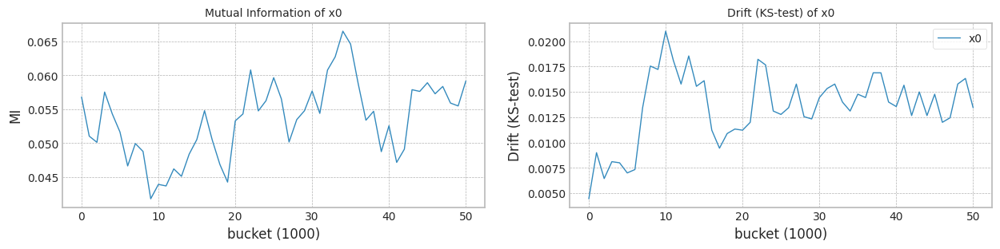

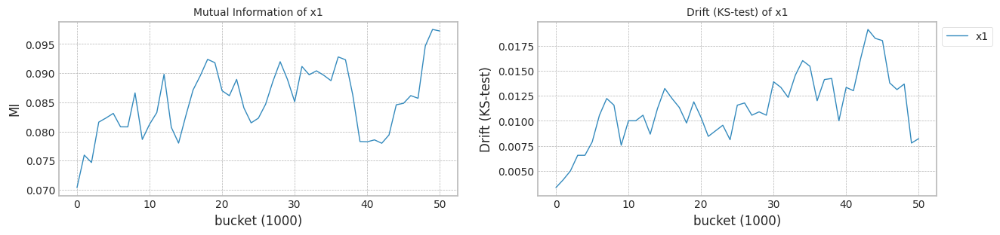

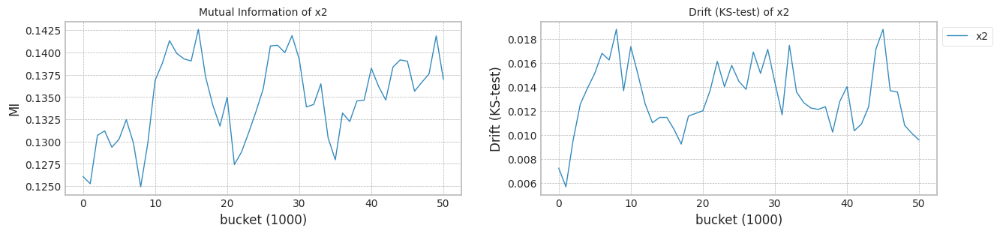

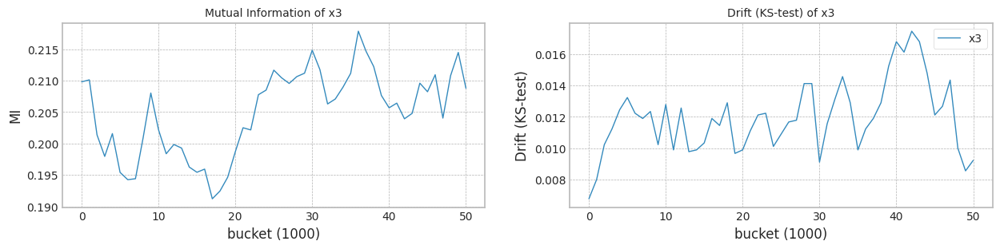

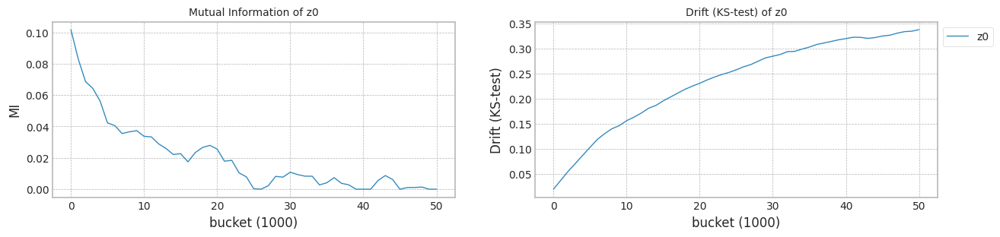

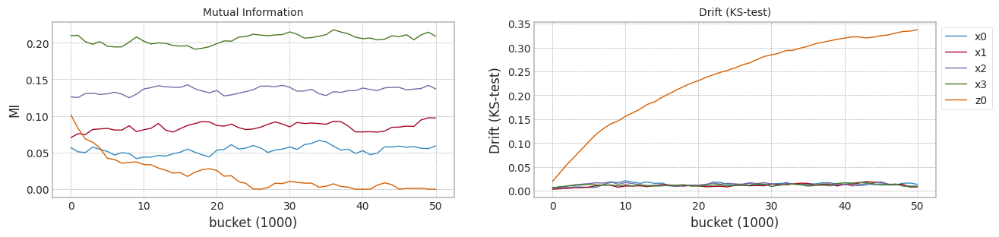

In [64]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [65]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.484659,0.586652,0.404131,0.578093,0.421766,0
1,0.642800,0.615744,0.450917,0.526770,0.529014,0
2,0.665316,0.751975,0.535797,0.191399,0.570549,0
3,0.426377,0.459274,0.304506,0.622063,0.396001,0
4,0.634133,0.507616,0.463434,0.520247,0.561748,0
...,...,...,...,...,...,...
59995,0.428835,0.731754,0.362543,0.750707,0.170510,59
59996,0.388504,0.163578,0.250745,0.650929,1.170890,59
59997,0.623148,0.528739,0.508383,0.646257,-0.984624,59
59998,0.427314,0.797644,0.544189,0.600597,1.585603,59


### Main 실험

In [ ]:
experiment_all(2000,'case1',X1, Y1,train_size, test_size,avaible_range = 300,
               lambda_f2=0.8,trial_count=5,lr_g=0.002,retrain_count=5,weight_init=True)

trial_count: 5
Lambda :  0.8
######################### Retrain 1 Trial 0 for Normal model ###########################
cuda:0
[2023-12-05 14:23:39,617] [INFO] [profiler.py:80:start_profile] Flops profiler started


 48%|████▊     | 954/2000 [00:02<00:02, 424.05it/s]

Early stop: 954
[2023-12-05 14:23:41,873] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 3738825000
precision_recall_fscore: (array([0.87213483, 0.86813187]), array([0.86610132, 0.87408719]), array([0.8691076 , 0.87109935]), array([4481, 4519]))
Test f1 score: 0.8710993494321314
X_live.shape (59000, 6)
Truncate 8000 rows from live_set (59000, 6)
Search MI & Drift...for X_live_set (51, 9000, 6)


 29%|██▉       | 15/51 [00:02<00:06,  5.17it/s]

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|X) \ne P_{t+w}(y|X)$ and $P_t(X) = P_{t+w}(X)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [ ]:
data_size = 60000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [ ]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [ ]:
x1.shape

In [ ]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [ ]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

### 실험

In [ ]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

In [ ]:
experiment_all(2000,'case2',X1, Y1,train_size, test_size,avaible_range = 300,
               lambda_f2=0.8,trial_count=5,lr_g=0.002,retrain_count=5,weight_init=True)

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [ ]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])
data_size = 60000
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 1.0)
    e1 = np.random.normal(0.0,  6*ii/60000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [ ]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

### 실험

In [ ]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

In [ ]:
experiment_all(2000,'case3',X1, Y1,train_size, test_size,avaible_range = 300,
               lambda_f2=0.8,trial_count=5,lr_g=0.002,retrain_count=5,weight_init=True)

## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|X) = P_{t+w}(y|X)$ and $P_t(X) \ne P_{t+w}(X)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [ ]:
seed_everything()

data_size = 60000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 2*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)

### 실험

In [ ]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

In [ ]:
experiment_all(2000,'case4',X1, Y1,train_size, test_size,avaible_range = 300,
               lambda_f2=0.8,trial_count=5,lr_g=0.002,retrain_count=5,weight_init=False)

## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ $x_0$ : No drift
+ $x_1$ : $P_t(y|X) = P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Virtual Drift
+ $x_2$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 감소, Drift 증가
+ $x_3$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 증가, Drift 증가
+ $z_0$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) = P_{t+w}(X)$ 인 Actual Drift, MI 감소, Drift 고정


### Dataset 준비

In [ ]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+6*(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 5*(i/data_size),cor[1])

### 실험

In [ ]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [ ]:
bucket_size = 500
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

In [ ]:
experiment_all(2000,'case5',X1, Y1,train_size, test_size,avaible_range = 400,
               lambda_f2=0.9,trial_count=5,lr_g=0.002,retrain_count=5,weight_init=False)

# Real-world data 의 실험

In [ ]:
from more_itertools import locate
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def find_indices(list_to_check, item_to_find):
    indices = locate(list_to_check, lambda x: x == item_to_find)
    return list(indices)

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int,scaling=True):

    columns = X.columns
    is_Has_bucket = False
    # 'b' 즉, bucket count 가 있으며, 'b'를 제외 시킨다.
    if 'b' in columns:
        print('Dataset has buckets!')
        columns = columns[0:-1]
        buckets = list(X['b'])
        X = X[columns]
        is_Has_bucket = True

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    if scaling:
        scaler_c1 = MinMaxScaler()
        # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
        X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)
    else:
        X = pd.DataFrame(np.concatenate((X[0:train_size], X[train_size:]),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    if is_Has_bucket:
        b_min = min(buckets[-X_live.shape[0]:])
        b_max = max(buckets[-X_live.shape[0]:])
        print(f'bucket range in live set {b_min}~{b_max}')
        for i in range(b_min,b_max+1):
            s = find_indices(buckets,i)
            if len(s) > 0:
                xl = X.iloc[s]
                yl = Y[s]
                X_live_set.append(xl)
                Y_live_set.append(yl)
    else:
        for i in range(int(X_live.shape[0]/test_size)):
            xl = X_live[i*test_size:i*test_size+train_size]
            yl = Y_live[i*test_size:i*test_size+train_size]

            if len(xl) ==  train_size:
                X_live_set.append(xl)
                Y_live_set.append(yl)
            else:
                #print(xl.shape)
                truncate_count = xl.shape[0] #truncate_count + len(xl)
                break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    if is_Has_bucket:
        X['b'] = buckets
    return X,Y

## Loan data 실험

### Dataset 준비

#### Data load

In [ ]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


#### Data 정제

In [ ]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [ ]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

#### Dataset 만들기

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:

X[2010].shape

(11497, 81)

In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [ ]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [ ]:
# MI Top 5, columns
top_columns = list(mi_scores[1:6].index)
top_columns

['last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'term']

### #1 고정 size로 bucket 만들기

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015])) #,X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015])) #,Y[2016],Y[2017]))
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = pd.DataFrame(X2[s],columns=COLUMNS)
Y3 = Y2[s]

##### do

columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.30689, Min 0.01716, Mean 0.16391, Std 0.11465
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (77896, 5)
Truncate 17896 rows from live_set (77896, 5)
Search MI & Drift...for X_live_set (15, 20000, 5)


100%|██████████| 15/15 [00:06<00:00,  2.26it/s]


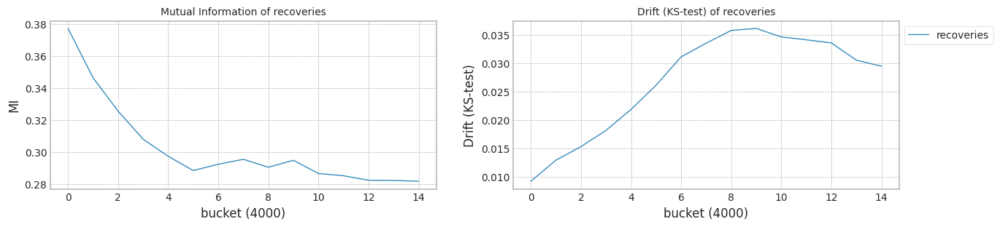

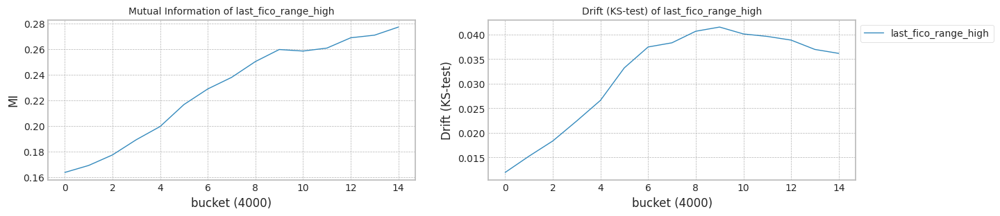

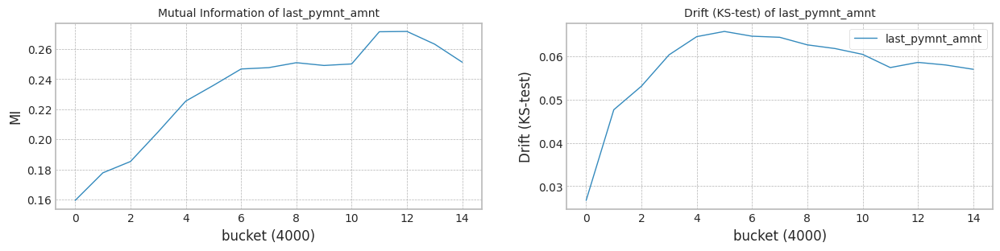

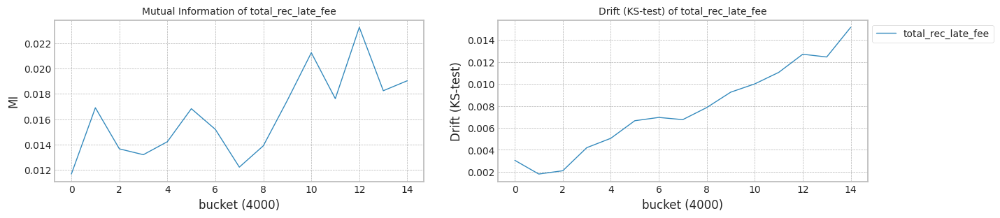

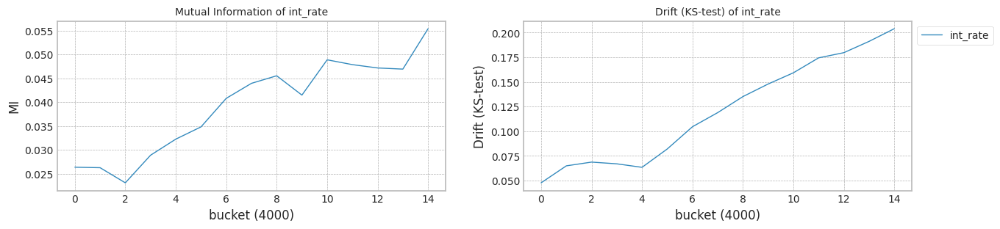

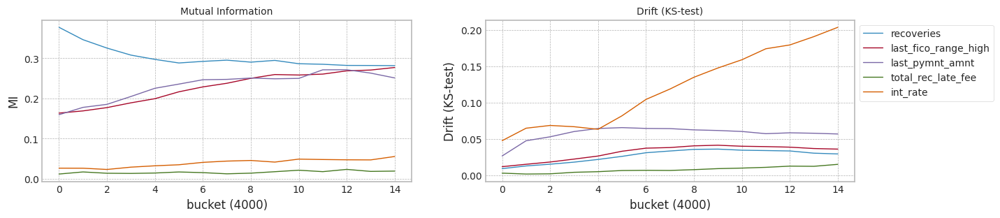

In [ ]:
seed_everything()

#s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
top_columns = list(mi_scores[0:5].index)
#top_columns = ['int_rate', 'last_pymnt_amnt', 'fico_range_high', 'inq_last_6mths', 'total_rec_int'] #['recoveries', 'last_pymnt_amnt', 'total_rec_late_fee','total_rec_int','Y']  ## 'recoveries',
print('columns:',top_columns)
#print(s.shape)
X4 = X3[top_columns]

train_size = 10000*2
test_size = 2000*2

X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

bucket_size = 500*2
X1['b'] = [int(b/bucket_size) for b in X1.index.values]

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,recoveries,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,int_rate,b
0,0.0,0.887059,0.000163,0.000000,0.170543,0
1,0.0,0.869412,0.000693,0.000000,0.411822,0
2,0.0,0.904706,0.023736,0.000000,0.344477,0
3,0.0,0.845882,0.005132,0.000000,0.411822,0
4,0.0,0.951765,0.007995,0.000000,0.153585,0
...,...,...,...,...,...,...
127963,0.0,0.622353,0.006972,0.000000,0.093508,127
127964,0.0,0.857647,0.747707,0.194747,1.227229,127
127965,0.0,0.875294,0.062245,0.000000,0.242248,127
127966,0.0,0.681176,0.017652,0.000000,0.395833,127


trial_count: 5
Lambda :  0.8
######################### Retrain 1 Trial 0 for Normal model ###########################
cuda:0
[2023-12-03 10:08:33,263] [INFO] [profiler.py:80:start_profile] Flops profiler started


100%|██████████| 2000/2000 [00:05<00:00, 348.40it/s]

Early stop: 1999
[2023-12-03 10:08:39,010] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89943074, 0.88250818]), array([0.29867675, 0.99370023]), array([0.44843898, 0.93480935]), array([ 3174, 16826]))
Test f1 score: 0.934809348093481
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9173319390967674
inference_flops: 226200000
######################### Retrain 1 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:08:50,160] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:08:50,162] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:18<00:00, 105.38it/s]

[2023-12-03 10:09:22,463] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:09:22,465] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.99215505, 0.94257837]), array([0.6773787 , 0.99898966]), array([0.80509268, 0.96996451]), array([ 3174, 16826]))
Test f1 score: 0.9699645113823249
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.36it/s]

mean of drift:
recoveries              0.863871
last_fico_range_high    0.475187
last_pymnt_amnt         0.528398
total_rec_late_fee      0.965750
int_rate                0.130821
dtype: float64
Mean F1 for all data: 0.957741204656209
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.957741204656209
######################### Retrain 1 Trial 1 for Normal model ###########################
cuda:0
[2023-12-03 10:09:33,522] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:05<00:00, 346.33it/s]

Early stop: 1999
[2023-12-03 10:09:39,303] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89495451, 0.88867011]), array([0.34089477, 0.99245216]), array([0.49372576, 0.93769829]), array([ 3174, 16826]))
Test f1 score: 0.9376982901423476
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9212417862658753
inference_flops: 226200000
######################### Retrain 1 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:09:50,624] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:09:50,627] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:19<00:00, 104.36it/s]

[2023-12-03 10:10:23,244] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:10:23,245] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98900048, 0.93824334]), array([0.65154379, 0.99863307]), array([0.78556505, 0.96749676]), array([ 3174, 16826]))
Test f1 score: 0.9674967611918814
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.832729
last_fico_range_high    0.456425
last_pymnt_amnt         0.505794
total_rec_late_fee      0.965750
int_rate                0.109156
dtype: float64
Mean F1 for all data: 0.9510429341779746
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9543920694170918
######################### Retrain 1 Trial 2 for Normal model ###########################
cuda:0
[2023-12-03 10:10:34,154] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:05<00:00, 340.67it/s]

Early stop: 1999
[2023-12-03 10:10:40,031] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89990467, 0.88232811]), array([0.29741651, 0.99375966]), array([0.44707554, 0.93473461]), array([ 3174, 16826]))
Test f1 score: 0.934734606031808
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9172405727818584
inference_flops: 226200000
######################### Retrain 1 Trial 2 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:10:51,244] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:10:51,246] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:19<00:00, 102.00it/s]

[2023-12-03 10:11:24,417] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:11:24,419] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98214286, 0.94515766]), array([0.6931317 , 0.99762273]), array([0.81270779, 0.97068178]), array([ 3174, 16826]))
Test f1 score: 0.9706817787544093
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]

mean of drift:
recoveries              0.869952
last_fico_range_high    0.462038
last_pymnt_amnt         0.529694
total_rec_late_fee      0.965750
int_rate                0.133481
dtype: float64
Mean F1 for all data: 0.9522551587041203
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 1 Trial 3 for Normal model ###########################
cuda:0
[2023-12-03 10:11:35,777] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:06<00:00, 331.66it/s]

Early stop: 1999
[2023-12-03 10:11:41,814] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90482399, 0.90328171]), array([0.43730309, 0.99132295]), array([0.58963466, 0.94525672]), array([ 3174, 16826]))
Test f1 score: 0.9452567154029242
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9332974273094798
inference_flops: 226200000
######################### Retrain 1 Trial 3 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:11:52,999] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:11:53,002] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:19<00:00, 101.33it/s]

[2023-12-03 10:12:26,402] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:12:26,403] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.92627518, 0.94266146]), array([0.68084436, 0.98977772]), array([0.78481932, 0.9656452 ]), array([ 3174, 16826]))
Test f1 score: 0.9656452033745977
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]

mean of drift:
recoveries              0.839398
last_fico_range_high    0.407798
last_pymnt_amnt         0.517254
total_rec_late_fee      0.965750
int_rate                0.127600
dtype: float64
Mean F1 for all data: 0.9441692001956904
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9516490464410474
######################### Retrain 1 Trial 4 for Normal model ###########################
cuda:0
[2023-12-03 10:12:37,535] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:05<00:00, 345.65it/s]

Early stop: 1999
[2023-12-03 10:12:43,328] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90401567, 0.88139523]), array([0.29080025, 0.99417568]), array([0.44004768, 0.93439464]), array([ 3174, 16826]))
Test f1 score: 0.934394637620444
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9164770475937788
inference_flops: 226200000
######################### Retrain 1 Trial 4 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:12:54,505] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:12:54,507] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:19<00:00, 104.68it/s]

[2023-12-03 10:13:27,036] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:13:27,037] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.95930736, 0.94584511]), array([0.69817265, 0.99441341]), array([0.80816922, 0.96952138]), array([ 3174, 16826]))
Test f1 score: 0.9695213813883415
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.871642
last_fico_range_high    0.360342
last_pymnt_amnt         0.510163
total_rec_late_fee      0.911712
int_rate                0.128648
dtype: float64
Mean F1 for all data: 0.9549246120285516
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 1 Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.34it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:13:44,155] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:13:44,157] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:14:13,701] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:14:13,702] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:35<01:52,  9.36s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


100%|██████████| 26/26 [00:40<00:00,  1.57s/it]


Early stop at  [1999]
Train flops  [31480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9700241881612239
G_CDTL+AUE median: 0.9700241881612239
######################### Retrain 1 Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:10<00:21,  1.75s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:15<00:00,  1.68it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9451148923286711
SEA median: 0.9451148923286711
######################### Retrain 1 Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:14<00:35,  2.98s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:19<00:00,  1.32it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9464873402738593
AUE median: 0.9464873402738593
######################### Retrain 1 Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.37it/s]

Ensemble_DTEL train flops: 3128520000


 54%|█████▍    | 14/26 [00:14<00:35,  2.94s/it]

Ensemble_DTEL train flops: 3359940000


100%|██████████| 26/26 [00:19<00:00,  1.34it/s]


Early stop at  [1797, 1930]
Train flops  [3128520000, 3359940000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481366252834901
DTEL median: 0.9481366252834901
######################### Retrain 1 Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.35it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:15:19,743] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:15:19,745] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:15:25,108] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:15:25,109] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:11<00:24,  2.05s/it]

G-CDTL train flops: 476000000 3941000000 979620000 5396620000


100%|██████████| 26/26 [00:16<00:00,  1.55it/s]


Early stop at  [562]
Train flops  [5396620000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9695890622867345
G_CDTL+AUE median: 0.9698066252239792
######################### Retrain 1 Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:10<00:21,  1.79s/it]

Ensemble_SEA train flops: 3380820000


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  [1942]
Train flops  [3380820000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9473868750516511
SEA median: 0.9462508836901611
######################### Retrain 1 Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:14<00:36,  3.07s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:19<00:00,  1.31it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.948618925763152
AUE median: 0.9475531330185056
######################### Retrain 1 Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.39it/s]

Ensemble_DTEL train flops: 3480000000


 54%|█████▍    | 14/26 [00:13<00:33,  2.81s/it]

Ensemble_DTEL train flops: 2771820000


100%|██████████| 26/26 [00:19<00:00,  1.36it/s]


Early stop at  [1999, 1592]
Train flops  [3480000000, 2771820000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9503949845812814
DTEL median: 0.9492658049323857
######################### Retrain 1 Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 2 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.32it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:16:31,230] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:16:31,232] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:16:42,804] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:16:42,805] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:17<00:47,  3.93s/it]

G-CDTL train flops: 5971000000 4998000000 1242360000 12211360000


100%|██████████| 26/26 [00:22<00:00,  1.14it/s]


Early stop at  [713]
Train flops  [12211360000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9723429069162093
G_CDTL+AUE median: 0.9700241881612239
######################### Retrain 1 Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:10<00:21,  1.76s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448819461568483
SEA median: 0.9451148923286711
######################### Retrain 1 Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:10<00:21,  1.77s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9465408258674738
AUE median: 0.9465408258674738
######################### Retrain 1 Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.38it/s]

Ensemble_DTEL train flops: 3480000000


 54%|█████▍    | 14/26 [00:18<00:52,  4.35s/it]

Ensemble_DTEL train flops: 2846640000


100%|██████████| 26/26 [00:24<00:00,  1.08it/s]


Early stop at  [1999, 1635]
Train flops  [3480000000, 2846640000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9479919038286735
DTEL median: 0.9481366252834901
######################### Retrain 1 Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 3 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.30it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:17:49,595] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:17:49,597] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:18:06,680] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:18:06,682] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:23<01:07,  5.59s/it]

G-CDTL train flops: 13622000000 4046000000 1005720000 18673720000


100%|██████████| 26/26 [00:28<00:00,  1.09s/it]


Early stop at  [577]
Train flops  [18673720000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9678509521183485
G_CDTL+AUE median: 0.9698066252239792
######################### Retrain 1 Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:10<00:21,  1.75s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9533366373372302
SEA median: 0.9462508836901611
######################### Retrain 1 Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:10<00:21,  1.77s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9550572621035779
AUE median: 0.9475798758153129
######################### Retrain 1 Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.36it/s]

Ensemble_DTEL train flops: 3480000000


 54%|█████▍    | 14/26 [00:13<00:32,  2.70s/it]

Ensemble_DTEL train flops: 2397720000


100%|██████████| 26/26 [00:18<00:00,  1.40it/s]


Early stop at  [1999, 1377]
Train flops  [3480000000, 2397720000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9562683229318162
DTEL median: 0.9492658049323857
######################### Retrain 1 Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 4 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.33it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:19:07,880] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:19:07,883] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:19:21,120] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:19:21,122] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:19<00:53,  4.43s/it]

G-CDTL train flops: 8253000000 4599000000 1143180000 13995180000


100%|██████████| 26/26 [00:24<00:00,  1.06it/s]


Early stop at  [656]
Train flops  [13995180000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9725696398040016
G_CDTL+AUE median: 0.9700241881612239
######################### Retrain 1 Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:10<00:21,  1.78s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9445456483767865
SEA median: 0.9451148923286711
######################### Retrain 1 Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:16<00:43,  3.63s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:21<00:00,  1.19it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9460475941688318
AUE median: 0.9465408258674738
######################### Retrain 1 Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.30it/s]

Ensemble_DTEL train flops: 2710920000


 54%|█████▍    | 14/26 [00:13<00:32,  2.69s/it]

Ensemble_DTEL train flops: 3093720000


100%|██████████| 26/26 [00:18<00:00,  1.39it/s]


Early stop at  [1557, 1777]
Train flops  [2710920000, 3093720000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480915205836665
DTEL median: 0.9481366252834901


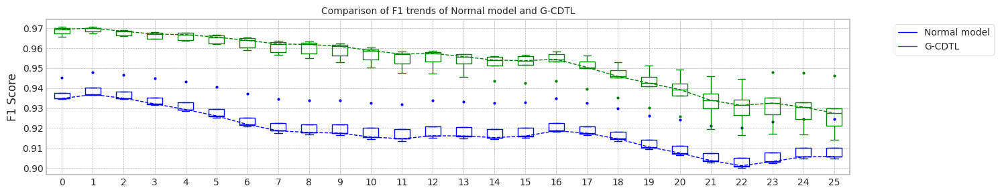

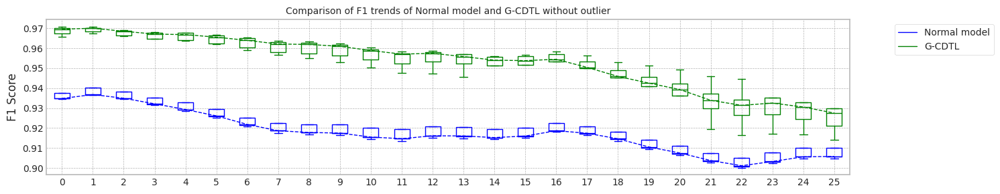

max_mean_trial= 0


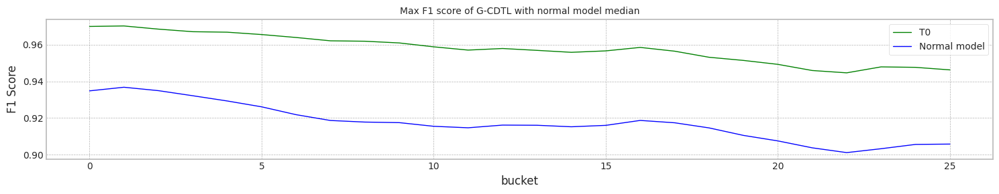

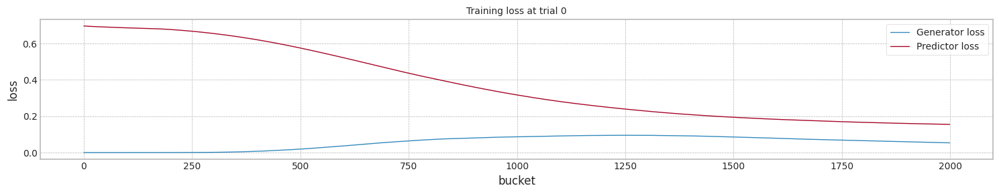

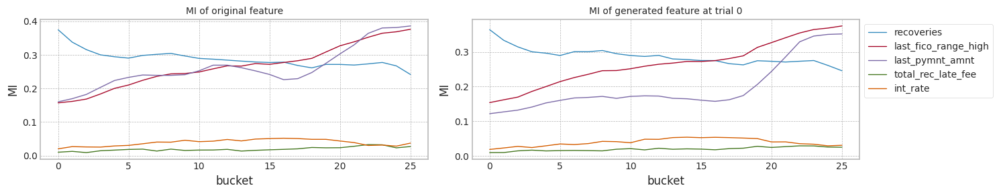

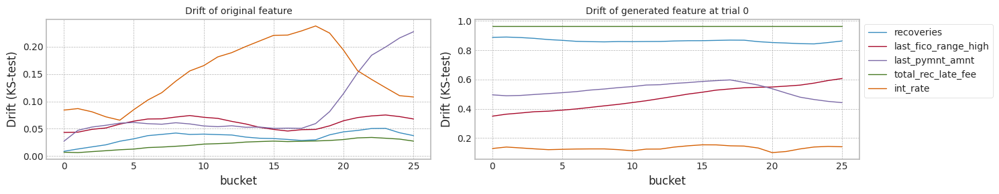

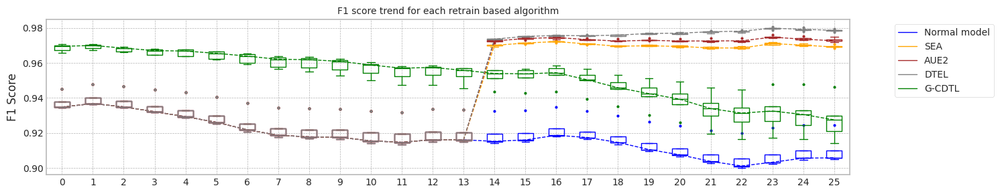

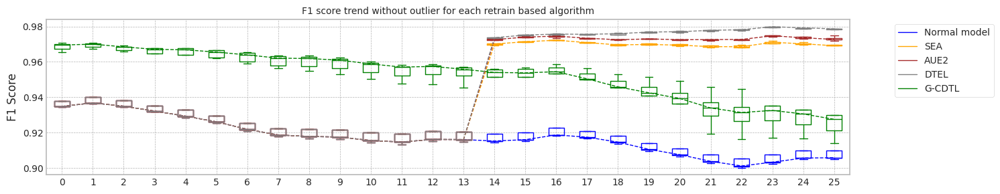

Base elapsed time (inference elapsed time of normal model, median (ms)): 11.162230253219604
Base flops (inference flops of normal model, median): 226200000.0


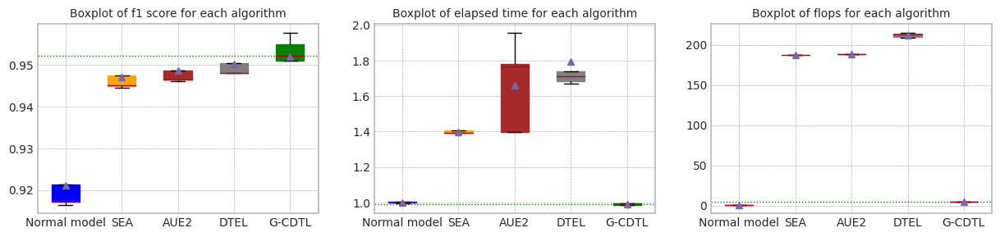

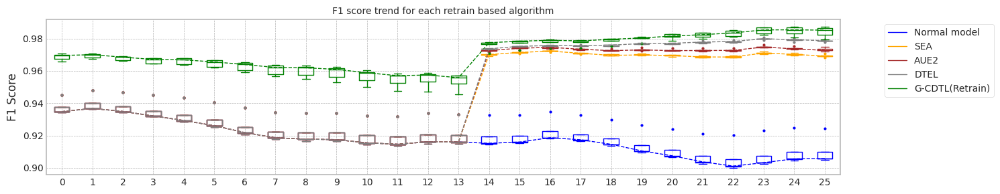

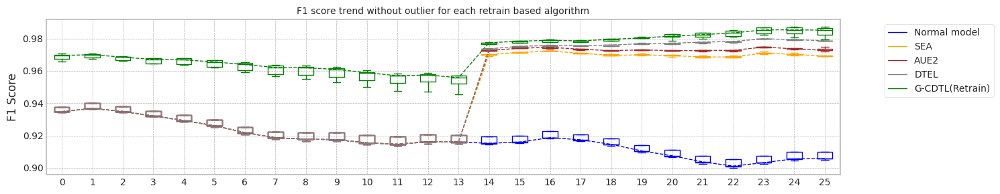

Base elapsed time (inference elapsed time of normal model, median (ms)): 11.162230253219604
Base flops (train + inference flops of normal model, median): 17626200000.0


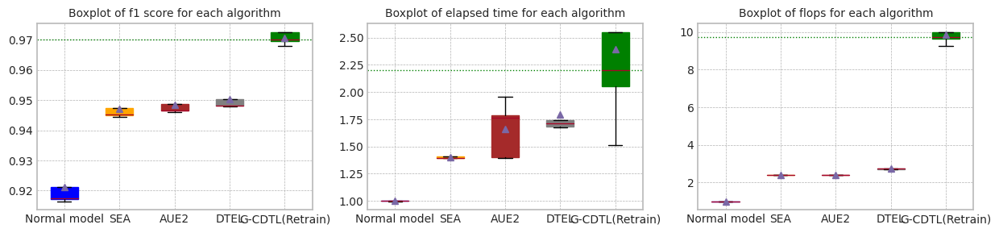

Base elapsed time (inference elapsed time of normal model, median (ms)): 11.162230253219604


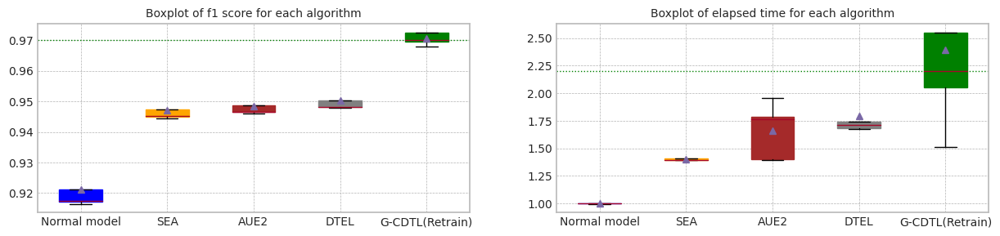

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.917332,0.905780,11.125378,1.740000e+10,226200000.0,1.762620e+10
1,1.0,0.937698,0.940101,0.921242,0.909930,11.297937,1.740000e+10,226200000.0,1.762620e+10
2,2.0,0.934735,0.936654,0.917241,0.905585,11.190939,1.740000e+10,226200000.0,1.762620e+10
3,3.0,0.945257,0.947906,0.933297,0.924414,11.162230,1.740000e+10,226200000.0,1.762620e+10
4,4.0,0.934395,0.936394,0.916477,0.904803,11.155185,1.740000e+10,226200000.0,1.762620e+10
5,median,0.934809,0.936785,0.917332,0.905780,11.162230,1.740000e+10,226200000.0,1.762620e+10
6,std,0.004601,0.004902,0.007058,0.008247,0.066602,0.000000e+00,0.0,0.000000e+00


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.957741,0.946251,11.034183,1.574000e+11,1.136200e+09,1.585362e+11
1,1.0,0.967497,0.968403,0.951043,0.927482,10.880001,1.574000e+11,1.136200e+09,1.585362e+11
2,2.0,0.970682,0.970795,0.952255,0.921099,11.326699,1.574000e+11,1.136200e+09,1.585362e+11
3,3.0,0.965645,0.967411,0.944169,0.914014,11.108236,1.574000e+11,1.136200e+09,1.585362e+11
4,4.0,0.969521,0.970020,0.954925,0.929771,11.026238,1.574000e+11,1.136200e+09,1.585362e+11
5,median,0.969521,0.970020,0.952255,0.927482,11.034183,1.574000e+11,1.136200e+09,1.585362e+11
6,std,0.002060,0.001409,0.005094,0.012035,0.163191,0.000000e+00,0.000000e+00,0.000000e+00


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.945115,0.969129,15.549399,2.088000e+10,2.144550e+10,4.232550e+10
1,1.0,0.937698,0.940101,0.947387,0.969562,15.719837,2.078082e+10,2.134632e+10,4.212714e+10
2,2.0,0.934735,0.936654,0.944882,0.969133,15.560307,2.088000e+10,2.144550e+10,4.232550e+10
3,3.0,0.945257,0.947906,0.953337,0.970685,15.564649,2.088000e+10,2.144550e+10,4.232550e+10
4,4.0,0.934395,0.936394,0.944546,0.968325,15.710462,2.088000e+10,2.144550e+10,4.232550e+10
5,median,0.934809,0.936785,0.945115,0.969133,15.564649,2.088000e+10,2.144550e+10,4.232550e+10
6,std,0.004601,0.004902,0.003686,0.000862,0.086253,4.435464e+07,4.435464e+07,8.870929e+07


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.946487,0.973613,19.714631,2.088000e+10,2.167170e+10,4.255170e+10
1,1.0,0.937698,0.940101,0.948619,0.972721,19.903574,2.088000e+10,2.167170e+10,4.255170e+10
2,2.0,0.934735,0.936654,0.946541,0.972659,15.617208,2.088000e+10,2.167170e+10,4.255170e+10
3,3.0,0.945257,0.947906,0.955057,0.974869,15.578570,2.088000e+10,2.167170e+10,4.255170e+10
4,4.0,0.934395,0.936394,0.946048,0.972049,21.856126,2.088000e+10,2.167170e+10,4.255170e+10
5,median,0.934809,0.936785,0.946541,0.972721,19.714631,2.088000e+10,2.167170e+10,4.255170e+10
6,std,0.004601,0.004902,0.003772,0.001095,2.808397,0.000000e+00,0.000000e+00,0.000000e+00


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.948137,0.978422,19.428567,2.388846e+10,2.480196e+10,4.869042e+10
1,1.0,0.937698,0.940101,0.950395,0.978751,19.119021,2.365182e+10,2.456532e+10,4.821714e+10
2,2.0,0.934735,0.936654,0.947992,0.977575,24.164656,2.372664e+10,2.464014e+10,4.836678e+10
3,3.0,0.945257,0.947906,0.956268,0.978655,18.660266,2.327772e+10,2.419122e+10,4.746894e+10
4,4.0,0.934395,0.936394,0.948092,0.979501,18.782873,2.320464e+10,2.411814e+10,4.732278e+10
5,median,0.934809,0.936785,0.948137,0.978655,19.119021,2.365182e+10,2.456532e+10,4.821714e+10
6,std,0.004601,0.004902,0.003551,0.000693,2.330154,2.956070e+08,2.956070e+08,5.912140e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.970024,0.982416,40.835278,1.888800e+11,238800000.0,1.891188e+11
1,1.0,0.967497,0.968403,0.969589,0.985182,16.846731,1.627966e+11,238800000.0,1.630354e+11
2,2.0,0.970682,0.970795,0.972343,0.986652,22.889637,1.696114e+11,238800000.0,1.698502e+11
3,3.0,0.965645,0.967411,0.967851,0.979245,28.486918,1.760737e+11,238800000.0,1.763125e+11
4,4.0,0.969521,0.970020,0.972570,0.987343,24.574425,1.713952e+11,238800000.0,1.716340e+11
5,median,0.969521,0.970020,0.970024,0.985182,24.574425,1.713952e+11,238800000.0,1.716340e+11
6,std,0.002060,0.001409,0.001984,0.003339,8.931957,9.707814e+09,0.0,9.707814e+09


In [ ]:
org_df,gcd_df,sea_df,aue_df,dte_df,gea_df = drift_tolerant2(2000,'LC_A',X1, Y1,train_size, test_size,avaible_range = 1000,
                                                            lambda_f2=0.8,trial_count=5,lr_g=0.0002,
                                                            retrain_count=1,weight_init=True)

trial_count: 5
Lambda :  0.8
######################### Retrain 1 Trial 0 for Normal model ###########################
cuda:0
[2023-12-03 10:29:34,073] [INFO] [profiler.py:80:start_profile] Flops profiler started


100%|██████████| 2000/2000 [00:06<00:00, 302.54it/s]

Early stop: 1999
[2023-12-03 10:29:40,690] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89943074, 0.88250818]), array([0.29867675, 0.99370023]), array([0.44843898, 0.93480935]), array([ 3174, 16826]))
Test f1 score: 0.934809348093481
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9173319390967674
inference_flops: 226200000
######################### Retrain 1 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:29:51,636] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:29:51,638] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:12<00:00, 163.14it/s]

[2023-12-03 10:30:12,182] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:30:12,183] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.99215505, 0.94257837]), array([0.6773787 , 0.99898966]), array([0.80509268, 0.96996451]), array([ 3174, 16826]))
Test f1 score: 0.9699645113823249
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]

mean of drift:
recoveries              0.863871
last_fico_range_high    0.475187
last_pymnt_amnt         0.528398
total_rec_late_fee      0.965750
int_rate                0.130821
dtype: float64
Mean F1 for all data: 0.957741204656209
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.957741204656209
######################### Retrain 1 Trial 1 for Normal model ###########################
cuda:0
[2023-12-03 10:30:22,939] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:03<00:00, 503.50it/s]

Early stop: 1999
[2023-12-03 10:30:26,918] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89495451, 0.88867011]), array([0.34089477, 0.99245216]), array([0.49372576, 0.93769829]), array([ 3174, 16826]))
Test f1 score: 0.9376982901423476
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9212417862658753
inference_flops: 226200000
######################### Retrain 1 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:30:37,721] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:30:37,723] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:12<00:00, 158.23it/s]

[2023-12-03 10:30:58,731] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:30:58,732] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98900048, 0.93824334]), array([0.65154379, 0.99863307]), array([0.78556505, 0.96749676]), array([ 3174, 16826]))
Test f1 score: 0.9674967611918814
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

mean of drift:
recoveries              0.832729
last_fico_range_high    0.456425
last_pymnt_amnt         0.505794
total_rec_late_fee      0.965750
int_rate                0.109156
dtype: float64
Mean F1 for all data: 0.9510429341779746
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9543920694170918
######################### Retrain 1 Trial 2 for Normal model ###########################
cuda:0
[2023-12-03 10:31:09,332] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 498.29it/s]

Early stop: 1999
[2023-12-03 10:31:13,353] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89990467, 0.88232811]), array([0.29741651, 0.99375966]), array([0.44707554, 0.93473461]), array([ 3174, 16826]))
Test f1 score: 0.934734606031808
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9172405727818584
inference_flops: 226200000
######################### Retrain 1 Trial 2 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:31:24,311] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:31:24,313] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:12<00:00, 159.34it/s]

[2023-12-03 10:31:45,229] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:31:45,230] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98214286, 0.94515766]), array([0.6931317 , 0.99762273]), array([0.81270779, 0.97068178]), array([ 3174, 16826]))
Test f1 score: 0.9706817787544093
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

mean of drift:
recoveries              0.869952
last_fico_range_high    0.462038
last_pymnt_amnt         0.529694
total_rec_late_fee      0.965750
int_rate                0.133481
dtype: float64
Mean F1 for all data: 0.9522551587041203
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 1 Trial 3 for Normal model ###########################
cuda:0
[2023-12-03 10:31:55,825] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:03<00:00, 500.95it/s]

Early stop: 1999
[2023-12-03 10:31:59,823] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90482399, 0.90328171]), array([0.43730309, 0.99132295]), array([0.58963466, 0.94525672]), array([ 3174, 16826]))
Test f1 score: 0.9452567154029242
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9332974273094798
inference_flops: 226200000
######################### Retrain 1 Trial 3 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:32:10,729] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:32:10,731] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:12<00:00, 156.85it/s]

[2023-12-03 10:32:32,044] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:32:32,045] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.92627518, 0.94266146]), array([0.68084436, 0.98977772]), array([0.78481932, 0.9656452 ]), array([ 3174, 16826]))
Test f1 score: 0.9656452033745977
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

mean of drift:
recoveries              0.839398
last_fico_range_high    0.407798
last_pymnt_amnt         0.517254
total_rec_late_fee      0.965750
int_rate                0.127600
dtype: float64
Mean F1 for all data: 0.9441692001956904
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9516490464410474
######################### Retrain 1 Trial 4 for Normal model ###########################
cuda:0
[2023-12-03 10:32:42,632] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 490.74it/s]

Early stop: 1999
[2023-12-03 10:32:46,713] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90401567, 0.88139523]), array([0.29080025, 0.99417568]), array([0.44004768, 0.93439464]), array([ 3174, 16826]))
Test f1 score: 0.934394637620444
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9164770475937788
inference_flops: 226200000
######################### Retrain 1 Trial 4 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:32:57,695] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:32:57,698] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:12<00:00, 158.22it/s]

[2023-12-03 10:33:18,807] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:33:18,809] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.95930736, 0.94584511]), array([0.69817265, 0.99441341]), array([0.80816922, 0.96952138]), array([ 3174, 16826]))
Test f1 score: 0.9695213813883415
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.871642
last_fico_range_high    0.360342
last_pymnt_amnt         0.510163
total_rec_late_fee      0.911712
int_rate                0.128648
dtype: float64
Mean F1 for all data: 0.9549246120285516
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 1 Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.34it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:33:35,524] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:33:35,526] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:33:54,587] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:33:54,589] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:25<01:14,  6.19s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


100%|██████████| 26/26 [00:30<00:00,  1.16s/it]


Early stop at  [1999]
Train flops  [31480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9700241881612239
G_CDTL+AUE median: 0.9700241881612239
######################### Retrain 1 Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:15,  1.25s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.91it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9451148923286711
SEA median: 0.9451148923286711
######################### Retrain 1 Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:14,  1.22s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.93it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9464873402738593
AUE median: 0.9464873402738593
######################### Retrain 1 Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.46it/s]

Ensemble_DTEL train flops: 3128520000


 54%|█████▍    | 14/26 [00:10<00:22,  1.91s/it]

Ensemble_DTEL train flops: 3359940000


100%|██████████| 26/26 [00:15<00:00,  1.65it/s]


Early stop at  [1797, 1930]
Train flops  [3128520000, 3359940000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481366252834901
DTEL median: 0.9481366252834901
######################### Retrain 1 Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.40it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:34:48,577] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:34:48,580] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:34:52,024] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:34:52,026] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:09<00:17,  1.46s/it]

G-CDTL train flops: 476000000 3941000000 979620000 5396620000


100%|██████████| 26/26 [00:14<00:00,  1.80it/s]


Early stop at  [562]
Train flops  [5396620000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9695890622867345
G_CDTL+AUE median: 0.9698066252239792
######################### Retrain 1 Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:14,  1.19s/it]

Ensemble_SEA train flops: 3380820000


100%|██████████| 26/26 [00:13<00:00,  1.95it/s]


Early stop at  [1942]
Train flops  [3380820000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9473868750516511
SEA median: 0.9462508836901611
######################### Retrain 1 Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:14,  1.21s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.93it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.948618925763152
AUE median: 0.9475531330185056
######################### Retrain 1 Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.45it/s]

Ensemble_DTEL train flops: 3480000000


 54%|█████▍    | 14/26 [00:10<00:22,  1.89s/it]

Ensemble_DTEL train flops: 2771820000


100%|██████████| 26/26 [00:15<00:00,  1.65it/s]


Early stop at  [1999, 1592]
Train flops  [3480000000, 2771820000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9503949845812814
DTEL median: 0.9492658049323857
######################### Retrain 1 Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 2 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.44it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:35:45,721] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:35:45,723] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:35:53,116] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:35:53,117] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:13<00:31,  2.65s/it]

G-CDTL train flops: 5971000000 4998000000 1242360000 12211360000


100%|██████████| 26/26 [00:18<00:00,  1.42it/s]


Early stop at  [713]
Train flops  [12211360000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9723429069162093
G_CDTL+AUE median: 0.9700241881612239
######################### Retrain 1 Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:14,  1.23s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.93it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448819461568483
SEA median: 0.9451148923286711
######################### Retrain 1 Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:14,  1.22s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.92it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9465408258674738
AUE median: 0.9465408258674738
######################### Retrain 1 Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.40it/s]

Ensemble_DTEL train flops: 3480000000


 54%|█████▍    | 14/26 [00:10<00:22,  1.91s/it]

Ensemble_DTEL train flops: 2846640000


100%|██████████| 26/26 [00:15<00:00,  1.65it/s]


Early stop at  [1999, 1635]
Train flops  [3480000000, 2846640000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9479919038286735
DTEL median: 0.9481366252834901
######################### Retrain 1 Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 3 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.45it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:36:46,926] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:36:46,928] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:36:57,943] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:36:57,946] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:16<00:44,  3.74s/it]

G-CDTL train flops: 13622000000 4046000000 1005720000 18673720000


100%|██████████| 26/26 [00:21<00:00,  1.19it/s]


Early stop at  [577]
Train flops  [18673720000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9678509521183485
G_CDTL+AUE median: 0.9698066252239792
######################### Retrain 1 Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:15,  1.25s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.93it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9533366373372302
SEA median: 0.9462508836901611
######################### Retrain 1 Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:15,  1.26s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.90it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9550572621035779
AUE median: 0.9475798758153129
######################### Retrain 1 Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.39it/s]

Ensemble_DTEL train flops: 3480000000


 54%|█████▍    | 14/26 [00:10<00:21,  1.82s/it]

Ensemble_DTEL train flops: 2397720000


100%|██████████| 26/26 [00:15<00:00,  1.68it/s]


Early stop at  [1999, 1377]
Train flops  [3480000000, 2397720000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9562683229318162
DTEL median: 0.9492658049323857
######################### Retrain 1 Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Retrain 1 Trial 4 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.42it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:37:51,611] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:37:51,614] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:38:00,230] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:38:00,232] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:14<00:36,  3.02s/it]

G-CDTL train flops: 8253000000 4599000000 1143180000 13995180000


100%|██████████| 26/26 [00:19<00:00,  1.33it/s]


Early stop at  [656]
Train flops  [13995180000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9725696398040016
G_CDTL+AUE median: 0.9700241881612239
######################### Retrain 1 Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:14,  1.24s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.93it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9445456483767865
SEA median: 0.9451148923286711
######################### Retrain 1 Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 54%|█████▍    | 14/26 [00:08<00:14,  1.24s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:13<00:00,  1.90it/s]


Early stop at  [1999]
Train flops  [3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9460475941688318
AUE median: 0.9465408258674738
######################### Retrain 1 Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 50%|█████     | 13/26 [00:05<00:05,  2.45it/s]

Ensemble_DTEL train flops: 2710920000


 54%|█████▍    | 14/26 [00:10<00:22,  1.86s/it]

Ensemble_DTEL train flops: 3093720000


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  [1557, 1777]
Train flops  [2710920000, 3093720000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480915205836665
DTEL median: 0.9481366252834901


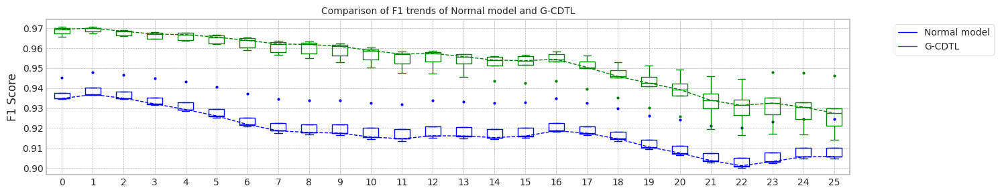

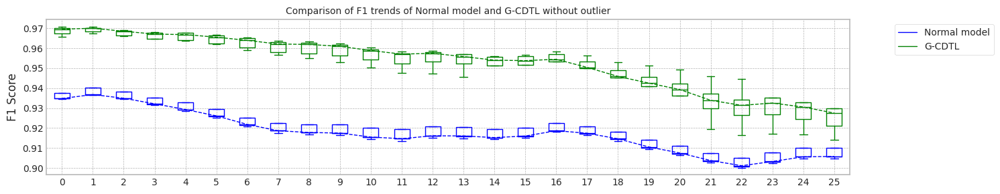

max_mean_trial= 0


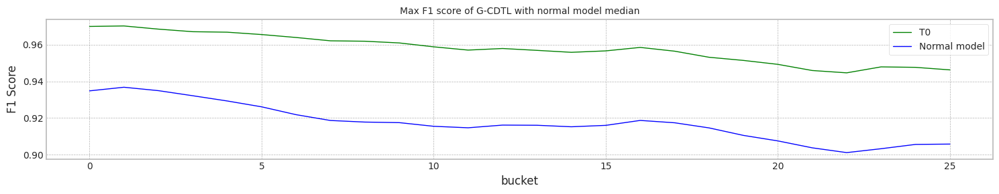

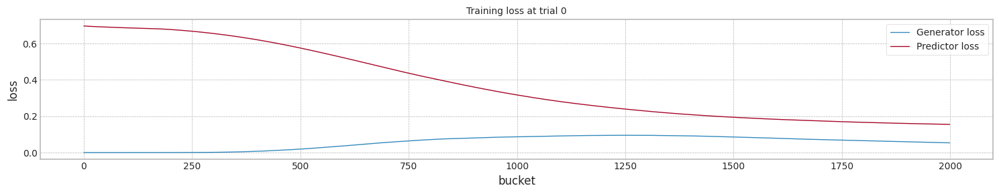

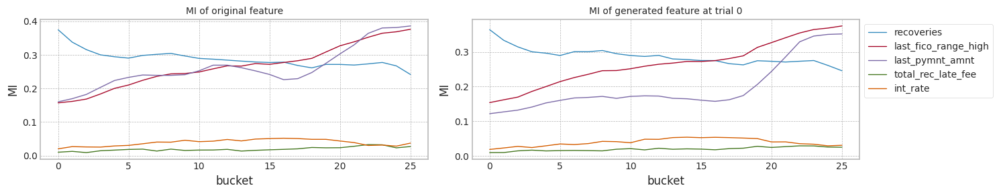

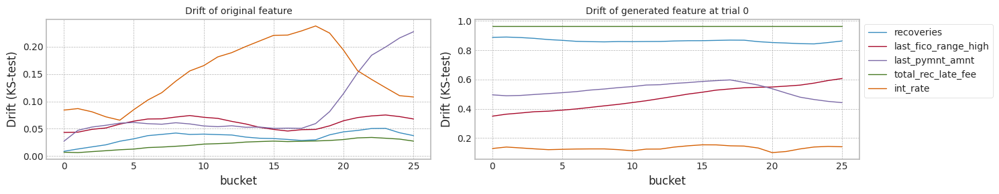

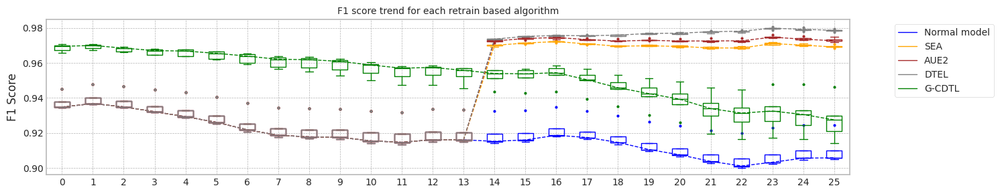

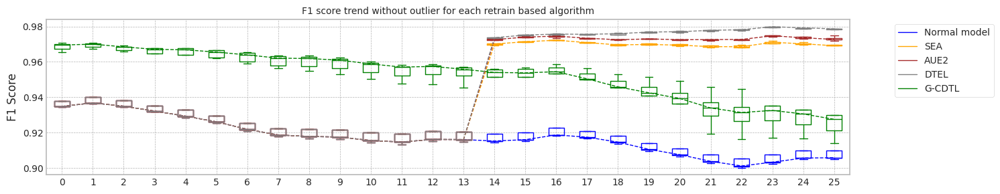

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.926462650299072
Base flops (inference flops of normal model, median): 226200000.0


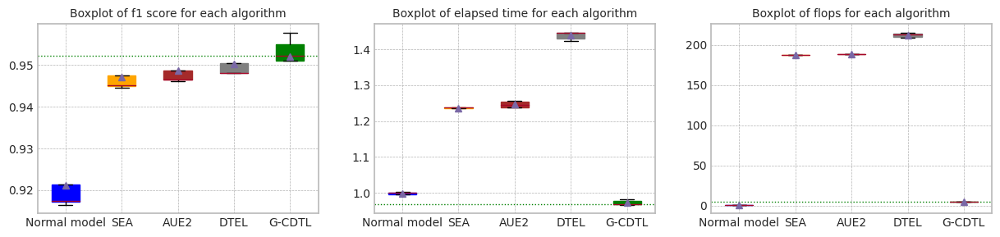

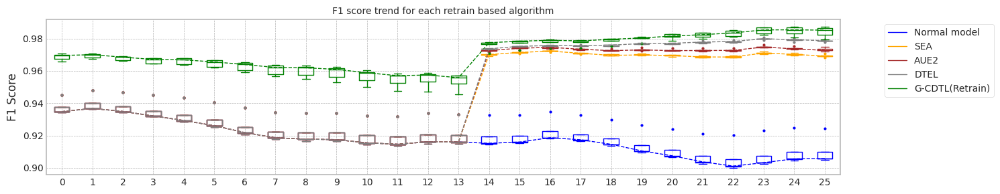

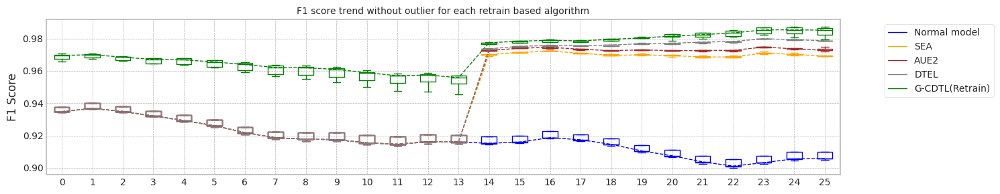

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.926462650299072
Base flops (train + inference flops of normal model, median): 17626200000.0


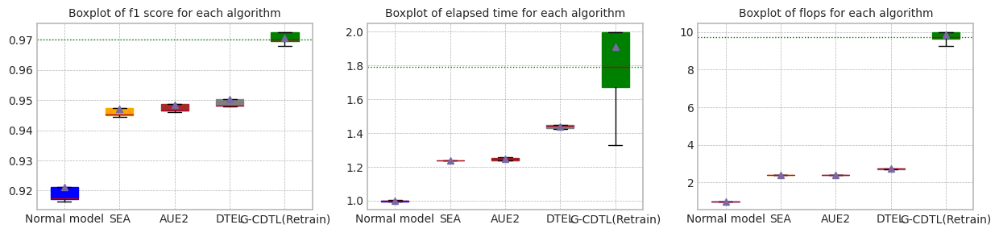

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.926462650299072


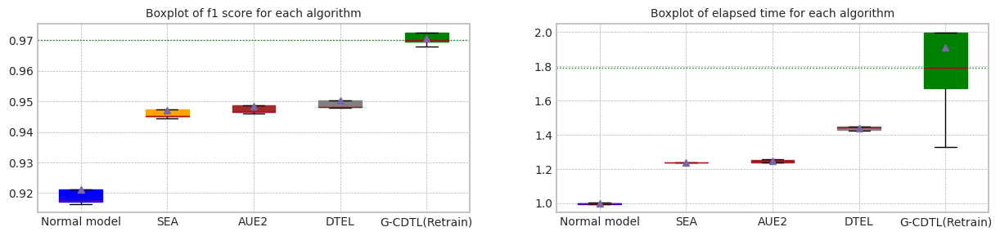

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.917332,0.905780,10.926463,1.740000e+10,226200000.0,1.762620e+10
1,1.0,0.937698,0.940101,0.921242,0.909930,10.782986,1.740000e+10,226200000.0,1.762620e+10
2,2.0,0.934735,0.936654,0.917241,0.905585,10.939417,1.740000e+10,226200000.0,1.762620e+10
3,3.0,0.945257,0.947906,0.933297,0.924414,10.882262,1.740000e+10,226200000.0,1.762620e+10
4,4.0,0.934395,0.936394,0.916477,0.904803,10.960814,1.740000e+10,226200000.0,1.762620e+10
5,median,0.934809,0.936785,0.917332,0.905780,10.926463,1.740000e+10,226200000.0,1.762620e+10
6,std,0.004601,0.004902,0.007058,0.008247,0.070616,0.000000e+00,0.0,0.000000e+00


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.957741,0.946251,10.734938,1.574000e+11,1.136200e+09,1.585362e+11
1,1.0,0.967497,0.968403,0.951043,0.927482,10.577574,1.574000e+11,1.136200e+09,1.585362e+11
2,2.0,0.970682,0.970795,0.952255,0.921099,10.572041,1.574000e+11,1.136200e+09,1.585362e+11
3,3.0,0.965645,0.967411,0.944169,0.914014,10.564503,1.574000e+11,1.136200e+09,1.585362e+11
4,4.0,0.969521,0.970020,0.954925,0.929771,10.690175,1.574000e+11,1.136200e+09,1.585362e+11
5,median,0.969521,0.970020,0.952255,0.927482,10.577574,1.574000e+11,1.136200e+09,1.585362e+11
6,std,0.002060,0.001409,0.005094,0.012035,0.079069,0.000000e+00,0.000000e+00,0.000000e+00


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.945115,0.969129,13.625497,2.088000e+10,2.144550e+10,4.232550e+10
1,1.0,0.937698,0.940101,0.947387,0.969562,13.367696,2.078082e+10,2.134632e+10,4.212714e+10
2,2.0,0.934735,0.936654,0.944882,0.969133,13.502623,2.088000e+10,2.144550e+10,4.232550e+10
3,3.0,0.945257,0.947906,0.953337,0.970685,13.518981,2.088000e+10,2.144550e+10,4.232550e+10
4,4.0,0.934395,0.936394,0.944546,0.968325,13.535015,2.088000e+10,2.144550e+10,4.232550e+10
5,median,0.934809,0.936785,0.945115,0.969133,13.518981,2.088000e+10,2.144550e+10,4.232550e+10
6,std,0.004601,0.004902,0.003686,0.000862,0.092670,4.435464e+07,4.435464e+07,8.870929e+07


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.946487,0.973613,13.522781,2.088000e+10,2.167170e+10,4.255170e+10
1,1.0,0.937698,0.940101,0.948619,0.972721,13.524339,2.088000e+10,2.167170e+10,4.255170e+10
2,2.0,0.934735,0.936654,0.946541,0.972659,13.605494,2.088000e+10,2.167170e+10,4.255170e+10
3,3.0,0.945257,0.947906,0.955057,0.974869,13.698020,2.088000e+10,2.167170e+10,4.255170e+10
4,4.0,0.934395,0.936394,0.946048,0.972049,13.713697,2.088000e+10,2.167170e+10,4.255170e+10
5,median,0.934809,0.936785,0.946541,0.972721,13.605494,2.088000e+10,2.167170e+10,4.255170e+10
6,std,0.004601,0.004902,0.003772,0.001095,0.091412,0.000000e+00,0.000000e+00,0.000000e+00


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.948137,0.978422,15.793222,2.388846e+10,2.480196e+10,4.869042e+10
1,1.0,0.937698,0.940101,0.950395,0.978751,15.801921,2.365182e+10,2.456532e+10,4.821714e+10
2,2.0,0.934735,0.936654,0.947992,0.977575,15.797750,2.372664e+10,2.464014e+10,4.836678e+10
3,3.0,0.945257,0.947906,0.956268,0.978655,15.536933,2.327772e+10,2.419122e+10,4.746894e+10
4,4.0,0.934395,0.936394,0.948092,0.979501,15.629559,2.320464e+10,2.411814e+10,4.732278e+10
5,median,0.934809,0.936785,0.948137,0.978655,15.793222,2.365182e+10,2.456532e+10,4.821714e+10
6,std,0.004601,0.004902,0.003551,0.000693,0.121944,2.956070e+08,2.956070e+08,5.912140e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.970024,0.982416,30.275686,1.888800e+11,238800000.0,1.891188e+11
1,1.0,0.967497,0.968403,0.969589,0.985182,14.504812,1.627966e+11,238800000.0,1.630354e+11
2,2.0,0.970682,0.970795,0.972343,0.986652,18.281135,1.696114e+11,238800000.0,1.698502e+11
3,3.0,0.965645,0.967411,0.967851,0.979245,21.837378,1.760737e+11,238800000.0,1.763125e+11
4,4.0,0.969521,0.970020,0.972570,0.987343,19.586962,1.713952e+11,238800000.0,1.716340e+11
5,median,0.969521,0.970020,0.970024,0.985182,19.586962,1.713952e+11,238800000.0,1.716340e+11
6,std,0.002060,0.001409,0.001984,0.003339,5.879266,9.707814e+09,0.0,9.707814e+09


trial_count: 5
Lambda :  0.8
######################### Retrain 2 Trial 0 for Normal model ###########################
cuda:0
[2023-12-03 10:38:59,498] [INFO] [profiler.py:80:start_profile] Flops profiler started


100%|██████████| 2000/2000 [00:04<00:00, 477.30it/s]

Early stop: 1999
[2023-12-03 10:39:03,694] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89943074, 0.88250818]), array([0.29867675, 0.99370023]), array([0.44843898, 0.93480935]), array([ 3174, 16826]))
Test f1 score: 0.934809348093481
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9173319390967674
inference_flops: 226200000
######################### Retrain 2 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:39:14,588] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:39:14,591] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:13<00:00, 147.61it/s]

[2023-12-03 10:39:37,130] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:39:37,131] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.99215505, 0.94257837]), array([0.6773787 , 0.99898966]), array([0.80509268, 0.96996451]), array([ 3174, 16826]))
Test f1 score: 0.9699645113823249
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

mean of drift:
recoveries              0.863871
last_fico_range_high    0.475187
last_pymnt_amnt         0.528398
total_rec_late_fee      0.965750
int_rate                0.130821
dtype: float64
Mean F1 for all data: 0.957741204656209
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.957741204656209
######################### Retrain 2 Trial 1 for Normal model ###########################
cuda:0
[2023-12-03 10:39:47,696] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 464.79it/s]

Early stop: 1999
[2023-12-03 10:39:52,005] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89495451, 0.88867011]), array([0.34089477, 0.99245216]), array([0.49372576, 0.93769829]), array([ 3174, 16826]))
Test f1 score: 0.9376982901423476
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9212417862658753
inference_flops: 226200000
######################### Retrain 2 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:40:02,883] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:40:02,885] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:13<00:00, 147.43it/s]

[2023-12-03 10:40:25,503] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:40:25,504] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98900048, 0.93824334]), array([0.65154379, 0.99863307]), array([0.78556505, 0.96749676]), array([ 3174, 16826]))
Test f1 score: 0.9674967611918814
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]

mean of drift:
recoveries              0.832729
last_fico_range_high    0.456425
last_pymnt_amnt         0.505794
total_rec_late_fee      0.965750
int_rate                0.109156
dtype: float64
Mean F1 for all data: 0.9510429341779746
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9543920694170918
######################### Retrain 2 Trial 2 for Normal model ###########################
cuda:0
[2023-12-03 10:40:36,197] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 469.58it/s]

Early stop: 1999
[2023-12-03 10:40:40,463] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89990467, 0.88232811]), array([0.29741651, 0.99375966]), array([0.44707554, 0.93473461]), array([ 3174, 16826]))
Test f1 score: 0.934734606031808
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9172405727818584
inference_flops: 226200000
######################### Retrain 2 Trial 2 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:40:51,268] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:40:51,271] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:13<00:00, 148.06it/s]

[2023-12-03 10:41:13,746] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:41:13,747] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98214286, 0.94515766]), array([0.6931317 , 0.99762273]), array([0.81270779, 0.97068178]), array([ 3174, 16826]))
Test f1 score: 0.9706817787544093
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

mean of drift:
recoveries              0.869952
last_fico_range_high    0.462038
last_pymnt_amnt         0.529694
total_rec_late_fee      0.965750
int_rate                0.133481
dtype: float64
Mean F1 for all data: 0.9522551587041203
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 2 Trial 3 for Normal model ###########################
cuda:0
[2023-12-03 10:41:24,334] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 473.43it/s]

Early stop: 1999
[2023-12-03 10:41:28,565] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90482399, 0.90328171]), array([0.43730309, 0.99132295]), array([0.58963466, 0.94525672]), array([ 3174, 16826]))
Test f1 score: 0.9452567154029242
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9332974273094798
inference_flops: 226200000
######################### Retrain 2 Trial 3 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:41:39,875] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:41:39,878] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:13<00:00, 143.75it/s]

[2023-12-03 10:42:02,850] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:42:02,853] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.92627518, 0.94266146]), array([0.68084436, 0.98977772]), array([0.78481932, 0.9656452 ]), array([ 3174, 16826]))
Test f1 score: 0.9656452033745977
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

mean of drift:
recoveries              0.839398
last_fico_range_high    0.407798
last_pymnt_amnt         0.517254
total_rec_late_fee      0.965750
int_rate                0.127600
dtype: float64
Mean F1 for all data: 0.9441692001956904
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9516490464410474
######################### Retrain 2 Trial 4 for Normal model ###########################
cuda:0
[2023-12-03 10:42:13,431] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 469.29it/s]

Early stop: 1999
[2023-12-03 10:42:17,700] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90401567, 0.88139523]), array([0.29080025, 0.99417568]), array([0.44004768, 0.93439464]), array([ 3174, 16826]))
Test f1 score: 0.934394637620444
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9164770475937788
inference_flops: 226200000
######################### Retrain 2 Trial 4 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:42:28,445] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:42:28,447] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:13<00:00, 147.92it/s]

[2023-12-03 10:42:51,134] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:42:51,135] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.95930736, 0.94584511]), array([0.69817265, 0.99441341]), array([0.80816922, 0.96952138]), array([ 3174, 16826]))
Test f1 score: 0.9695213813883415
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.871642
last_fico_range_high    0.360342
last_pymnt_amnt         0.510163
total_rec_late_fee      0.911712
int_rate                0.128648
dtype: float64
Mean F1 for all data: 0.9549246120285516
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 2 Trial 0 for Normal model ###########################
retrain_interval: 9
######################### Retrain 2 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.44it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:43:05,529] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:43:05,532] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:43:25,739] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:43:25,740] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 35%|███▍      | 9/26 [00:23<01:54,  6.73s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 65%|██████▌   | 17/26 [00:27<00:06,  1.32it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:43:29,437] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:43:29,439] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:43:49,589] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:43:49,590] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:47<00:53,  6.71s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


100%|██████████| 26/26 [00:51<00:00,  1.97s/it]


Early stop at  [1999, 1999]
Train flops  [31480000000, 31480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9723947021684675
G_CDTL+AUE median: 0.9723947021684675
######################### Retrain 2 Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:21,  1.26s/it]

Ensemble_SEA train flops: 3384300000


 69%|██████▉   | 18/26 [00:12<00:10,  1.26s/it]

Ensemble_SEA train flops: 3272940000


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  [1944, 1880]
Train flops  [3384300000, 3272940000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9565336337700762
SEA median: 0.9565336337700762
######################### Retrain 2 Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:19,  1.12s/it]

Ensemble_SEA train flops: 2787480000


 69%|██████▉   | 18/26 [00:11<00:08,  1.11s/it]

Ensemble_SEA train flops: 2606520000


100%|██████████| 26/26 [00:15<00:00,  1.68it/s]


Early stop at  [1601, 1497]
Train flops  [2787480000, 2606520000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9581794916165969
AUE median: 0.9581794916165969
######################### Retrain 2 Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.43it/s]

Ensemble_DTEL train flops: 3429540000


 35%|███▍      | 9/26 [00:08<00:34,  2.01s/it]

Ensemble_DTEL train flops: 2705700000


 69%|██████▉   | 18/26 [00:15<00:10,  1.33s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


100%|██████████| 26/26 [00:18<00:00,  1.38it/s]


Early stop at  [1970, 1554, 1999, 1]
Train flops  [3429540000, 2705700000, 3480000000, 3480000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9584339431380523
DTEL median: 0.9584339431380523
######################### Retrain 2 Trial 1 for Normal model ###########################
retrain_interval: 9
######################### Retrain 2 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.41it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:44:47,340] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:44:47,343] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:44:50,687] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:44:50,689] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 35%|███▍      | 9/26 [00:07<00:24,  1.46s/it]

G-CDTL train flops: 224000000 3437000000 854340000 4515340000


 65%|██████▌   | 17/26 [00:10<00:04,  2.09it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:44:54,520] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:44:54,523] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:45:03,370] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:45:03,371] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:19<00:24,  3.12s/it]

G-CDTL train flops: 5880000000 6244000000 1552080000 13676080000


100%|██████████| 26/26 [00:23<00:00,  1.12it/s]


Early stop at  [490, 891]
Train flops  [4515340000, 13676080000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9724655465346786
G_CDTL+AUE median: 0.972430124351573
######################### Retrain 2 Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:22,  1.33s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:13<00:10,  1.32s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:16<00:00,  1.56it/s]


Early stop at  [1999, 1999]
Train flops  [3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9574791524938744
SEA median: 0.9570063931319752
######################### Retrain 2 Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:22,  1.32s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:13<00:10,  1.33s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:16<00:00,  1.56it/s]


Early stop at  [1999, 1999]
Train flops  [3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9591021387117935
AUE median: 0.9586408151641952
######################### Retrain 2 Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.41it/s]

Ensemble_DTEL train flops: 3222480000


 35%|███▍      | 9/26 [00:08<00:30,  1.81s/it]

Ensemble_DTEL train flops: 2211540000


 69%|██████▉   | 18/26 [00:14<00:10,  1.33s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


100%|██████████| 26/26 [00:18<00:00,  1.43it/s]


Early stop at  [1851, 1270, 1999, 1]
Train flops  [3222480000, 2211540000, 3480000000, 3480000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9599239759414557
DTEL median: 0.959178959539754
######################### Retrain 2 Trial 2 for Normal model ###########################
retrain_interval: 9
######################### Retrain 2 Trial 2 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.41it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:46:02,311] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:46:02,313] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:46:07,145] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:46:07,147] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 35%|███▍      | 9/26 [00:08<00:32,  1.93s/it]

G-CDTL train flops: 2107000000 4046000000 1005720000 7158720000


 65%|██████▌   | 17/26 [00:11<00:04,  2.01it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:46:10,882] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:46:10,884] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:46:16,235] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:46:16,236] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:17<00:16,  2.08s/it]

G-CDTL train flops: 4053000000 3290000000 817800000 8160800000


100%|██████████| 26/26 [00:21<00:00,  1.23it/s]


Early stop at  [577, 469]
Train flops  [7158720000, 8160800000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.974821633213799
G_CDTL+AUE median: 0.9724655465346786
######################### Retrain 2 Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:22,  1.31s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:12<00:09,  1.19s/it]

Ensemble_SEA train flops: 2947560000


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  [1999, 1693]
Train flops  [3480000000, 2947560000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9555097083450483
SEA median: 0.9565336337700762
######################### Retrain 2 Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:19,  1.16s/it]

Ensemble_SEA train flops: 2881440000


 69%|██████▉   | 18/26 [00:12<00:10,  1.30s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  [1655, 1999]
Train flops  [2881440000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9582861872663979
AUE median: 0.9582861872663979
######################### Retrain 2 Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.43it/s]

Ensemble_DTEL train flops: 2326380000


 35%|███▍      | 9/26 [00:07<00:26,  1.54s/it]

Ensemble_DTEL train flops: 1966200000


 69%|██████▉   | 18/26 [00:13<00:10,  1.30s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


100%|██████████| 26/26 [00:17<00:00,  1.50it/s]


Early stop at  [1336, 1129, 1999, 1]
Train flops  [2326380000, 1966200000, 3480000000, 3480000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9584248243133258
DTEL median: 0.9584339431380523
######################### Retrain 2 Trial 3 for Normal model ###########################
retrain_interval: 9
######################### Retrain 2 Trial 3 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.39it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:47:12,950] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:47:12,953] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:47:18,353] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:47:18,355] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 35%|███▍      | 9/26 [00:09<00:35,  2.11s/it]

G-CDTL train flops: 2849000000 4116000000 1023120000 7988120000


 65%|██████▌   | 17/26 [00:12<00:04,  1.96it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:47:22,094] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:47:22,097] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:47:24,968] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:47:24,969] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:15<00:10,  1.35s/it]

G-CDTL train flops: 455000000 2870000000 713400000 4038400000


100%|██████████| 26/26 [00:19<00:00,  1.36it/s]


Early stop at  [587, 409]
Train flops  [7988120000, 4038400000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.973083543529498
G_CDTL+AUE median: 0.9727745450320884
######################### Retrain 2 Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:22,  1.30s/it]

Ensemble_SEA train flops: 3399960000


 69%|██████▉   | 18/26 [00:13<00:10,  1.34s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:16<00:00,  1.57it/s]


Early stop at  [1953, 1999]
Train flops  [3399960000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9616396055537154
SEA median: 0.9570063931319752
######################### Retrain 2 Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:22,  1.34s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:13<00:10,  1.31s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:16<00:00,  1.57it/s]


Early stop at  [1999, 1999]
Train flops  [3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9633950661828045
AUE median: 0.9586941629890957
######################### Retrain 2 Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.41it/s]

Ensemble_DTEL train flops: 3480000000


 35%|███▍      | 9/26 [00:08<00:31,  1.84s/it]

Ensemble_DTEL train flops: 1980120000


 69%|██████▉   | 18/26 [00:13<00:08,  1.04s/it]

Ensemble_DTEL train flops: 2239380000
Ensemble_DTEL train flops: 3480000


100%|██████████| 26/26 [00:17<00:00,  1.50it/s]


Early stop at  [1999, 1137, 1286, 1]
Train flops  [3480000000, 1980120000, 2239380000, 3480000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9634689576801609
DTEL median: 0.959178959539754
######################### Retrain 2 Trial 4 for Normal model ###########################
retrain_interval: 9
######################### Retrain 2 Trial 4 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.31it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:48:22,732] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:48:22,734] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:48:27,419] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:48:27,420] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 35%|███▍      | 9/26 [00:08<00:32,  1.90s/it]

G-CDTL train flops: 2205000000 3682000000 915240000 6802240000


 65%|██████▌   | 17/26 [00:11<00:04,  1.95it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:48:31,301] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:48:31,304] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:48:34,769] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:48:34,771] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:15<00:12,  1.54s/it]

G-CDTL train flops: 448000000 3486000000 866520000 4800520000


100%|██████████| 26/26 [00:19<00:00,  1.35it/s]


Early stop at  [525, 497]
Train flops  [6802240000, 4800520000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.973065591963568
G_CDTL+AUE median: 0.973065591963568
######################### Retrain 2 Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:06<00:22,  1.34s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:13<00:10,  1.34s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:16<00:00,  1.56it/s]


Early stop at  [1999, 1999]
Train flops  [3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9558230612232835
SEA median: 0.9565336337700762
######################### Retrain 2 Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 35%|███▍      | 9/26 [00:05<00:14,  1.19it/s]

Ensemble_SEA train flops: 1534680000


 69%|██████▉   | 18/26 [00:11<00:10,  1.30s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:15<00:00,  1.73it/s]


Early stop at  [881, 1999]
Train flops  [1534680000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9577826759543979
AUE median: 0.9582861872663979
######################### Retrain 2 Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 31%|███       | 8/26 [00:03<00:07,  2.40it/s]

Ensemble_DTEL train flops: 3476520000


 35%|███▍      | 9/26 [00:08<00:32,  1.93s/it]

Ensemble_DTEL train flops: 2469060000


 69%|██████▉   | 18/26 [00:15<00:10,  1.37s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


100%|██████████| 26/26 [00:18<00:00,  1.39it/s]


Early stop at  [1997, 1418, 1999, 1]
Train flops  [3476520000, 2469060000, 3480000000, 3480000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9582001710374028
DTEL median: 0.9584339431380523


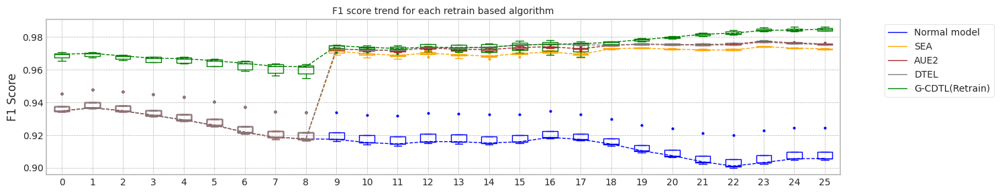

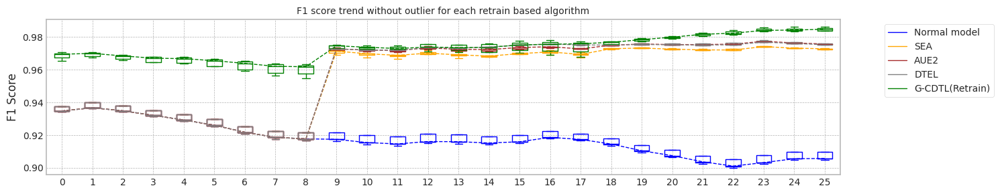

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.855308532714844
Base flops (train + inference flops of normal model, median): 17626200000.0


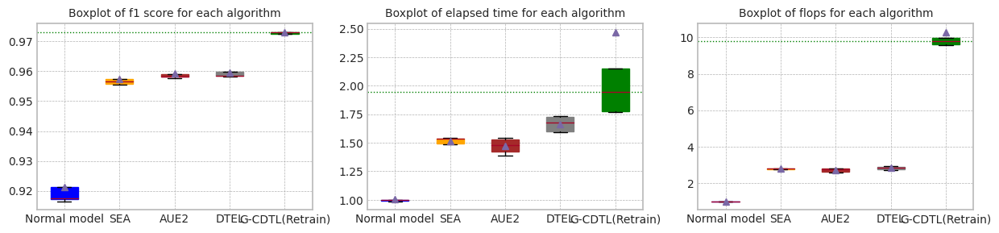

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.855308532714844


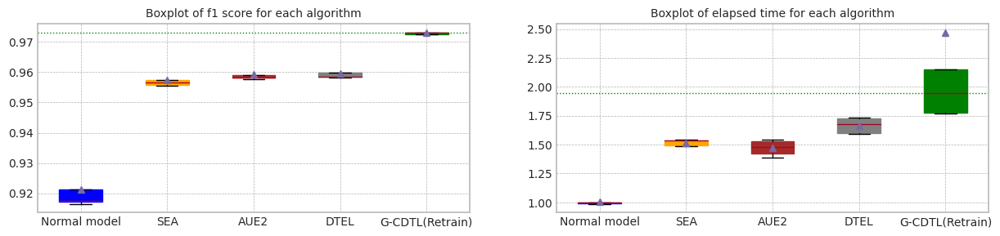

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.917332,0.905780,10.872394,1.740000e+10,226200000.0,1.762620e+10
1,1.0,0.937698,0.940101,0.921242,0.909930,10.855309,1.740000e+10,226200000.0,1.762620e+10
2,2.0,0.934735,0.936654,0.917241,0.905585,10.782744,1.740000e+10,226200000.0,1.762620e+10
3,3.0,0.945257,0.947906,0.933297,0.924414,11.285127,1.740000e+10,226200000.0,1.762620e+10
4,4.0,0.934395,0.936394,0.916477,0.904803,10.718694,1.740000e+10,226200000.0,1.762620e+10
5,median,0.934809,0.936785,0.917332,0.905780,10.855309,1.740000e+10,226200000.0,1.762620e+10
6,std,0.004601,0.004902,0.007058,0.008247,0.222296,0.000000e+00,0.0,0.000000e+00


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.957741,0.946251,10.541853,1.574000e+11,1.136200e+09,1.585362e+11
1,1.0,0.967497,0.968403,0.951043,0.927482,10.671900,1.574000e+11,1.136200e+09,1.585362e+11
2,2.0,0.970682,0.970795,0.952255,0.921099,10.564455,1.574000e+11,1.136200e+09,1.585362e+11
3,3.0,0.965645,0.967411,0.944169,0.914014,10.553508,1.574000e+11,1.136200e+09,1.585362e+11
4,4.0,0.969521,0.970020,0.954925,0.929771,10.583119,1.574000e+11,1.136200e+09,1.585362e+11
5,median,0.969521,0.970020,0.952255,0.927482,10.564455,1.574000e+11,1.136200e+09,1.585362e+11
6,std,0.002060,0.001409,0.005094,0.012035,0.051985,0.000000e+00,0.000000e+00,0.000000e+00


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.956534,0.973080,16.236217,2.405724e+10,2.473584e+10,4.879308e+10
1,1.0,0.937698,0.940101,0.957479,0.972893,16.675925,2.436000e+10,2.503860e+10,4.939860e+10
2,2.0,0.934735,0.936654,0.955510,0.972831,16.107078,2.382756e+10,2.450616e+10,4.833372e+10
3,3.0,0.945257,0.947906,0.961640,0.972484,16.638491,2.427996e+10,2.495856e+10,4.923852e+10
4,4.0,0.934395,0.936394,0.955823,0.972553,16.734343,2.436000e+10,2.503860e+10,4.939860e+10
5,median,0.934809,0.936785,0.956534,0.972831,16.638491,2.427996e+10,2.495856e+10,4.923852e+10
6,std,0.004601,0.004902,0.002490,0.000247,0.285782,2.313166e+08,2.313166e+08,4.626332e+08


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.958179,0.975574,15.477737,2.279400e+10,2.369880e+10,4.649280e+10
1,1.0,0.937698,0.940101,0.959102,0.975787,16.742802,2.436000e+10,2.526480e+10,4.962480e+10
2,2.0,0.934735,0.936654,0.958286,0.975794,16.076409,2.376144e+10,2.466624e+10,4.842768e+10
3,3.0,0.945257,0.947906,0.963395,0.976322,16.591983,2.436000e+10,2.526480e+10,4.962480e+10
4,4.0,0.934395,0.936394,0.957783,0.975588,15.064683,2.241468e+10,2.331948e+10,4.573416e+10
5,median,0.934809,0.936785,0.958286,0.975787,16.076409,2.376144e+10,2.466624e+10,4.842768e+10
6,std,0.004601,0.004902,0.002312,0.000303,0.716795,8.967549e+08,8.967549e+08,1.793510e+09


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.958434,0.975166,18.841833,2.701872e+10,2.450268e+10,5.152140e+10
1,1.0,0.937698,0.940101,0.959924,0.975916,18.197417,2.631750e+10,2.400852e+10,5.032602e+10
2,2.0,0.934735,0.936654,0.958425,0.975108,17.326266,2.517606e+10,2.376318e+10,4.893924e+10
3,3.0,0.945257,0.947906,0.963469,0.976104,17.333538,2.510298e+10,2.253648e+10,4.763946e+10
4,4.0,0.934395,0.936394,0.958200,0.975291,18.772685,2.682906e+10,2.426604e+10,5.109510e+10
5,median,0.934809,0.936785,0.958434,0.975291,18.197417,2.631750e+10,2.400852e+10,5.032602e+10
6,std,0.004601,0.004902,0.002221,0.000460,0.741330,9.041536e+08,7.666630e+08,1.602475e+09


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.972395,0.984796,51.254453,2.203600e+11,159200000.0,2.205192e+11
1,1.0,0.967497,0.968403,0.972466,0.983941,23.350613,1.755914e+11,159200000.0,1.757506e+11
2,2.0,0.970682,0.970795,0.974822,0.985395,21.100466,1.727195e+11,159200000.0,1.728787e+11
3,3.0,0.965645,0.967411,0.973084,0.986362,19.196352,1.694265e+11,159200000.0,1.695857e+11
4,4.0,0.969521,0.970020,0.973066,0.984032,19.266166,1.690028e+11,159200000.0,1.691620e+11
5,median,0.969521,0.970020,0.973066,0.984796,21.100466,1.727195e+11,159200000.0,1.728787e+11
6,std,0.002060,0.001409,0.000980,0.001008,13.756560,2.193186e+10,0.0,2.193186e+10


trial_count: 5
Lambda :  0.8
######################### Retrain 3 Trial 0 for Normal model ###########################
cuda:0
[2023-12-03 10:49:32,356] [INFO] [profiler.py:80:start_profile] Flops profiler started


100%|██████████| 2000/2000 [00:04<00:00, 443.00it/s]

Early stop: 1999
[2023-12-03 10:49:36,878] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89943074, 0.88250818]), array([0.29867675, 0.99370023]), array([0.44843898, 0.93480935]), array([ 3174, 16826]))
Test f1 score: 0.934809348093481
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9173319390967674
inference_flops: 226200000
######################### Retrain 3 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:49:47,864] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:49:47,866] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:14<00:00, 135.65it/s]

[2023-12-03 10:50:12,565] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:50:12,566] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.99215505, 0.94257837]), array([0.6773787 , 0.99898966]), array([0.80509268, 0.96996451]), array([ 3174, 16826]))
Test f1 score: 0.9699645113823249
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

mean of drift:
recoveries              0.863871
last_fico_range_high    0.475187
last_pymnt_amnt         0.528398
total_rec_late_fee      0.965750
int_rate                0.130821
dtype: float64
Mean F1 for all data: 0.957741204656209
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.957741204656209
######################### Retrain 3 Trial 1 for Normal model ###########################
cuda:0
[2023-12-03 10:50:23,115] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 448.30it/s]

Early stop: 1999
[2023-12-03 10:50:27,582] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89495451, 0.88867011]), array([0.34089477, 0.99245216]), array([0.49372576, 0.93769829]), array([ 3174, 16826]))
Test f1 score: 0.9376982901423476
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9212417862658753
inference_flops: 226200000
######################### Retrain 3 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:50:38,459] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:50:38,461] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:14<00:00, 136.13it/s]

[2023-12-03 10:51:03,148] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:51:03,149] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98900048, 0.93824334]), array([0.65154379, 0.99863307]), array([0.78556505, 0.96749676]), array([ 3174, 16826]))
Test f1 score: 0.9674967611918814
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]

mean of drift:
recoveries              0.832729
last_fico_range_high    0.456425
last_pymnt_amnt         0.505794
total_rec_late_fee      0.965750
int_rate                0.109156
dtype: float64
Mean F1 for all data: 0.9510429341779746
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9543920694170918
######################### Retrain 3 Trial 2 for Normal model ###########################
cuda:0
[2023-12-03 10:51:13,853] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 442.24it/s]

Early stop: 1999
[2023-12-03 10:51:18,381] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89990467, 0.88232811]), array([0.29741651, 0.99375966]), array([0.44707554, 0.93473461]), array([ 3174, 16826]))
Test f1 score: 0.934734606031808
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9172405727818584
inference_flops: 226200000
######################### Retrain 3 Trial 2 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:51:29,280] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:51:29,282] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:14<00:00, 135.80it/s]

[2023-12-03 10:51:53,941] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:51:53,942] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98214286, 0.94515766]), array([0.6931317 , 0.99762273]), array([0.81270779, 0.97068178]), array([ 3174, 16826]))
Test f1 score: 0.9706817787544093
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

mean of drift:
recoveries              0.869952
last_fico_range_high    0.462038
last_pymnt_amnt         0.529694
total_rec_late_fee      0.965750
int_rate                0.133481
dtype: float64
Mean F1 for all data: 0.9522551587041203
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 3 Trial 3 for Normal model ###########################
cuda:0
[2023-12-03 10:52:04,528] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 440.43it/s]

Early stop: 1999
[2023-12-03 10:52:09,076] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90482399, 0.90328171]), array([0.43730309, 0.99132295]), array([0.58963466, 0.94525672]), array([ 3174, 16826]))
Test f1 score: 0.9452567154029242
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9332974273094798
inference_flops: 226200000
######################### Retrain 3 Trial 3 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:52:20,009] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:52:20,012] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:14<00:00, 133.46it/s]

[2023-12-03 10:52:45,098] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:52:45,101] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.92627518, 0.94266146]), array([0.68084436, 0.98977772]), array([0.78481932, 0.9656452 ]), array([ 3174, 16826]))
Test f1 score: 0.9656452033745977
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]

mean of drift:
recoveries              0.839398
last_fico_range_high    0.407798
last_pymnt_amnt         0.517254
total_rec_late_fee      0.965750
int_rate                0.127600
dtype: float64
Mean F1 for all data: 0.9441692001956904
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9516490464410474
######################### Retrain 3 Trial 4 for Normal model ###########################
cuda:0
[2023-12-03 10:52:55,916] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 438.68it/s]

Early stop: 1999
[2023-12-03 10:53:00,481] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90401567, 0.88139523]), array([0.29080025, 0.99417568]), array([0.44004768, 0.93439464]), array([ 3174, 16826]))
Test f1 score: 0.934394637620444
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9164770475937788
inference_flops: 226200000
######################### Retrain 3 Trial 4 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 10:53:11,292] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:53:11,295] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:14<00:00, 135.05it/s]

[2023-12-03 10:53:35,952] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:53:35,953] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.95930736, 0.94584511]), array([0.69817265, 0.99441341]), array([0.80816922, 0.96952138]), array([ 3174, 16826]))
Test f1 score: 0.9695213813883415
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.871642
last_fico_range_high    0.360342
last_pymnt_amnt         0.510163
total_rec_late_fee      0.911712
int_rate                0.128648
dtype: float64
Mean F1 for all data: 0.9549246120285516
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 3 Trial 0 for Normal model ###########################
retrain_interval: 7
######################### Retrain 3 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.41it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:53:49,793] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:53:49,796] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:54:11,599] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:54:11,600] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 27%|██▋       | 7/26 [00:24<02:23,  7.56s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 50%|█████     | 13/26 [00:27<00:15,  1.19s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:54:14,517] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:54:14,519] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:54:36,462] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:54:36,464] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:49<01:31,  7.59s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 77%|███████▋  | 20/26 [00:52<00:07,  1.25s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:54:39,344] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:54:39,346] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:55:01,401] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:55:01,402] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 81%|████████  | 21/26 [01:14<00:38,  7.62s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


100%|██████████| 26/26 [01:16<00:00,  2.95s/it]


Early stop at  [1999, 1999, 1999]
Train flops  [31480000000, 31480000000, 31480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9738645233014765
G_CDTL+AUE median: 0.9738645233014765
######################### Retrain 3 Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:05<00:26,  1.41s/it]

Ensemble_SEA train flops: 3480000000


 54%|█████▍    | 14/26 [00:11<00:15,  1.32s/it]

Ensemble_SEA train flops: 3159840000


 81%|████████  | 21/26 [00:15<00:03,  1.47it/s]

Ensemble_SEA train flops: 720360000


100%|██████████| 26/26 [00:17<00:00,  1.50it/s]


Early stop at  [1999, 1815, 413]
Train flops  [3480000000, 3159840000, 720360000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9615739527856939
SEA median: 0.9615739527856939
######################### Retrain 3 Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:05<00:23,  1.24s/it]

Ensemble_SEA train flops: 2860560000


 54%|█████▍    | 14/26 [00:11<00:17,  1.44s/it]

Ensemble_SEA train flops: 3480000000


 81%|████████  | 21/26 [00:17<00:07,  1.41s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:19<00:00,  1.32it/s]


Early stop at  [1643, 1999, 1999]
Train flops  [2860560000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9635265525240609
AUE median: 0.9635265525240609
######################### Retrain 3 Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.43it/s]

Ensemble_DTEL train flops: 3480000000


 27%|██▋       | 7/26 [00:08<00:43,  2.28s/it]

Ensemble_DTEL train flops: 3003240000


 54%|█████▍    | 14/26 [00:14<00:17,  1.47s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 81%|████████  | 21/26 [00:18<00:03,  1.32it/s]

Ensemble_DTEL train flops: 1026600000
Ensemble_DTEL train flops: 6960000


100%|██████████| 26/26 [00:20<00:00,  1.28it/s]


Early stop at  [1999, 1725, 1999, 1, 589, 3]
Train flops  [3480000000, 3003240000, 3480000000, 3480000, 1026600000, 6960000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9641703056432706
DTEL median: 0.9641703056432706
######################### Retrain 3 Trial 1 for Normal model ###########################
retrain_interval: 7
######################### Retrain 3 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.41it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:56:03,908] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:56:03,911] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:56:13,343] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:56:13,344] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 27%|██▋       | 7/26 [00:12<01:06,  3.50s/it]

G-CDTL train flops: 9926000000 3276000000 814320000 14016320000


 50%|█████     | 13/26 [00:14<00:09,  1.34it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:56:16,229] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:56:16,231] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:56:25,844] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:56:25,845] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:24<00:42,  3.55s/it]

G-CDTL train flops: 9086000000 3934000000 977880000 13997880000


 77%|███████▋  | 20/26 [00:27<00:04,  1.27it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:56:28,800] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:56:28,803] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:56:39,135] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:56:39,136] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 81%|████████  | 21/26 [00:38<00:18,  3.78s/it]

G-CDTL train flops: 8197000000 5376000000 1336320000 14909320000


100%|██████████| 26/26 [00:40<00:00,  1.55s/it]


Early stop at  [467, 561, 767]
Train flops  [14016320000, 13997880000, 14909320000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9752180292511691
G_CDTL+AUE median: 0.9745412762763228
######################### Retrain 3 Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:05<00:24,  1.31s/it]

Ensemble_SEA train flops: 3046740000


 54%|█████▍    | 14/26 [00:11<00:16,  1.39s/it]

Ensemble_SEA train flops: 3480000000


 81%|████████  | 21/26 [00:17<00:07,  1.41s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:19<00:00,  1.32it/s]


Early stop at  [1750, 1999, 1999]
Train flops  [3046740000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9628299139449212
SEA median: 0.9622019333653076
######################### Retrain 3 Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:05<00:26,  1.38s/it]

Ensemble_SEA train flops: 3480000000


 54%|█████▍    | 14/26 [00:11<00:15,  1.29s/it]

Ensemble_SEA train flops: 3015420000


 81%|████████  | 21/26 [00:15<00:04,  1.23it/s]

Ensemble_SEA train flops: 1197120000


100%|██████████| 26/26 [00:17<00:00,  1.48it/s]


Early stop at  [1999, 1732, 687]
Train flops  [3480000000, 3015420000, 1197120000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9639951607249455
AUE median: 0.9637608566245033
######################### Retrain 3 Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.33it/s]

Ensemble_DTEL train flops: 3480000000


 27%|██▋       | 7/26 [00:06<00:29,  1.55s/it]

Ensemble_DTEL train flops: 408900000


 50%|█████     | 13/26 [00:08<00:07,  1.84it/s]

Ensemble_DTEL train flops: 3015420000


 54%|█████▍    | 14/26 [00:12<00:17,  1.49s/it]

Ensemble_DTEL train flops: 755160000


 81%|████████  | 21/26 [00:16<00:04,  1.20it/s]

Ensemble_DTEL train flops: 1280640000
Ensemble_DTEL train flops: 8700000


100%|██████████| 26/26 [00:18<00:00,  1.38it/s]


Early stop at  [1999, 234, 1732, 433, 735, 4]
Train flops  [3480000000, 408900000, 3015420000, 755160000, 1280640000, 8700000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9639219286829339
DTEL median: 0.9640461171631023
######################### Retrain 3 Trial 2 for Normal model ###########################
retrain_interval: 7
######################### Retrain 3 Trial 2 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.39it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:57:40,337] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:57:40,341] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:57:46,488] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:57:46,489] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 27%|██▋       | 7/26 [00:09<00:46,  2.43s/it]

G-CDTL train flops: 2996000000 4536000000 1127520000 8659520000


 50%|█████     | 13/26 [00:11<00:08,  1.56it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:57:49,446] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:57:49,448] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:57:53,140] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:57:53,141] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:15<00:20,  1.69s/it]

G-CDTL train flops: 434000000 3549000000 882180000 4865180000


 77%|███████▋  | 20/26 [00:18<00:03,  1.77it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:57:56,065] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:57:56,068] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:58:09,890] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:58:09,892] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 81%|████████  | 21/26 [00:32<00:23,  4.67s/it]

G-CDTL train flops: 10220000000 7532000000 1872240000 19624240000


100%|██████████| 26/26 [00:34<00:00,  1.33s/it]


Early stop at  [647, 506, 1075]
Train flops  [8659520000, 4865180000, 19624240000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9760517419622551
G_CDTL+AUE median: 0.9752180292511691
######################### Retrain 3 Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:05<00:26,  1.41s/it]

Ensemble_SEA train flops: 3426060000


 54%|█████▍    | 14/26 [00:12<00:17,  1.45s/it]

Ensemble_SEA train flops: 3480000000


 81%|████████  | 21/26 [00:15<00:03,  1.32it/s]

Ensemble_SEA train flops: 936120000


100%|██████████| 26/26 [00:17<00:00,  1.45it/s]


Early stop at  [1968, 1999, 537]
Train flops  [3426060000, 3480000000, 936120000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9619814651804235
SEA median: 0.9619814651804235
######################### Retrain 3 Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:04<00:20,  1.06s/it]

Ensemble_SEA train flops: 2047980000


 54%|█████▍    | 14/26 [00:11<00:17,  1.43s/it]

Ensemble_SEA train flops: 3480000000


 81%|████████  | 21/26 [00:17<00:07,  1.48s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:19<00:00,  1.34it/s]


Early stop at  [1176, 1999, 1999]
Train flops  [2047980000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9618473510874549
AUE median: 0.9635265525240609
######################### Retrain 3 Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.32it/s]

Ensemble_DTEL train flops: 3480000000


 27%|██▋       | 7/26 [00:06<00:30,  1.58s/it]

Ensemble_DTEL train flops: 607260000


 54%|█████▍    | 14/26 [00:12<00:17,  1.46s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 81%|████████  | 21/26 [00:18<00:06,  1.31s/it]

Ensemble_DTEL train flops: 3102420000
Ensemble_DTEL train flops: 10440000


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  [1999, 348, 1999, 1, 1782, 5]
Train flops  [3480000000, 607260000, 3480000000, 3480000, 3102420000, 10440000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9626838874770862
DTEL median: 0.9639219286829339
######################### Retrain 3 Trial 3 for Normal model ###########################
retrain_interval: 7
######################### Retrain 3 Trial 3 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.37it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:59:12,886] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:59:12,888] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:59:19,715] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:59:19,717] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 27%|██▋       | 7/26 [00:09<00:50,  2.65s/it]

G-CDTL train flops: 4620000000 3927000000 976140000 9523140000


 50%|█████     | 13/26 [00:12<00:08,  1.52it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:59:22,619] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:59:22,622] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:59:32,345] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:59:32,346] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:22<00:42,  3.52s/it]

G-CDTL train flops: 9940000000 3185000000 791700000 13916700000


 77%|███████▋  | 20/26 [00:24<00:04,  1.29it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 10:59:35,231] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 10:59:35,233] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 10:59:43,171] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 10:59:43,173] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 81%|████████  | 21/26 [00:33<00:15,  3.05s/it]

G-CDTL train flops: 5600000000 4431000000 1101420000 11132420000


100%|██████████| 26/26 [00:35<00:00,  1.36s/it]


Early stop at  [560, 454, 632]
Train flops  [9523140000, 13916700000, 11132420000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9746420988397809
G_CDTL+AUE median: 0.974930064045475
######################### Retrain 3 Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:06<00:27,  1.45s/it]

Ensemble_SEA train flops: 3480000000


 54%|█████▍    | 14/26 [00:11<00:15,  1.31s/it]

Ensemble_SEA train flops: 2970180000


 81%|████████  | 21/26 [00:16<00:04,  1.08it/s]

Ensemble_SEA train flops: 1595580000


100%|██████████| 26/26 [00:18<00:00,  1.43it/s]


Early stop at  [1999, 1706, 916]
Train flops  [3480000000, 2970180000, 1595580000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9649799512603822
SEA median: 0.9624056895626724
######################### Retrain 3 Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:06<00:27,  1.43s/it]

Ensemble_SEA train flops: 3417360000


 54%|█████▍    | 14/26 [00:12<00:17,  1.44s/it]

Ensemble_SEA train flops: 3480000000


 81%|████████  | 21/26 [00:15<00:04,  1.25it/s]

Ensemble_SEA train flops: 1071840000


100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


Early stop at  [1963, 1999, 615]
Train flops  [3417360000, 3480000000, 1071840000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9662417564298129
AUE median: 0.9637608566245033
######################### Retrain 3 Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.38it/s]

Ensemble_DTEL train flops: 3356460000


 27%|██▋       | 7/26 [00:07<00:36,  1.94s/it]

Ensemble_DTEL train flops: 1872240000


 54%|█████▍    | 14/26 [00:13<00:17,  1.50s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 81%|████████  | 21/26 [00:17<00:03,  1.42it/s]

Ensemble_DTEL train flops: 756900000
Ensemble_DTEL train flops: 6960000


100%|██████████| 26/26 [00:19<00:00,  1.33it/s]


Early stop at  [1928, 1075, 1999, 1, 434, 3]
Train flops  [3356460000, 1872240000, 3480000000, 3480000, 756900000, 6960000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9676914484854771
DTEL median: 0.9640461171631023
######################### Retrain 3 Trial 4 for Normal model ###########################
retrain_interval: 7
######################### Retrain 3 Trial 4 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.37it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:00:44,264] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:00:44,267] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:00:52,696] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:00:52,697] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 27%|██▋       | 7/26 [00:11<01:00,  3.18s/it]

G-CDTL train flops: 6993000000 3745000000 930900000 11668900000


 50%|█████     | 13/26 [00:13<00:09,  1.40it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:00:55,600] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:00:55,603] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:01:03,828] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:01:03,829] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 54%|█████▍    | 14/26 [00:22<00:37,  3.11s/it]

G-CDTL train flops: 7084000000 3521000000 875220000 11480220000


 77%|███████▋  | 20/26 [00:24<00:04,  1.38it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:01:06,700] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:01:06,703] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:01:17,306] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:01:17,308] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 81%|████████  | 21/26 [00:36<00:19,  3.82s/it]

G-CDTL train flops: 9653000000 4165000000 1035300000 14853300000


100%|██████████| 26/26 [00:38<00:00,  1.47s/it]


Early stop at  [534, 502, 594]
Train flops  [11668900000, 11480220000, 14853300000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9758103759817567
G_CDTL+AUE median: 0.9752180292511691
######################### Retrain 3 Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:06<00:28,  1.52s/it]

Ensemble_SEA train flops: 3480000000


 54%|█████▍    | 14/26 [00:12<00:17,  1.45s/it]

Ensemble_SEA train flops: 3480000000


 81%|████████  | 21/26 [00:18<00:07,  1.46s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  [1999, 1999, 1999]
Train flops  [3480000000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9619298489906115
SEA median: 0.9619814651804235
######################### Retrain 3 Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 27%|██▋       | 7/26 [00:06<00:27,  1.46s/it]

Ensemble_SEA train flops: 3480000000


 54%|█████▍    | 14/26 [00:12<00:17,  1.45s/it]

Ensemble_SEA train flops: 3415620000


 81%|████████  | 21/26 [00:15<00:03,  1.39it/s]

Ensemble_SEA train flops: 760380000


100%|██████████| 26/26 [00:17<00:00,  1.45it/s]


Early stop at  [1999, 1962, 436]
Train flops  [3480000000, 3415620000, 760380000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9475224596963302
AUE median: 0.9635265525240609
######################### Retrain 3 Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:02<00:08,  2.43it/s]

Ensemble_DTEL train flops: 3480000000


 27%|██▋       | 7/26 [00:08<00:42,  2.25s/it]

Ensemble_DTEL train flops: 2571720000


 54%|█████▍    | 14/26 [00:14<00:18,  1.50s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 81%|████████  | 21/26 [00:18<00:04,  1.22it/s]

Ensemble_DTEL train flops: 1169280000
Ensemble_DTEL train flops: 6960000


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  [1999, 1477, 1999, 1, 671, 3]
Train flops  [3480000000, 2571720000, 3480000000, 3480000, 1169280000, 6960000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9642959868925848
DTEL median: 0.9641703056432706


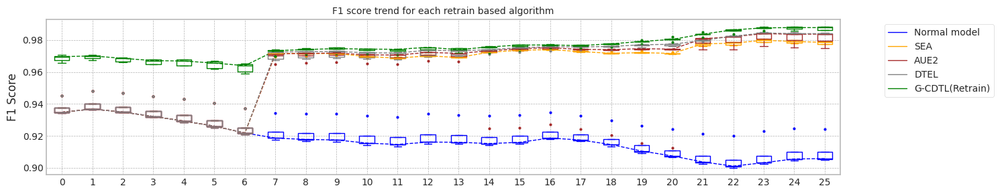

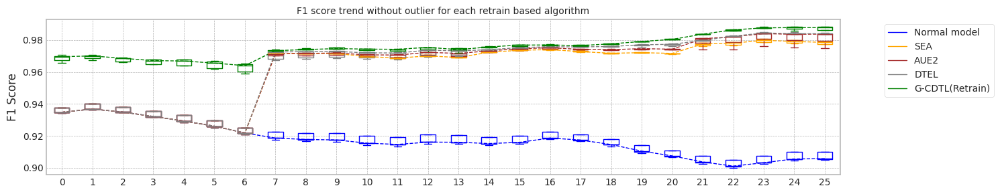

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.877040386199951
Base flops (train + inference flops of normal model, median): 17626200000.0


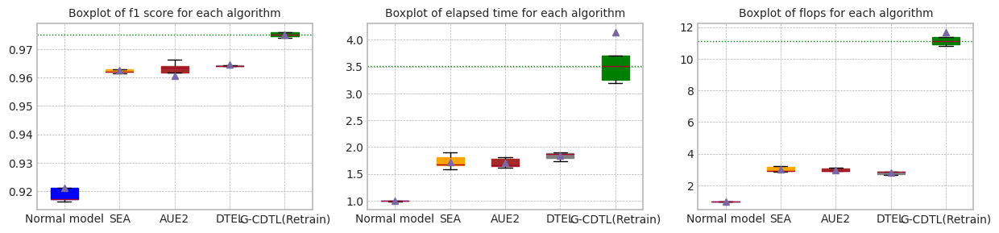

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.877040386199951


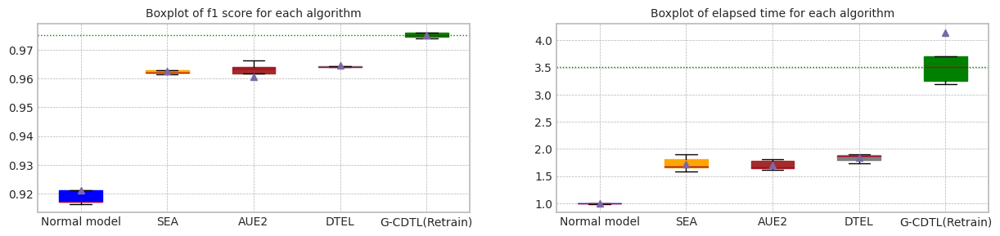

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.917332,0.905780,10.964917,1.740000e+10,226200000.0,1.762620e+10
1,1.0,0.937698,0.940101,0.921242,0.909930,10.853433,1.740000e+10,226200000.0,1.762620e+10
2,2.0,0.934735,0.936654,0.917241,0.905585,10.877040,1.740000e+10,226200000.0,1.762620e+10
3,3.0,0.945257,0.947906,0.933297,0.924414,10.912465,1.740000e+10,226200000.0,1.762620e+10
4,4.0,0.934395,0.936394,0.916477,0.904803,10.787091,1.740000e+10,226200000.0,1.762620e+10
5,median,0.934809,0.936785,0.917332,0.905780,10.877040,1.740000e+10,226200000.0,1.762620e+10
6,std,0.004601,0.004902,0.007058,0.008247,0.066345,0.000000e+00,0.0,0.000000e+00


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.957741,0.946251,10.527087,1.574000e+11,1.136200e+09,1.585362e+11
1,1.0,0.967497,0.968403,0.951043,0.927482,10.679448,1.574000e+11,1.136200e+09,1.585362e+11
2,2.0,0.970682,0.970795,0.952255,0.921099,10.557955,1.574000e+11,1.136200e+09,1.585362e+11
3,3.0,0.965645,0.967411,0.944169,0.914014,10.789588,1.574000e+11,1.136200e+09,1.585362e+11
4,4.0,0.969521,0.970020,0.954925,0.929771,10.854535,1.574000e+11,1.136200e+09,1.585362e+11
5,median,0.969521,0.970020,0.952255,0.927482,10.679448,1.574000e+11,1.136200e+09,1.585362e+11
6,std,0.002060,0.001409,0.005094,0.012035,0.142069,0.000000e+00,0.000000e+00,0.000000e+00


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.961574,0.977241,17.323918,2.476020e+10,2.553450e+10,5.029470e+10
1,1.0,0.937698,0.940101,0.962830,0.979083,19.693940,2.740674e+10,2.818104e+10,5.558778e+10
2,2.0,0.934735,0.936654,0.961981,0.978459,18.022806,2.524218e+10,2.601648e+10,5.125866e+10
3,3.0,0.945257,0.947906,0.964980,0.977576,18.248976,2.544576e+10,2.622006e+10,5.166582e+10
4,4.0,0.934395,0.936394,0.961930,0.979124,20.604393,2.784000e+10,2.861430e+10,5.645430e+10
5,median,0.934809,0.936785,0.961981,0.978459,18.248976,2.544576e+10,2.622006e+10,5.166582e+10
6,std,0.004601,0.004902,0.001377,0.000861,1.335964,1.386229e+09,1.386229e+09,2.772458e+09


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.963527,0.983797,19.670975,2.722056e+10,2.822106e+10,5.544162e+10
1,1.0,0.937698,0.940101,0.963995,0.983667,17.542988,2.509254e+10,2.609304e+10,5.118558e+10
2,2.0,0.934735,0.936654,0.961847,0.983915,19.379647,2.640798e+10,2.740848e+10,5.381646e+10
3,3.0,0.945257,0.947906,0.966242,0.979309,18.145311,2.536920e+10,2.636970e+10,5.173890e+10
4,4.0,0.934395,0.936394,0.947522,0.974908,17.989878,2.505600e+10,2.605650e+10,5.111250e+10
5,median,0.934809,0.936785,0.963527,0.983667,18.145311,2.536920e+10,2.636970e+10,5.173890e+10
6,std,0.004601,0.004902,0.007492,0.003979,0.926875,9.517057e+08,9.517057e+08,1.903411e+09


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.964170,0.983494,20.410002,2.840028e+10,2.235378e+10,5.075406e+10
1,1.0,0.937698,0.940101,0.963922,0.983844,18.817524,2.634882e+10,2.076690e+10,4.711572e+10
2,2.0,0.934735,0.936654,0.962684,0.984202,20.460624,2.808360e+10,2.203710e+10,5.012070e+10
3,3.0,0.945257,0.947906,0.967691,0.983901,19.553759,2.687604e+10,2.095308e+10,4.782912e+10
4,4.0,0.934395,0.936394,0.964296,0.984429,20.649551,2.811144e+10,2.206494e+10,5.017638e+10
5,median,0.934809,0.936785,0.964170,0.983901,20.410002,2.808360e+10,2.203710e+10,5.012070e+10
6,std,0.004601,0.004902,0.001868,0.000358,0.774147,8.970772e+08,7.214205e+08,1.615522e+09


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.973865,0.985977,76.736754,2.518400e+11,99500000.0,2.519395e+11
1,1.0,0.967497,0.968403,0.975218,0.988284,40.319540,2.003235e+11,99500000.0,2.004230e+11
2,2.0,0.970682,0.970795,0.976052,0.988297,34.682037,1.905489e+11,99500000.0,1.906484e+11
3,3.0,0.965645,0.967411,0.974642,0.987702,35.421170,1.919723e+11,99500000.0,1.920718e+11
4,4.0,0.969521,0.970020,0.975810,0.986292,38.173085,1.954024e+11,99500000.0,1.955019e+11
5,median,0.969521,0.970020,0.975218,0.987702,38.173085,1.954024e+11,99500000.0,1.955019e+11
6,std,0.002060,0.001409,0.000889,0.001106,17.846059,2.589087e+10,0.0,2.589087e+10


trial_count: 5
Lambda :  0.8
######################### Retrain 4 Trial 0 for Normal model ###########################
cuda:0
[2023-12-03 11:02:22,332] [INFO] [profiler.py:80:start_profile] Flops profiler started


100%|██████████| 2000/2000 [00:04<00:00, 410.98it/s]

Early stop: 1999
[2023-12-03 11:02:27,205] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89943074, 0.88250818]), array([0.29867675, 0.99370023]), array([0.44843898, 0.93480935]), array([ 3174, 16826]))
Test f1 score: 0.934809348093481
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9173319390967674
inference_flops: 226200000
######################### Retrain 4 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:02:38,056] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:02:38,058] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:16<00:00, 123.18it/s]

[2023-12-03 11:03:05,279] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:03:05,281] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.99215505, 0.94257837]), array([0.6773787 , 0.99898966]), array([0.80509268, 0.96996451]), array([ 3174, 16826]))
Test f1 score: 0.9699645113823249
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]

mean of drift:
recoveries              0.863871
last_fico_range_high    0.475187
last_pymnt_amnt         0.528398
total_rec_late_fee      0.965750
int_rate                0.130821
dtype: float64
Mean F1 for all data: 0.957741204656209
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.957741204656209
######################### Retrain 4 Trial 1 for Normal model ###########################
cuda:0
[2023-12-03 11:03:15,996] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 414.83it/s]

Early stop: 1999
[2023-12-03 11:03:20,824] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89495451, 0.88867011]), array([0.34089477, 0.99245216]), array([0.49372576, 0.93769829]), array([ 3174, 16826]))
Test f1 score: 0.9376982901423476
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9212417862658753
inference_flops: 226200000
######################### Retrain 4 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:03:31,722] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:03:31,724] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:16<00:00, 121.81it/s]

[2023-12-03 11:03:59,374] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:03:59,375] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98900048, 0.93824334]), array([0.65154379, 0.99863307]), array([0.78556505, 0.96749676]), array([ 3174, 16826]))
Test f1 score: 0.9674967611918814
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]

mean of drift:
recoveries              0.832729
last_fico_range_high    0.456425
last_pymnt_amnt         0.505794
total_rec_late_fee      0.965750
int_rate                0.109156
dtype: float64
Mean F1 for all data: 0.9510429341779746
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9543920694170918
######################### Retrain 4 Trial 2 for Normal model ###########################
cuda:0
[2023-12-03 11:04:10,092] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 408.99it/s]

Early stop: 1999
[2023-12-03 11:04:14,988] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89990467, 0.88232811]), array([0.29741651, 0.99375966]), array([0.44707554, 0.93473461]), array([ 3174, 16826]))
Test f1 score: 0.934734606031808
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9172405727818584
inference_flops: 226200000
######################### Retrain 4 Trial 2 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:04:25,827] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:04:25,829] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:16<00:00, 123.14it/s]

[2023-12-03 11:04:53,302] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:04:53,304] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98214286, 0.94515766]), array([0.6931317 , 0.99762273]), array([0.81270779, 0.97068178]), array([ 3174, 16826]))
Test f1 score: 0.9706817787544093
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]

mean of drift:
recoveries              0.869952
last_fico_range_high    0.462038
last_pymnt_amnt         0.529694
total_rec_late_fee      0.965750
int_rate                0.133481
dtype: float64
Mean F1 for all data: 0.9522551587041203
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 4 Trial 3 for Normal model ###########################
cuda:0
[2023-12-03 11:05:04,044] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 418.03it/s]

Early stop: 1999
[2023-12-03 11:05:08,834] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90482399, 0.90328171]), array([0.43730309, 0.99132295]), array([0.58963466, 0.94525672]), array([ 3174, 16826]))
Test f1 score: 0.9452567154029242
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9332974273094798
inference_flops: 226200000
######################### Retrain 4 Trial 3 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:05:19,658] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:05:19,661] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:16<00:00, 122.06it/s]

[2023-12-03 11:05:47,057] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:05:47,057] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.92627518, 0.94266146]), array([0.68084436, 0.98977772]), array([0.78481932, 0.9656452 ]), array([ 3174, 16826]))
Test f1 score: 0.9656452033745977
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]

mean of drift:
recoveries              0.839398
last_fico_range_high    0.407798
last_pymnt_amnt         0.517254
total_rec_late_fee      0.965750
int_rate                0.127600
dtype: float64
Mean F1 for all data: 0.9441692001956904
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9516490464410474
######################### Retrain 4 Trial 4 for Normal model ###########################
cuda:0
[2023-12-03 11:05:57,817] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:04<00:00, 411.43it/s]

Early stop: 1999
[2023-12-03 11:06:02,684] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90401567, 0.88139523]), array([0.29080025, 0.99417568]), array([0.44004768, 0.93439464]), array([ 3174, 16826]))
Test f1 score: 0.934394637620444
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9164770475937788
inference_flops: 226200000
######################### Retrain 4 Trial 4 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:06:13,609] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:06:13,612] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:16<00:00, 124.32it/s]

[2023-12-03 11:06:40,673] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:06:40,674] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.95930736, 0.94584511]), array([0.69817265, 0.99441341]), array([0.80816922, 0.96952138]), array([ 3174, 16826]))
Test f1 score: 0.9695213813883415
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.871642
last_fico_range_high    0.360342
last_pymnt_amnt         0.510163
total_rec_late_fee      0.911712
int_rate                0.128648
dtype: float64
Mean F1 for all data: 0.9549246120285516
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 4 Trial 0 for Normal model ###########################
retrain_interval: 6
######################### Retrain 4 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.43it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:06:54,098] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:06:54,100] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:07:17,896] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:07:17,897] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 23%|██▎       | 6/26 [00:26<02:50,  8.51s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 42%|████▏     | 11/26 [00:28<00:24,  1.64s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:07:20,384] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:07:20,387] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:07:44,658] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:07:44,659] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 46%|████▌     | 12/26 [00:53<02:01,  8.65s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 65%|██████▌   | 17/26 [00:55<00:16,  1.78s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:07:47,129] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:07:47,131] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:08:11,302] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:08:11,303] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [01:19<01:09,  8.63s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 88%|████████▊ | 23/26 [01:21<00:05,  1.80s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:08:13,860] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:08:13,863] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:08:38,594] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:08:38,596] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 92%|█████████▏| 24/26 [01:46<00:17,  8.82s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


100%|██████████| 26/26 [01:47<00:00,  4.15s/it]


Early stop at  [1999, 1999, 1999, 1999]
Train flops  [31480000000, 31480000000, 31480000000, 31480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9730924378498482
G_CDTL+AUE median: 0.9730924378498482
######################### Retrain 4 Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:04<00:23,  1.19s/it]

Ensemble_SEA train flops: 2392500000


 46%|████▌     | 12/26 [00:10<00:20,  1.49s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:15<00:11,  1.39s/it]

Ensemble_SEA train flops: 2989320000


 92%|█████████▏| 24/26 [00:21<00:03,  1.56s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:22<00:00,  1.14it/s]


Early stop at  [1374, 1999, 1717, 1999]
Train flops  [2392500000, 3480000000, 2989320000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9637211517918184
SEA median: 0.9637211517918184
######################### Retrain 4 Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:05<00:31,  1.55s/it]

Ensemble_SEA train flops: 3480000000


 46%|████▌     | 12/26 [00:11<00:21,  1.55s/it]

Ensemble_SEA train flops: 3473040000


 69%|██████▉   | 18/26 [00:17<00:12,  1.54s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:21<00:01,  1.08it/s]

Ensemble_SEA train flops: 1325880000


100%|██████████| 26/26 [00:22<00:00,  1.18it/s]


Early stop at  [1999, 1995, 1999, 761]
Train flops  [3480000000, 3473040000, 3480000000, 1325880000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9648435170937023
AUE median: 0.9648435170937023
######################### Retrain 4 Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.41it/s]

Ensemble_DTEL train flops: 3114600000


 23%|██▎       | 6/26 [00:08<00:50,  2.51s/it]

Ensemble_DTEL train flops: 3330360000


 46%|████▌     | 12/26 [00:14<00:23,  1.67s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 69%|██████▉   | 18/26 [00:20<00:12,  1.56s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 10440000


 92%|█████████▏| 24/26 [00:26<00:03,  1.53s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 6960000


100%|██████████| 26/26 [00:26<00:00,  1.04s/it]


Early stop at  [1789, 1913, 1999, 1, 1999, 5, 1999, 3]
Train flops  [3114600000, 3330360000, 3480000000, 3480000, 3480000000, 10440000, 3480000000, 6960000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9656615401902168
DTEL median: 0.9656615401902168
######################### Retrain 4 Trial 1 for Normal model ###########################
retrain_interval: 6
######################### Retrain 4 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.37it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:09:53,968] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:09:53,971] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:10:04,410] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:10:04,412] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 23%|██▎       | 6/26 [00:12<01:19,  3.98s/it]

G-CDTL train flops: 8281000000 4403000000 1094460000 13778460000


 42%|████▏     | 11/26 [00:15<00:14,  1.05it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:10:06,915] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:10:06,917] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:10:12,904] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:10:12,905] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 46%|████▌     | 12/26 [00:21<00:36,  2.62s/it]

G-CDTL train flops: 4305000000 2765000000 687300000 7757300000


 65%|██████▌   | 17/26 [00:23<00:07,  1.28it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:10:15,415] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:10:15,417] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:10:24,846] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:10:24,847] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:33<00:28,  3.51s/it]

G-CDTL train flops: 210000000 8876000000 2206320000 11292320000


 88%|████████▊ | 23/26 [00:35<00:02,  1.06it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:10:27,390] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:10:27,392] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:10:39,184] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:10:39,185] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 92%|█████████▏| 24/26 [00:47<00:08,  4.33s/it]

G-CDTL train flops: 9135000000 4795000000 1191900000 15121900000


100%|██████████| 26/26 [00:48<00:00,  1.87s/it]


Early stop at  [628, 394, 1267, 684]
Train flops  [13778460000, 7757300000, 11292320000, 15121900000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.975357207747638
G_CDTL+AUE median: 0.9742248227987431
######################### Retrain 4 Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:05<00:31,  1.56s/it]

Ensemble_SEA train flops: 3480000000


 46%|████▌     | 12/26 [00:11<00:21,  1.54s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:17<00:12,  1.57s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:21<00:01,  1.14it/s]

Ensemble_SEA train flops: 1050960000


100%|██████████| 26/26 [00:21<00:00,  1.18it/s]


Early stop at  [1999, 1999, 1999, 603]
Train flops  [3480000000, 3480000000, 3480000000, 1050960000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.964158362095541
SEA median: 0.9639397569436796
######################### Retrain 4 Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:05<00:31,  1.55s/it]

Ensemble_SEA train flops: 3480000000


 46%|████▌     | 12/26 [00:11<00:18,  1.34s/it]

Ensemble_SEA train flops: 2759640000


 69%|██████▉   | 18/26 [00:16<00:12,  1.52s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:20<00:01,  1.09it/s]

Ensemble_SEA train flops: 1251060000


100%|██████████| 26/26 [00:21<00:00,  1.21it/s]


Early stop at  [1999, 1585, 1999, 718]
Train flops  [3480000000, 2759640000, 3480000000, 1251060000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.965727687155609
AUE median: 0.9652856021246556
######################### Retrain 4 Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.40it/s]

Ensemble_DTEL train flops: 3480000000


 23%|██▎       | 6/26 [00:08<00:46,  2.31s/it]

Ensemble_DTEL train flops: 2277660000


 46%|████▌     | 12/26 [00:13<00:22,  1.64s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 69%|██████▉   | 18/26 [00:19<00:12,  1.56s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 5220000


 92%|█████████▏| 24/26 [00:24<00:02,  1.36s/it]

Ensemble_DTEL train flops: 2848380000
Ensemble_DTEL train flops: 8700000


100%|██████████| 26/26 [00:25<00:00,  1.01it/s]


Early stop at  [1999, 1308, 1999, 1, 1999, 2, 1636, 4]
Train flops  [3480000000, 2277660000, 3480000000, 3480000, 3480000000, 5220000, 2848380000, 8700000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.965756622440763
DTEL median: 0.9657090813154898
######################### Retrain 4 Trial 2 for Normal model ###########################
retrain_interval: 6
######################### Retrain 4 Trial 2 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.40it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:11:51,942] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:11:51,944] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:12:00,637] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:12:00,638] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 23%|██▎       | 6/26 [00:11<01:07,  3.39s/it]

G-CDTL train flops: 7644000000 2996000000 744720000 11384720000


 42%|████▏     | 11/26 [00:13<00:12,  1.16it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:12:03,102] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:12:03,105] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:12:07,039] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:12:07,040] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 46%|████▌     | 12/26 [00:17<00:26,  1.92s/it]

G-CDTL train flops: 427000000 3311000000 823020000 4561020000


 65%|██████▌   | 17/26 [00:19<00:05,  1.50it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:12:09,548] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:12:09,551] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:12:19,357] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:12:19,358] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:29<00:28,  3.54s/it]

G-CDTL train flops: 7273000000 4263000000 1059660000 12595660000


 88%|████████▊ | 23/26 [00:32<00:02,  1.04it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:12:21,986] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:12:21,988] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:12:27,364] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:12:27,365] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 92%|█████████▏| 24/26 [00:37<00:04,  2.42s/it]

G-CDTL train flops: 553000000 4690000000 1165800000 6408800000


100%|██████████| 26/26 [00:38<00:00,  1.49s/it]


Early stop at  [427, 472, 608, 669]
Train flops  [11384720000, 4561020000, 12595660000, 6408800000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9760839847442374
G_CDTL+AUE median: 0.975357207747638
######################### Retrain 4 Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:05<00:31,  1.58s/it]

Ensemble_SEA train flops: 3480000000


 46%|████▌     | 12/26 [00:11<00:20,  1.43s/it]

Ensemble_SEA train flops: 2985840000


 69%|██████▉   | 18/26 [00:17<00:12,  1.55s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:23<00:03,  1.59s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:24<00:00,  1.08it/s]


Early stop at  [1999, 1715, 1999, 1999]
Train flops  [3480000000, 2985840000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9629079663000945
SEA median: 0.9637211517918184
######################### Retrain 4 Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:05<00:31,  1.56s/it]

Ensemble_SEA train flops: 3480000000


 46%|████▌     | 12/26 [00:11<00:21,  1.56s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:17<00:12,  1.56s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:21<00:01,  1.04it/s]

Ensemble_SEA train flops: 1341540000


100%|██████████| 26/26 [00:22<00:00,  1.16it/s]


Early stop at  [1999, 1999, 1999, 770]
Train flops  [3480000000, 3480000000, 3480000000, 1341540000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9651887124319104
AUE median: 0.9651887124319104
######################### Retrain 4 Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.44it/s]

Ensemble_DTEL train flops: 3480000000


 23%|██▎       | 6/26 [00:07<00:45,  2.29s/it]

Ensemble_DTEL train flops: 2251560000


 46%|████▌     | 12/26 [00:13<00:23,  1.65s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 5220000


 69%|██████▉   | 18/26 [00:19<00:13,  1.63s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 92%|█████████▏| 24/26 [00:23<00:01,  1.14it/s]

Ensemble_DTEL train flops: 1023120000
Ensemble_DTEL train flops: 8700000


100%|██████████| 26/26 [00:24<00:00,  1.06it/s]


Early stop at  [1999, 1293, 1999, 2, 1999, 1, 587, 4]
Train flops  [3480000000, 2251560000, 3480000000, 5220000, 3480000000, 3480000, 1023120000, 8700000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9646133818677899
DTEL median: 0.9656615401902168
######################### Retrain 4 Trial 3 for Normal model ###########################
retrain_interval: 6
######################### Retrain 4 Trial 3 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.39it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:13:41,843] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:13:41,845] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:13:53,556] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:13:53,558] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 23%|██▎       | 6/26 [00:14<01:28,  4.41s/it]

G-CDTL train flops: 9926000000 4004000000 995280000 14925280000


 42%|████▏     | 11/26 [00:16<00:15,  1.02s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:13:56,066] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:13:56,068] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:14:03,378] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:14:03,379] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 46%|████▌     | 12/26 [00:24<00:42,  3.06s/it]

G-CDTL train flops: 5439000000 3073000000 763860000 9275860000


 65%|██████▌   | 17/26 [00:26<00:07,  1.16it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:14:05,887] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:14:05,889] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:14:10,498] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:14:10,499] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:31<00:16,  2.11s/it]

G-CDTL train flops: 483000000 3857000000 958740000 5298740000


 88%|████████▊ | 23/26 [00:33<00:02,  1.41it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:14:13,042] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:14:13,045] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:14:31,431] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:14:31,433] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 92%|█████████▏| 24/26 [00:52<00:12,  6.15s/it]

G-CDTL train flops: 9590000000 10234000000 2543880000 22367880000


100%|██████████| 26/26 [00:52<00:00,  2.04s/it]


Early stop at  [571, 438, 550, 1461]
Train flops  [14925280000, 9275860000, 5298740000, 22367880000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9745011420009478
G_CDTL+AUE median: 0.974929174874293
######################### Retrain 4 Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:04<00:23,  1.17s/it]

Ensemble_SEA train flops: 2194140000


 46%|████▌     | 12/26 [00:10<00:19,  1.36s/it]

Ensemble_SEA train flops: 2810100000


 69%|██████▉   | 18/26 [00:15<00:11,  1.50s/it]

Ensemble_SEA train flops: 3260760000


 92%|█████████▏| 24/26 [00:21<00:03,  1.59s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:22<00:00,  1.15it/s]


Early stop at  [1260, 1614, 1873, 1999]
Train flops  [2194140000, 2810100000, 3260760000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9668455939740905
SEA median: 0.9639397569436796
######################### Retrain 4 Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:05<00:28,  1.44s/it]

Ensemble_SEA train flops: 3038040000


 46%|████▌     | 12/26 [00:11<00:21,  1.57s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:17<00:12,  1.59s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:23<00:03,  1.56s/it]

Ensemble_SEA train flops: 3405180000


100%|██████████| 26/26 [00:24<00:00,  1.08it/s]


Early stop at  [1745, 1999, 1999, 1956]
Train flops  [3038040000, 3480000000, 3480000000, 3405180000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9677747475762727
AUE median: 0.9654581997937597
######################### Retrain 4 Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.41it/s]

Ensemble_DTEL train flops: 2636100000


 23%|██▎       | 6/26 [00:07<00:40,  2.01s/it]

Ensemble_DTEL train flops: 2091480000


 46%|████▌     | 12/26 [00:13<00:22,  1.64s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 5220000


 69%|██████▉   | 18/26 [00:19<00:12,  1.55s/it]

Ensemble_DTEL train flops: 3314700000
Ensemble_DTEL train flops: 3480000


 92%|█████████▏| 24/26 [00:22<00:01,  1.09it/s]

Ensemble_DTEL train flops: 1214520000
Ensemble_DTEL train flops: 8700000


100%|██████████| 26/26 [00:23<00:00,  1.10it/s]


Early stop at  [1514, 1201, 1999, 2, 1904, 1, 697, 4]
Train flops  [2636100000, 2091480000, 3480000000, 5220000, 3314700000, 3480000, 1214520000, 8700000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9674666773883389
DTEL median: 0.9657090813154898
######################### Retrain 4 Trial 4 for Normal model ###########################
retrain_interval: 6
######################### Retrain 4 Trial 4 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.40it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:15:45,352] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:15:45,354] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:15:54,474] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:15:54,476] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 23%|██▎       | 6/26 [00:11<01:10,  3.52s/it]

G-CDTL train flops: 371000000 8029000000 1995780000 10395780000


 42%|████▏     | 11/26 [00:13<00:13,  1.13it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:15:56,988] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:15:56,991] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:16:06,743] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:16:06,745] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 46%|████▌     | 12/26 [00:23<00:51,  3.71s/it]

G-CDTL train flops: 7819000000 3570000000 887400000 12276400000


 65%|██████▌   | 17/26 [00:26<00:08,  1.03it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:16:09,267] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:16:09,270] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:16:15,072] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:16:15,074] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 69%|██████▉   | 18/26 [00:32<00:20,  2.55s/it]

G-CDTL train flops: 308000000 5068000000 1259760000 6635760000


 88%|████████▊ | 23/26 [00:34<00:02,  1.28it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:16:17,625] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:16:17,627] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:16:26,643] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:16:26,644] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 92%|█████████▏| 24/26 [00:43<00:06,  3.38s/it]

G-CDTL train flops: 5705000000 4214000000 1047480000 10966480000


100%|██████████| 26/26 [00:44<00:00,  1.72s/it]


Early stop at  [1146, 509, 723, 601]
Train flops  [10395780000, 12276400000, 6635760000, 10966480000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9758706392712634
G_CDTL+AUE median: 0.975357207747638
######################### Retrain 4 Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:04<00:24,  1.21s/it]

Ensemble_SEA train flops: 2380320000


 46%|████▌     | 12/26 [00:09<00:17,  1.25s/it]

Ensemble_SEA train flops: 2489940000


 69%|██████▉   | 18/26 [00:15<00:12,  1.55s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:20<00:02,  1.13s/it]

Ensemble_SEA train flops: 1900080000


100%|██████████| 26/26 [00:21<00:00,  1.23it/s]


Early stop at  [1367, 1430, 1999, 1091]
Train flops  [2380320000, 2489940000, 3480000000, 1900080000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9632322028628478
SEA median: 0.9637211517918184
######################### Retrain 4 Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 23%|██▎       | 6/26 [00:05<00:31,  1.59s/it]

Ensemble_SEA train flops: 3480000000


 46%|████▌     | 12/26 [00:11<00:22,  1.61s/it]

Ensemble_SEA train flops: 3480000000


 69%|██████▉   | 18/26 [00:17<00:12,  1.60s/it]

Ensemble_SEA train flops: 3480000000


 92%|█████████▏| 24/26 [00:21<00:01,  1.16it/s]

Ensemble_SEA train flops: 1026600000


100%|██████████| 26/26 [00:22<00:00,  1.16it/s]


Early stop at  [1999, 1999, 1999, 589]
Train flops  [3480000000, 3480000000, 3480000000, 1026600000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9648939242791824
AUE median: 0.9651887124319104
######################### Retrain 4 Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:02<00:08,  2.42it/s]

Ensemble_DTEL train flops: 3480000000


 23%|██▎       | 6/26 [00:08<00:48,  2.44s/it]

Ensemble_DTEL train flops: 2448180000


 46%|████▌     | 12/26 [00:14<00:23,  1.66s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 69%|██████▉   | 18/26 [00:20<00:13,  1.63s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 5220000


 92%|█████████▏| 24/26 [00:26<00:03,  1.60s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 8700000


100%|██████████| 26/26 [00:27<00:00,  1.05s/it]


Early stop at  [1999, 1406, 1999, 1, 1999, 2, 1999, 4]
Train flops  [3480000000, 2448180000, 3480000000, 3480000, 3480000000, 5220000, 3480000000, 8700000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9648323938860279
DTEL median: 0.9656615401902168


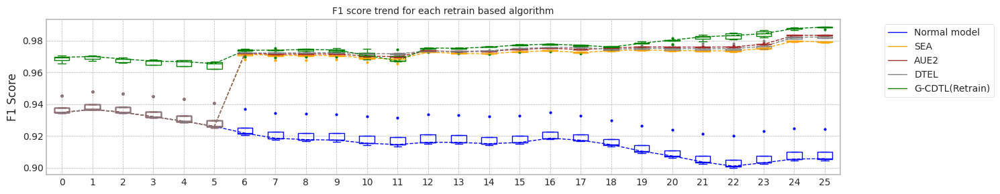

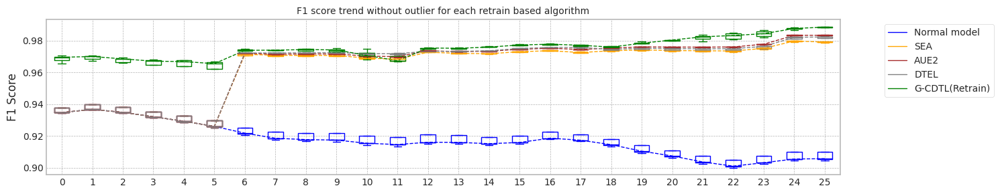

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.827256441116333
Base flops (train + inference flops of normal model, median): 17626200000.0


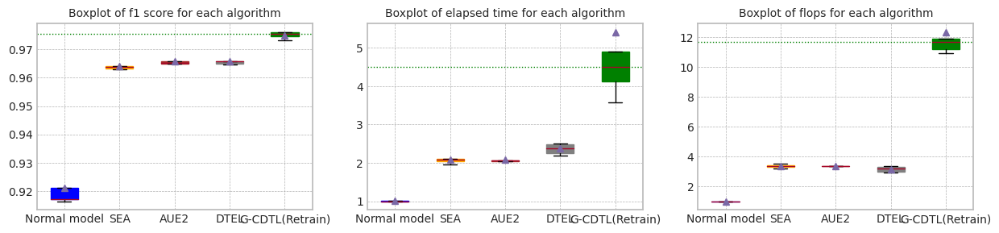

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.827256441116333


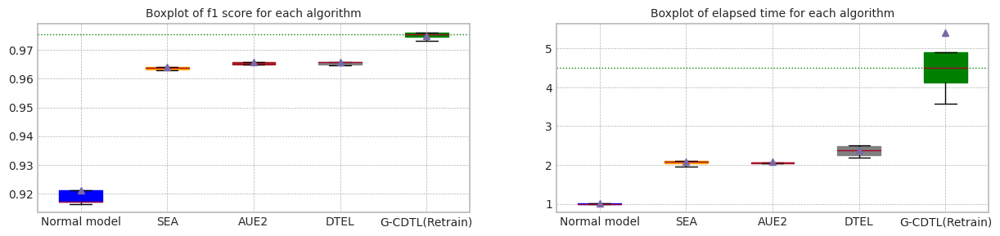

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.917332,0.905780,10.827256,1.740000e+10,226200000.0,1.762620e+10
1,1.0,0.937698,0.940101,0.921242,0.909930,10.878432,1.740000e+10,226200000.0,1.762620e+10
2,2.0,0.934735,0.936654,0.917241,0.905585,10.814729,1.740000e+10,226200000.0,1.762620e+10
3,3.0,0.945257,0.947906,0.933297,0.924414,10.801579,1.740000e+10,226200000.0,1.762620e+10
4,4.0,0.934395,0.936394,0.916477,0.904803,10.897961,1.740000e+10,226200000.0,1.762620e+10
5,median,0.934809,0.936785,0.917332,0.905780,10.827256,1.740000e+10,226200000.0,1.762620e+10
6,std,0.004601,0.004902,0.007058,0.008247,0.041935,0.000000e+00,0.0,0.000000e+00


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.957741,0.946251,10.693269,1.574000e+11,1.136200e+09,1.585362e+11
1,1.0,0.967497,0.968403,0.951043,0.927482,10.692371,1.574000e+11,1.136200e+09,1.585362e+11
2,2.0,0.970682,0.970795,0.952255,0.921099,10.716281,1.574000e+11,1.136200e+09,1.585362e+11
3,3.0,0.965645,0.967411,0.944169,0.914014,10.734544,1.574000e+11,1.136200e+09,1.585362e+11
4,4.0,0.969521,0.970020,0.954925,0.929771,10.909537,1.574000e+11,1.136200e+09,1.585362e+11
5,median,0.969521,0.970020,0.952255,0.927482,10.716281,1.574000e+11,1.136200e+09,1.585362e+11
6,std,0.002060,0.001409,0.005094,0.012035,0.091329,0.000000e+00,0.000000e+00,0.000000e+00


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.963721,0.979067,22.831042,2.974182e+10,3.058572e+10,6.032754e+10
1,1.0,0.937698,0.940101,0.964158,0.978945,22.020819,2.889096e+10,2.973486e+10,5.862582e+10
2,2.0,0.934735,0.936654,0.962908,0.979534,24.164187,3.082584e+10,3.166974e+10,6.249558e+10
3,3.0,0.945257,0.947906,0.966846,0.979414,22.674738,2.914500e+10,2.998890e+10,5.913390e+10
4,4.0,0.934395,0.936394,0.963232,0.978418,21.102680,2.765034e+10,2.849424e+10,5.614458e+10
5,median,0.934809,0.936785,0.963721,0.979067,22.674738,2.914500e+10,2.998890e+10,5.913390e+10
6,std,0.004601,0.004902,0.001568,0.000440,1.126336,1.164474e+09,1.164474e+09,2.328949e+09


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.964844,0.983651,22.103512,2.915892e+10,3.022902e+10,5.938794e+10
1,1.0,0.937698,0.940101,0.965728,0.983362,21.459575,2.837070e+10,2.944080e+10,5.781150e+10
2,2.0,0.934735,0.936654,0.965189,0.983804,22.397844,2.918154e+10,3.025164e+10,5.943318e+10
3,3.0,0.945257,0.947906,0.967775,0.983267,24.125410,3.080322e+10,3.187332e+10,6.267654e+10
4,4.0,0.934395,0.936394,0.964894,0.983172,22.436733,2.886660e+10,2.993670e+10,5.880330e+10
5,median,0.934809,0.936785,0.965189,0.983362,22.397844,2.915892e+10,3.022902e+10,5.938794e+10
6,std,0.004601,0.004902,0.001220,0.000267,0.986911,9.140853e+08,9.140853e+08,1.828171e+09


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.965662,0.982822,26.979676,3.430584e+10,2.514474e+10,5.945058e+10
1,1.0,0.937698,0.940101,0.965757,0.982299,25.836695,3.298344e+10,2.345694e+10,5.644038e+10
2,2.0,0.934735,0.936654,0.964613,0.981509,24.496377,3.113208e+10,2.160558e+10,5.273766e+10
3,3.0,0.945257,0.947906,0.967467,0.981385,23.685022,3.015420e+10,2.163690e+10,5.179110e+10
4,4.0,0.934395,0.936394,0.964832,0.982431,27.203938,3.378558e+10,2.425908e+10,5.804466e+10
5,median,0.934809,0.936785,0.965662,0.982299,25.836695,3.298344e+10,2.345694e+10,5.644038e+10
6,std,0.004601,0.004902,0.001124,0.000619,1.533715,1.769012e+09,1.577419e+09,3.322918e+09


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.973092,0.986931,107.882612,2.833200e+11,39800000.0,2.833598e+11
1,1.0,0.967497,0.968403,0.975357,0.988704,48.658400,2.053500e+11,39800000.0,2.053898e+11
2,2.0,0.970682,0.970795,0.976084,0.988080,38.841450,1.923502e+11,39800000.0,1.923900e+11
3,3.0,0.965645,0.967411,0.974501,0.988760,53.023418,2.092678e+11,39800000.0,2.093076e+11
4,4.0,0.969521,0.970020,0.975871,0.988465,44.728256,1.976744e+11,39800000.0,1.977142e+11
5,median,0.969521,0.970020,0.975357,0.988465,48.658400,2.053500e+11,39800000.0,2.053898e+11
6,std,0.002060,0.001409,0.001219,0.000752,28.024683,3.732690e+10,0.0,3.732690e+10


trial_count: 5
Lambda :  0.8
######################### Retrain 5 Trial 0 for Normal model ###########################
cuda:0
[2023-12-03 11:17:42,013] [INFO] [profiler.py:80:start_profile] Flops profiler started


100%|██████████| 2000/2000 [00:05<00:00, 378.23it/s]

Early stop: 1999
[2023-12-03 11:17:47,308] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89943074, 0.88250818]), array([0.29867675, 0.99370023]), array([0.44843898, 0.93480935]), array([ 3174, 16826]))
Test f1 score: 0.934809348093481
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9173319390967674
inference_flops: 226200000
######################### Retrain 5 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:17:58,130] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:17:58,132] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:17<00:00, 111.37it/s]

[2023-12-03 11:18:28,462] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:18:28,463] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.99215505, 0.94257837]), array([0.6773787 , 0.99898966]), array([0.80509268, 0.96996451]), array([ 3174, 16826]))
Test f1 score: 0.9699645113823249
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.863871
last_fico_range_high    0.475187
last_pymnt_amnt         0.528398
total_rec_late_fee      0.965750
int_rate                0.130821
dtype: float64
Mean F1 for all data: 0.957741204656209
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.957741204656209
######################### Retrain 5 Trial 1 for Normal model ###########################
cuda:0
[2023-12-03 11:18:39,350] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:05<00:00, 371.57it/s]

Early stop: 1999
[2023-12-03 11:18:44,740] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89495451, 0.88867011]), array([0.34089477, 0.99245216]), array([0.49372576, 0.93769829]), array([ 3174, 16826]))
Test f1 score: 0.9376982901423476
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9212417862658753
inference_flops: 226200000
######################### Retrain 5 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:18:55,617] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:18:55,619] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:17<00:00, 111.96it/s]

[2023-12-03 11:19:25,822] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:19:25,823] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98900048, 0.93824334]), array([0.65154379, 0.99863307]), array([0.78556505, 0.96749676]), array([ 3174, 16826]))
Test f1 score: 0.9674967611918814
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]

mean of drift:
recoveries              0.832729
last_fico_range_high    0.456425
last_pymnt_amnt         0.505794
total_rec_late_fee      0.965750
int_rate                0.109156
dtype: float64
Mean F1 for all data: 0.9510429341779746
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9543920694170918
######################### Retrain 5 Trial 2 for Normal model ###########################
cuda:0
[2023-12-03 11:19:36,580] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:05<00:00, 375.48it/s]

Early stop: 1999
[2023-12-03 11:19:41,914] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.89990467, 0.88232811]), array([0.29741651, 0.99375966]), array([0.44707554, 0.93473461]), array([ 3174, 16826]))
Test f1 score: 0.934734606031808
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9172405727818584
inference_flops: 226200000
######################### Retrain 5 Trial 2 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:19:52,794] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:19:52,796] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:17<00:00, 112.42it/s]

[2023-12-03 11:20:22,837] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:20:22,838] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.98214286, 0.94515766]), array([0.6931317 , 0.99762273]), array([0.81270779, 0.97068178]), array([ 3174, 16826]))
Test f1 score: 0.9706817787544093
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]

mean of drift:
recoveries              0.869952
last_fico_range_high    0.462038
last_pymnt_amnt         0.529694
total_rec_late_fee      0.965750
int_rate                0.133481
dtype: float64
Mean F1 for all data: 0.9522551587041203
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 5 Trial 3 for Normal model ###########################
cuda:0
[2023-12-03 11:20:33,463] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:05<00:00, 372.12it/s]

Early stop: 1999
[2023-12-03 11:20:38,846] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90482399, 0.90328171]), array([0.43730309, 0.99132295]), array([0.58963466, 0.94525672]), array([ 3174, 16826]))
Test f1 score: 0.9452567154029242
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9332974273094798
inference_flops: 226200000
######################### Retrain 5 Trial 3 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:20:49,827] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:20:49,830] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:17<00:00, 113.15it/s]

[2023-12-03 11:21:19,894] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:21:19,895] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.92627518, 0.94266146]), array([0.68084436, 0.98977772]), array([0.78481932, 0.9656452 ]), array([ 3174, 16826]))
Test f1 score: 0.9656452033745977
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]

mean of drift:
recoveries              0.839398
last_fico_range_high    0.407798
last_pymnt_amnt         0.517254
total_rec_late_fee      0.965750
int_rate                0.127600
dtype: float64
Mean F1 for all data: 0.9441692001956904
inference_flops: 1136200000
Normal model median        : 0.9192868626813213
Drift tolerant model median: 0.9516490464410474
######################### Retrain 5 Trial 4 for Normal model ###########################
cuda:0
[2023-12-03 11:21:30,666] [INFO] [profiler.py:80:start_profile] Flops profiler started



100%|██████████| 2000/2000 [00:05<00:00, 379.28it/s]

Early stop: 1999
[2023-12-03 11:21:35,947] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 17400000000
precision_recall_fscore: (array([0.90401567, 0.88139523]), array([0.29080025, 0.99417568]), array([0.44004768, 0.93439464]), array([ 3174, 16826]))
Test f1 score: 0.934394637620444
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]

mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9164770475937788
inference_flops: 226200000
######################### Retrain 5 Trial 4 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([20000, 6])
[2023-12-03 11:21:46,903] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:21:46,906] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


100%|██████████| 2000/2000 [00:17<00:00, 111.30it/s]

[2023-12-03 11:22:17,198] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:22:17,199] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 70000000000 70000000000 17400000000 157400000000
precision_recall_fscore: (array([0.95930736, 0.94584511]), array([0.69817265, 0.99441341]), array([0.80816922, 0.96952138]), array([ 3174, 16826]))
Test f1 score: 0.9695213813883415
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set (26, 20000, 6)


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.871642
last_fico_range_high    0.360342
last_pymnt_amnt         0.510163
total_rec_late_fee      0.911712
int_rate                0.128648
dtype: float64
Mean F1 for all data: 0.9549246120285516
inference_flops: 1136200000
Normal model median        : 0.9173319390967674
Drift tolerant model median: 0.9522551587041203
######################### Retrain 5 Trial 0 for Normal model ###########################
retrain_interval: 5
######################### Retrain 5 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.38it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:22:30,127] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:22:30,130] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:22:57,104] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:22:57,105] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 19%|█▉        | 5/26 [00:29<03:33, 10.15s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 35%|███▍      | 9/26 [00:30<00:41,  2.45s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:22:59,225] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:22:59,228] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:23:26,355] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:23:26,356] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 38%|███▊      | 10/26 [00:58<02:43, 10.20s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 54%|█████▍    | 14/26 [01:00<00:32,  2.72s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:23:28,467] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:23:28,469] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:23:55,919] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:23:55,921] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 58%|█████▊    | 15/26 [01:27<01:53, 10.30s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 73%|███████▎  | 19/26 [01:29<00:19,  2.79s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:23:58,052] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:23:58,054] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:24:25,164] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:24:25,165] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 20/26 [01:57<01:01, 10.22s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


 92%|█████████▏| 24/26 [01:58<00:05,  2.78s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:24:27,305] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:24:27,308] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:24:54,923] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:24:54,924] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 96%|█████████▌| 25/26 [02:26<00:10, 10.36s/it]

G-CDTL train flops: 14000000000 14000000000 3480000000 31480000000


100%|██████████| 26/26 [02:27<00:00,  5.67s/it]


Early stop at  [1999, 1999, 1999, 1999, 1999]
Train flops  [31480000000, 31480000000, 31480000000, 31480000000, 31480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9739041534066543
G_CDTL+AUE median: 0.9739041534066543
######################### Retrain 5 Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:36,  1.73s/it]

Ensemble_SEA train flops: 3480000000


 38%|███▊      | 10/26 [00:09<00:20,  1.26s/it]

Ensemble_SEA train flops: 1990560000


 58%|█████▊    | 15/26 [00:15<00:17,  1.62s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:21<00:10,  1.70s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:27<00:01,  1.75s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:27<00:00,  1.06s/it]


Early stop at  [1999, 1143, 1999, 1999, 1999]
Train flops  [3480000000, 1990560000, 3480000000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.96660479624363
SEA median: 0.96660479624363
######################### Retrain 5 Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:34,  1.66s/it]

Ensemble_SEA train flops: 3408660000


 38%|███▊      | 10/26 [00:11<00:27,  1.72s/it]

Ensemble_SEA train flops: 3480000000


 58%|█████▊    | 15/26 [00:17<00:19,  1.74s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:22<00:10,  1.75s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:28<00:01,  1.68s/it]

Ensemble_SEA train flops: 3219000000


100%|██████████| 26/26 [00:28<00:00,  1.11s/it]


Early stop at  [1958, 1999, 1999, 1999, 1849]
Train flops  [3408660000, 3480000000, 3480000000, 3480000000, 3219000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9680684939244528
AUE median: 0.9680684939244528
######################### Retrain 5 Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.34it/s]

Ensemble_DTEL train flops: 3480000000


 19%|█▉        | 5/26 [00:08<00:55,  2.63s/it]

Ensemble_DTEL train flops: 2345520000


 38%|███▊      | 10/26 [00:13<00:29,  1.84s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 58%|█████▊    | 15/26 [00:17<00:12,  1.11s/it]

Ensemble_DTEL train flops: 1444200000
Ensemble_DTEL train flops: 3480000


 77%|███████▋  | 20/26 [00:23<00:09,  1.62s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 8700000


 96%|█████████▌| 25/26 [00:28<00:01,  1.69s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 5220000


100%|██████████| 26/26 [00:29<00:00,  1.13s/it]


Early stop at  [1999, 1347, 1999, 1, 829, 1, 1999, 4, 1999, 2]
Train flops  [3480000000, 2345520000, 3480000000, 3480000, 1444200000, 3480000, 3480000000, 8700000, 3480000000, 5220000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9675030305545422
DTEL median: 0.9675030305545422
######################### Retrain 5 Trial 1 for Normal model ###########################
retrain_interval: 5
######################### Retrain 5 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.36it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:26:23,365] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:26:23,368] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:26:34,339] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:26:34,340] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 19%|█▉        | 5/26 [00:13<01:32,  4.38s/it]

G-CDTL train flops: 8722000000 3367000000 836940000 12925940000


 35%|███▍      | 9/26 [00:14<00:21,  1.25s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:26:36,491] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:26:36,494] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:26:45,755] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:26:45,756] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 38%|███▊      | 10/26 [00:24<01:01,  3.86s/it]

G-CDTL train flops: 6076000000 3710000000 922200000 10708200000


 54%|█████▍    | 14/26 [00:26<00:14,  1.22s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:26:47,810] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:26:47,813] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:26:57,203] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:26:57,205] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 58%|█████▊    | 15/26 [00:35<00:41,  3.81s/it]

G-CDTL train flops: 4466000000 4893000000 1216260000 10575260000


 73%|███████▎  | 19/26 [00:37<00:08,  1.23s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:26:59,279] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:26:59,281] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:27:15,436] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:27:15,437] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 20/26 [00:54<00:35,  5.84s/it]

G-CDTL train flops: 14000000000 4032000000 1002240000 19034240000


 92%|█████████▏| 24/26 [00:55<00:03,  1.73s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:27:17,597] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:27:17,600] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:27:28,114] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:27:28,115] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 96%|█████████▌| 25/26 [01:06<00:04,  4.50s/it]

G-CDTL train flops: 6216000000 4550000000 1131000000 11897000000


100%|██████████| 26/26 [01:07<00:00,  2.59s/it]


Early stop at  [480, 529, 698, 575, 649]
Train flops  [12925940000, 10708200000, 10575260000, 19034240000, 11897000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.976178170937454
G_CDTL+AUE median: 0.975041162172054
######################### Retrain 5 Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:36,  1.76s/it]

Ensemble_SEA train flops: 3480000000


 38%|███▊      | 10/26 [00:11<00:27,  1.72s/it]

Ensemble_SEA train flops: 3347760000


 58%|█████▊    | 15/26 [00:17<00:19,  1.74s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:22<00:10,  1.72s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:28<00:01,  1.78s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:29<00:00,  1.13s/it]


Early stop at  [1999, 1923, 1999, 1999, 1999]
Train flops  [3480000000, 3347760000, 3480000000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.967378836134732
SEA median: 0.9669918161891811
######################### Retrain 5 Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:36,  1.73s/it]

Ensemble_SEA train flops: 3480000000


 38%|███▊      | 10/26 [00:11<00:27,  1.73s/it]

Ensemble_SEA train flops: 3480000000


 58%|█████▊    | 15/26 [00:15<00:14,  1.35s/it]

Ensemble_SEA train flops: 2270700000


 77%|███████▋  | 20/26 [00:20<00:07,  1.18s/it]

Ensemble_SEA train flops: 1966200000


 96%|█████████▌| 25/26 [00:25<00:01,  1.65s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:26<00:00,  1.01s/it]


Early stop at  [1999, 1999, 1304, 1129, 1999]
Train flops  [3480000000, 3480000000, 2270700000, 1966200000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9682440421482076
AUE median: 0.9681562680363303
######################### Retrain 5 Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.35it/s]

Ensemble_DTEL train flops: 3480000000


 19%|█▉        | 5/26 [00:07<00:51,  2.44s/it]

Ensemble_DTEL train flops: 1767840000


 38%|███▊      | 10/26 [00:11<00:18,  1.15s/it]

Ensemble_DTEL train flops: 1315440000
Ensemble_DTEL train flops: 3480000


 58%|█████▊    | 15/26 [00:17<00:17,  1.63s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 77%|███████▋  | 20/26 [00:22<00:10,  1.69s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 8700000


 96%|█████████▌| 25/26 [00:28<00:01,  1.74s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 5220000


100%|██████████| 26/26 [00:28<00:00,  1.11s/it]


Early stop at  [1999, 1015, 755, 1, 1999, 1, 1999, 4, 1999, 2]
Train flops  [3480000000, 1767840000, 1315440000, 3480000, 3480000000, 3480000, 3480000000, 8700000, 3480000000, 5220000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9681121179280218
DTEL median: 0.9678075742412819
######################### Retrain 5 Trial 2 for Normal model ###########################
retrain_interval: 5
######################### Retrain 5 Trial 2 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.32it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:28:55,508] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:28:55,510] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:29:03,160] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:29:03,161] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 19%|█▉        | 5/26 [00:09<01:06,  3.19s/it]

G-CDTL train flops: 4109000000 3521000000 875220000 8505220000


 35%|███▍      | 9/26 [00:11<00:16,  1.00it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:29:05,280] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:29:05,283] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:29:15,580] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:29:15,582] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 38%|███▊      | 10/26 [00:22<01:04,  4.00s/it]

G-CDTL train flops: 6755000000 3976000000 988320000 11719320000


 54%|█████▍    | 14/26 [00:23<00:15,  1.26s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:29:17,658] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:29:17,660] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:29:22,794] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:29:22,795] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 58%|█████▊    | 15/26 [00:29<00:28,  2.55s/it]

G-CDTL train flops: 819000000 3787000000 941340000 5547340000


 73%|███████▎  | 19/26 [00:31<00:06,  1.07it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:29:24,920] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:29:24,922] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:29:34,779] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:29:34,781] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 20/26 [00:41<00:22,  3.74s/it]

G-CDTL train flops: 6916000000 3451000000 857820000 11224820000


 92%|█████████▏| 24/26 [00:43<00:02,  1.22s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:29:36,930] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:29:36,933] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:29:49,845] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:29:49,846] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 96%|█████████▌| 25/26 [00:56<00:04,  4.86s/it]

G-CDTL train flops: 9800000000 3815000000 948300000 14563300000


100%|██████████| 26/26 [00:56<00:00,  2.19s/it]


Early stop at  [502, 567, 540, 492, 544]
Train flops  [8505220000, 11719320000, 5547340000, 11224820000, 14563300000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9763413590584118
G_CDTL+AUE median: 0.976178170937454
######################### Retrain 5 Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:32,  1.55s/it]

Ensemble_SEA train flops: 2867520000


 38%|███▊      | 10/26 [00:09<00:22,  1.38s/it]

Ensemble_SEA train flops: 2455140000


 58%|█████▊    | 15/26 [00:15<00:17,  1.57s/it]

Ensemble_SEA train flops: 3145920000


 77%|███████▋  | 20/26 [00:21<00:10,  1.73s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:26<00:01,  1.56s/it]

Ensemble_SEA train flops: 2869260000


100%|██████████| 26/26 [00:26<00:00,  1.03s/it]


Early stop at  [1647, 1410, 1807, 1999, 1648]
Train flops  [2867520000, 2455140000, 3145920000, 3480000000, 2869260000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9667455934938339
SEA median: 0.9667455934938339
######################### Retrain 5 Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:36,  1.73s/it]

Ensemble_SEA train flops: 3480000000


 38%|███▊      | 10/26 [00:11<00:27,  1.72s/it]

Ensemble_SEA train flops: 3480000000


 58%|█████▊    | 15/26 [00:17<00:19,  1.73s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:22<00:10,  1.74s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:28<00:01,  1.76s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:29<00:00,  1.12s/it]


Early stop at  [1999, 1999, 1999, 1999, 1999]
Train flops  [3480000000, 3480000000, 3480000000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9676215161126419
AUE median: 0.9680684939244528
######################### Retrain 5 Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.44it/s]

Ensemble_DTEL train flops: 3467820000


 19%|█▉        | 5/26 [00:08<00:53,  2.57s/it]

Ensemble_DTEL train flops: 2056680000


 38%|███▊      | 10/26 [00:13<00:26,  1.68s/it]

Ensemble_DTEL train flops: 2958000000
Ensemble_DTEL train flops: 3480000


 58%|█████▊    | 15/26 [00:19<00:19,  1.75s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 77%|███████▋  | 20/26 [00:24<00:10,  1.73s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 6960000


 96%|█████████▌| 25/26 [00:30<00:01,  1.75s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


100%|██████████| 26/26 [00:31<00:00,  1.19s/it]


Early stop at  [1992, 1181, 1699, 1, 1999, 1, 1999, 3, 1999, 1]
Train flops  [3467820000, 2056680000, 2958000000, 3480000, 3480000000, 3480000, 3480000000, 6960000, 3480000000, 3480000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9675409634472272
DTEL median: 0.9675409634472272
######################### Retrain 5 Trial 3 for Normal model ###########################
retrain_interval: 5
######################### Retrain 5 Trial 3 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.38it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:31:19,459] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:31:19,462] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:31:25,186] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:31:25,187] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 19%|█▉        | 5/26 [00:07<00:52,  2.49s/it]

G-CDTL train flops: 2191000000 3248000000 807360000 6246360000


 35%|███▍      | 9/26 [00:09<00:14,  1.19it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:31:27,244] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:31:27,246] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:31:37,269] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:31:37,271] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 38%|███▊      | 10/26 [00:19<01:00,  3.80s/it]

G-CDTL train flops: 6748000000 3465000000 861300000 11074300000


 54%|█████▍    | 14/26 [00:21<00:14,  1.21s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:31:39,371] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:31:39,374] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:31:44,164] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:31:44,166] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 58%|█████▊    | 15/26 [00:26<00:26,  2.42s/it]

G-CDTL train flops: 336000000 3696000000 918720000 4950720000


 73%|███████▎  | 19/26 [00:28<00:06,  1.12it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:31:46,257] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:31:46,259] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:31:51,864] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:31:51,865] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 20/26 [00:34<00:14,  2.44s/it]

G-CDTL train flops: 399000000 4312000000 1071840000 5782840000


 92%|█████████▏| 24/26 [00:36<00:01,  1.10it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:31:54,031] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:31:54,033] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:32:03,826] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:32:03,827] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 96%|█████████▌| 25/26 [00:46<00:03,  3.71s/it]

G-CDTL train flops: 483000000 7749000000 1926180000 10158180000


100%|██████████| 26/26 [00:46<00:00,  1.80s/it]


Early stop at  [463, 494, 527, 615, 1106]
Train flops  [6246360000, 11074300000, 4950720000, 5782840000, 10158180000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.975375564635978
G_CDTL+AUE median: 0.975776867786716
######################### Retrain 5 Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:37,  1.76s/it]

Ensemble_SEA train flops: 3393000000


 38%|███▊      | 10/26 [00:11<00:28,  1.77s/it]

Ensemble_SEA train flops: 3480000000


 58%|█████▊    | 15/26 [00:17<00:19,  1.77s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:23<00:10,  1.80s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:29<00:01,  1.79s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:29<00:00,  1.15s/it]


Early stop at  [1949, 1999, 1999, 1999, 1999]
Train flops  [3393000000, 3480000000, 3480000000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9514190959999884
SEA median: 0.966675194868732
######################### Retrain 5 Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:36,  1.73s/it]

Ensemble_SEA train flops: 3283380000


 38%|███▊      | 10/26 [00:11<00:28,  1.76s/it]

Ensemble_SEA train flops: 3480000000


 58%|█████▊    | 15/26 [00:17<00:19,  1.79s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:23<00:10,  1.79s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:29<00:01,  1.77s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:29<00:00,  1.14s/it]


Early stop at  [1886, 1999, 1999, 1999, 1999]
Train flops  [3283380000, 3480000000, 3480000000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9703247091346225
AUE median: 0.9681562680363303
######################### Retrain 5 Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.36it/s]

Ensemble_DTEL train flops: 3480000000


 19%|█▉        | 5/26 [00:07<00:51,  2.46s/it]

Ensemble_DTEL train flops: 1825260000


 38%|███▊      | 10/26 [00:12<00:23,  1.48s/it]

Ensemble_DTEL train flops: 2321160000
Ensemble_DTEL train flops: 3480000


 58%|█████▊    | 15/26 [00:17<00:18,  1.67s/it]

Ensemble_DTEL train flops: 3365160000
Ensemble_DTEL train flops: 3480000


 77%|███████▋  | 20/26 [00:23<00:10,  1.77s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 6960000


 96%|█████████▌| 25/26 [00:29<00:01,  1.84s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 10440000


100%|██████████| 26/26 [00:30<00:00,  1.17s/it]


Early stop at  [1999, 1048, 1333, 1, 1933, 1, 1999, 3, 1999, 5]
Train flops  [3480000000, 1825260000, 2321160000, 3480000, 3365160000, 3480000, 3480000000, 6960000, 3480000000, 10440000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9698584387722382
DTEL median: 0.9678265406876245
######################### Retrain 5 Trial 4 for Normal model ###########################
retrain_interval: 5
######################### Retrain 5 Trial 4 for G_CDTL+AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.32it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:33:36,399] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:33:36,401] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:33:40,097] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:33:40,098] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 19%|█▉        | 5/26 [00:05<00:36,  1.76s/it]

G-CDTL train flops: 308000000 2793000000 694260000 3795260000


 35%|███▍      | 9/26 [00:07<00:11,  1.44it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:33:42,179] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:33:42,182] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:33:54,664] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:33:54,665] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 38%|███▊      | 10/26 [00:20<01:11,  4.47s/it]

G-CDTL train flops: 8323000000 4305000000 1070100000 13698100000


 54%|█████▍    | 14/26 [00:22<00:16,  1.37s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:33:56,751] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:33:56,753] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:34:02,242] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:34:02,243] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 58%|█████▊    | 15/26 [00:28<00:30,  2.74s/it]

G-CDTL train flops: 462000000 4130000000 1026600000 5618600000


 73%|███████▎  | 19/26 [00:29<00:06,  1.03it/s]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:34:04,322] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:34:04,324] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:34:18,203] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:34:18,204] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 20/26 [00:43<00:29,  4.97s/it]

G-CDTL train flops: 10290000000 3885000000 965700000 15140700000


 92%|█████████▏| 24/26 [00:45<00:03,  1.52s/it]

G-CDTL Train: torch.Size([4000, 6])
[2023-12-03 11:34:20,360] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-03 11:34:20,362] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-03 11:34:26,881] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-03 11:34:26,882] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 96%|█████████▌| 25/26 [00:52<00:03,  3.15s/it]

G-CDTL train flops: 420000000 4935000000 1226700000 6581700000


100%|██████████| 26/26 [00:53<00:00,  2.04s/it]


Early stop at  [398, 614, 589, 554, 704]
Train flops  [3795260000, 13698100000, 5618600000, 15140700000, 6581700000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9767120093272477
G_CDTL+AUE median: 0.976178170937454
######################### Retrain 5 Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:31,  1.51s/it]

Ensemble_SEA train flops: 2723100000


 38%|███▊      | 10/26 [00:10<00:26,  1.64s/it]

Ensemble_SEA train flops: 3152880000


 58%|█████▊    | 15/26 [00:16<00:19,  1.77s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:20<00:07,  1.20s/it]

Ensemble_SEA train flops: 1687800000


 96%|█████████▌| 25/26 [00:26<00:01,  1.70s/it]

Ensemble_SEA train flops: 3420840000


100%|██████████| 26/26 [00:26<00:00,  1.04s/it]


Early stop at  [1564, 1811, 1999, 969, 1965]
Train flops  [2723100000, 3152880000, 3480000000, 1687800000, 3420840000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.966517933680995
SEA median: 0.96660479624363
######################### Retrain 5 Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 19%|█▉        | 5/26 [00:05<00:38,  1.82s/it]

Ensemble_SEA train flops: 3480000000


 38%|███▊      | 10/26 [00:11<00:28,  1.79s/it]

Ensemble_SEA train flops: 3480000000


 58%|█████▊    | 15/26 [00:17<00:19,  1.78s/it]

Ensemble_SEA train flops: 3480000000


 77%|███████▋  | 20/26 [00:23<00:10,  1.78s/it]

Ensemble_SEA train flops: 3480000000


 96%|█████████▌| 25/26 [00:29<00:01,  1.78s/it]

Ensemble_SEA train flops: 3480000000


100%|██████████| 26/26 [00:29<00:00,  1.15s/it]


Early stop at  [1999, 1999, 1999, 1999, 1999]
Train flops  [3480000000, 3480000000, 3480000000, 3480000000, 3480000000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9676377724778717
AUE median: 0.9680684939244528
######################### Retrain 5 Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


 15%|█▌        | 4/26 [00:01<00:09,  2.44it/s]

Ensemble_DTEL train flops: 3480000000


 19%|█▉        | 5/26 [00:08<00:57,  2.74s/it]

Ensemble_DTEL train flops: 2364660000


 38%|███▊      | 10/26 [00:14<00:30,  1.91s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 3480000


 58%|█████▊    | 15/26 [00:18<00:15,  1.41s/it]

Ensemble_DTEL train flops: 2295060000
Ensemble_DTEL train flops: 3480000


 77%|███████▋  | 20/26 [00:24<00:09,  1.61s/it]

Ensemble_DTEL train flops: 3121560000
Ensemble_DTEL train flops: 8700000


 96%|█████████▌| 25/26 [00:30<00:01,  1.78s/it]

Ensemble_DTEL train flops: 3480000000
Ensemble_DTEL train flops: 5220000


100%|██████████| 26/26 [00:30<00:00,  1.19s/it]


Early stop at  [1999, 1358, 1999, 1, 1318, 1, 1793, 4, 1999, 2]
Train flops  [3480000000, 2364660000, 3480000000, 3480000, 2295060000, 3480000, 3121560000, 8700000, 3480000000, 5220000]
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9674506205079628
DTEL median: 0.9675409634472272


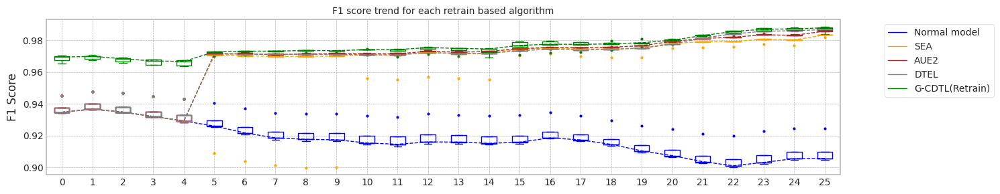

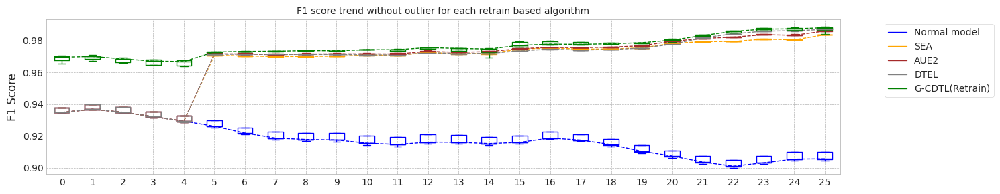

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.859191417694092
Base flops (train + inference flops of normal model, median): 17626200000.0


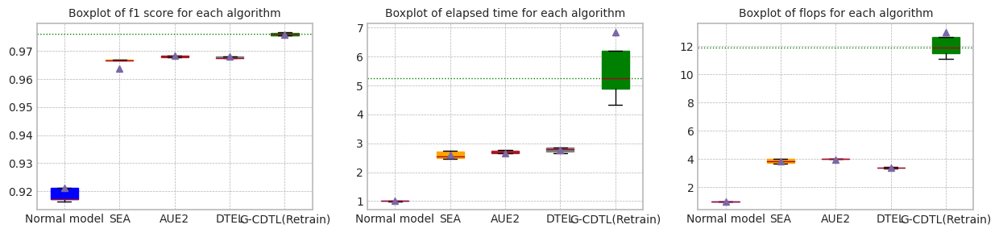

Base elapsed time (inference elapsed time of normal model, median (ms)): 10.859191417694092


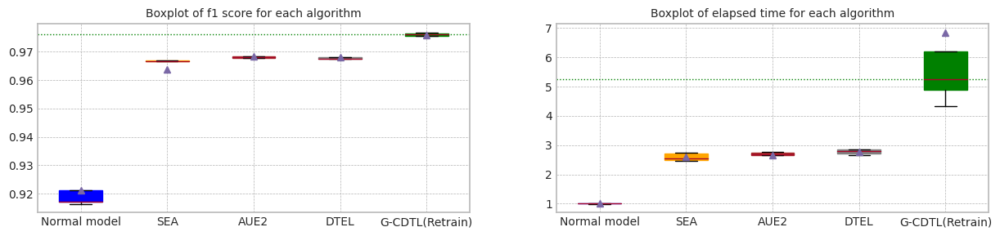

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.917332,0.905780,10.797101,1.740000e+10,226200000.0,1.762620e+10
1,1.0,0.937698,0.940101,0.921242,0.909930,10.854616,1.740000e+10,226200000.0,1.762620e+10
2,2.0,0.934735,0.936654,0.917241,0.905585,10.859191,1.740000e+10,226200000.0,1.762620e+10
3,3.0,0.945257,0.947906,0.933297,0.924414,10.958061,1.740000e+10,226200000.0,1.762620e+10
4,4.0,0.934395,0.936394,0.916477,0.904803,10.934596,1.740000e+10,226200000.0,1.762620e+10
5,median,0.934809,0.936785,0.917332,0.905780,10.859191,1.740000e+10,226200000.0,1.762620e+10
6,std,0.004601,0.004902,0.007058,0.008247,0.065233,0.000000e+00,0.0,0.000000e+00


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.957741,0.946251,10.863348,1.574000e+11,1.136200e+09,1.585362e+11
1,1.0,0.967497,0.968403,0.951043,0.927482,10.732354,1.574000e+11,1.136200e+09,1.585362e+11
2,2.0,0.970682,0.970795,0.952255,0.921099,10.596804,1.574000e+11,1.136200e+09,1.585362e+11
3,3.0,0.965645,0.967411,0.944169,0.914014,10.745884,1.574000e+11,1.136200e+09,1.585362e+11
4,4.0,0.969521,0.970020,0.954925,0.929771,10.779548,1.574000e+11,1.136200e+09,1.585362e+11
5,median,0.969521,0.970020,0.952255,0.927482,10.745884,1.574000e+11,1.136200e+09,1.585362e+11
6,std,0.002060,0.001409,0.005094,0.012035,0.096582,0.000000e+00,0.000000e+00,0.000000e+00


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.966605,0.983715,27.594379,3.331056e+10,3.425016e+10,6.756072e+10
1,1.0,0.937698,0.940101,0.967379,0.983496,29.427630,3.466776e+10,3.560736e+10,7.027512e+10
2,2.0,0.934735,0.936654,0.966746,0.983557,26.738009,3.221784e+10,3.315744e+10,6.537528e+10
3,3.0,0.945257,0.947906,0.951419,0.981756,29.847794,3.471300e+10,3.565260e+10,7.036560e+10
4,4.0,0.934395,0.936394,0.966518,0.983526,26.994571,3.186462e+10,3.280422e+10,6.466884e+10
5,median,0.934809,0.936785,0.966605,0.983526,27.594379,3.331056e+10,3.425016e+10,6.756072e+10
6,std,0.004601,0.004902,0.006892,0.000817,1.427229,1.330774e+09,1.330774e+09,2.661549e+09


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.968068,0.986086,28.874065,3.446766e+10,3.563346e+10,7.010112e+10
1,1.0,0.937698,0.940101,0.968244,0.985798,26.342185,3.207690e+10,3.324270e+10,6.531960e+10
2,2.0,0.934735,0.936654,0.967622,0.985772,29.250906,3.480000e+10,3.596580e+10,7.076580e+10
3,3.0,0.945257,0.947906,0.970325,0.986122,29.644182,3.460338e+10,3.576918e+10,7.037256e+10
4,4.0,0.934395,0.936394,0.967638,0.985898,29.927553,3.480000e+10,3.596580e+10,7.076580e+10
5,median,0.934809,0.936785,0.968068,0.985898,29.250906,3.460338e+10,3.576918e+10,7.037256e+10
6,std,0.004601,0.004902,0.001121,0.000162,1.434693,1.167177e+09,1.167177e+09,2.334353e+09


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.934809,0.936785,0.967503,0.986850,29.356839,3.513060e+10,2.415990e+10,5.929050e+10
1,1.0,0.937698,0.940101,0.968112,0.986921,28.971543,3.442416e+10,2.358222e+10,5.800638e+10
2,2.0,0.934735,0.936654,0.967541,0.986573,31.043109,3.633990e+10,2.386758e+10,6.020748e+10
3,3.0,0.945257,0.947906,0.969858,0.986810,30.440061,3.537594e+10,2.364312e+10,5.901906e+10
4,4.0,0.934395,0.936394,0.967451,0.986960,30.857484,3.564216e+10,2.417904e+10,5.982120e+10
5,median,0.934809,0.936785,0.967541,0.986850,30.440061,3.537594e+10,2.386758e+10,5.929050e+10
6,std,0.004601,0.004902,0.001023,0.000152,0.921801,7.010617e+08,2.795108e+08,8.430319e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.969965,0.970218,0.973904,0.986399,147.376974,3.148000e+11,19900000.0,3.148199e+11
1,1.0,0.967497,0.968403,0.976178,0.988681,67.379579,2.225406e+11,19900000.0,2.225605e+11
2,2.0,0.970682,0.970795,0.976341,0.988289,56.961318,2.089600e+11,19900000.0,2.089799e+11
3,3.0,0.965645,0.967411,0.975376,0.984046,46.948279,1.956124e+11,19900000.0,1.956323e+11
4,4.0,0.969521,0.970020,0.976712,0.987991,53.118675,2.022344e+11,19900000.0,2.022543e+11
5,median,0.969521,0.970020,0.976178,0.987991,56.961318,2.089600e+11,19900000.0,2.089799e+11
6,std,0.002060,0.001409,0.001117,0.001905,41.489502,4.908144e+10,0.0,4.908144e+10


Test F1 Score: 0.937378719458201
G-CDTL, 1-retrain: 0.9700241881612239


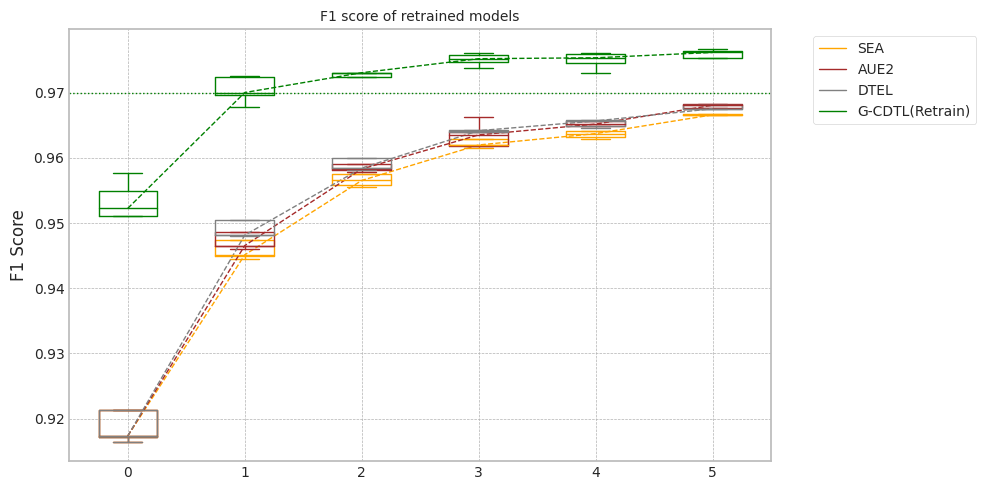

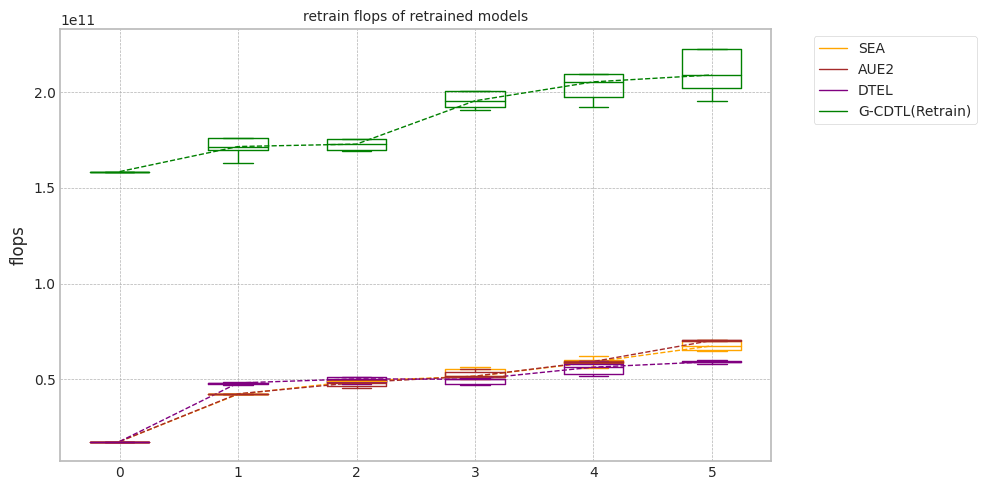

In [ ]:
experiment_all(2000,'LC_A',X1, Y1,train_size, test_size,avaible_range = 1000,
               lambda_f2=0.8,trial_count=5,lr_g=0.0002,retrain_count=5,weight_init=True)

### #2 시간 단위로 bucket 만들기

#### data 정제

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [ ]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015])) #,X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015])) #,Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))#[top_columns+['issue_d']]

In [ ]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,renewable_energy,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,0,1,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,0,1,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,0,1,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,0,1,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818963,35000.0,60,18.99,76465.0,201512,20.37,0.0,684.0,0.0,15.0,...,0,0,0,0,0,0,0,1,0,0
818964,18000.0,60,9.99,70000.0,201512,30.65,0.0,714.0,2.0,14.0,...,0,0,0,0,1,0,0,0,0,0
818965,10800.0,36,17.57,30000.0,201512,38.48,0.0,674.0,1.0,12.0,...,0,0,0,0,0,0,0,1,0,0
818966,15000.0,36,5.32,82000.0,201512,22.83,0.0,759.0,0.0,15.0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [ ]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [ ]:
b_cnt = X2.groupby(['b'])['b'].count()

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = X2.iloc[s,:]
Y3 = Y2[s]

In [ ]:
b_cnt2 = X3.groupby(['b'])['b'].count()

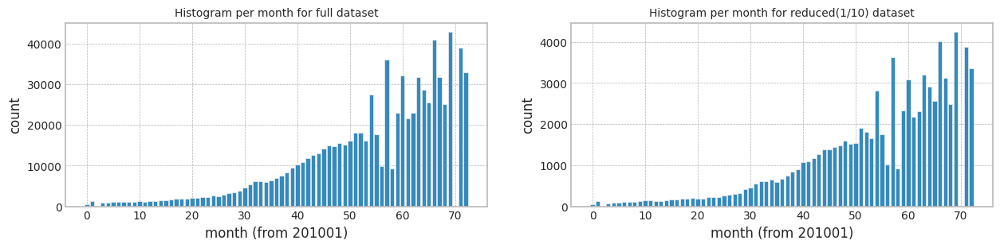

In [ ]:
fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
ax[0].bar(b_cnt.index,b_cnt.values)
ax[0].set_ylabel('count')
ax[0].set_xlabel('month (from 201001)')
ax[0].set_title(f'Histogram per month for full dataset',fontdict={'fontsize':10})

ax[1].bar(b_cnt2.index,b_cnt2.values)
ax[1].set_ylabel('count')
ax[1].set_xlabel('month (from 201001)')
ax[1].set_title(f'Histogram per month for reduced(1/10) dataset',fontdict={'fontsize':10})

plt.show()

In [ ]:
X3.drop(columns=['issue_d'],inplace=True)

In [ ]:
X3

,loan_amnt,term,int_rate,annual_inc,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,pub_rec,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
25,5000.0,36,8.59,70000.0,2.35,0.0,749.0,1.0,11.0,0.0,...,0,0,0,0,0,1,0,0,0,0
42,7750.0,36,12.87,29808.0,22.42,0.0,694.0,0.0,6.0,1.0,...,0,0,0,0,0,0,1,0,0,0
50,19600.0,36,15.65,67499.0,13.58,0.0,679.0,0.0,14.0,1.0,...,0,0,0,1,0,0,0,0,0,0
59,12000.0,36,8.94,90000.0,6.19,0.0,754.0,0.0,11.0,0.0,...,0,0,0,0,0,0,1,0,0,0
63,20000.0,36,12.87,51600.0,0.23,0.0,804.0,3.0,3.0,0.0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818907,19075.0,36,15.41,45444.84,17.48,0.0,669.0,0.0,8.0,0.0,...,0,0,0,0,0,1,0,0,0,72
818918,6000.0,36,12.05,100000.0,13.27,0.0,669.0,1.0,9.0,0.0,...,0,0,0,0,0,0,1,0,0,72
818935,20425.0,36,17.57,65000.0,19.81,0.0,669.0,1.0,17.0,2.0,...,0,0,0,1,0,0,0,0,0,72
818947,6000.0,36,11.49,90000.0,11.88,0.0,669.0,2.0,10.0,1.0,...,0,0,0,1,0,0,0,0,0,72


#### Drift tolerant 학습

train_size 19157
Dataset has buckets!
MI Analysis MI Max 0.30709, Min 0.01637, Mean 0.16365, Std 0.11537
Dataset structure X_train, (19157, 5) X_test, (19157, 5) X_live (79896, 5)
bucket range in live set 17~72
Truncate 0 rows from live_set (79896, 5)
Search MI & Drift...for X_live_set (55,)


100%|██████████| 55/55 [00:02<00:00, 20.27it/s]


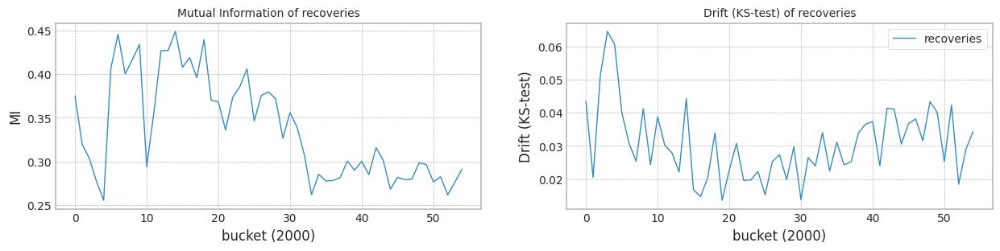

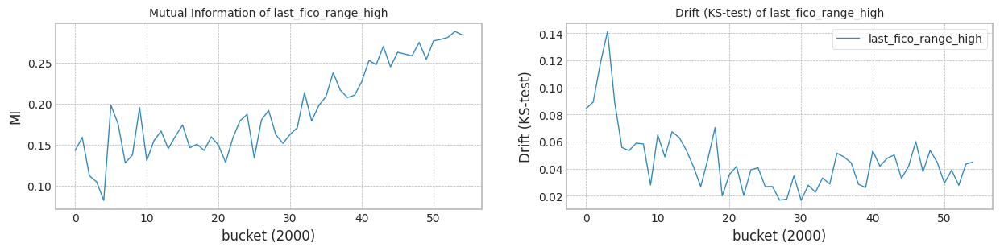

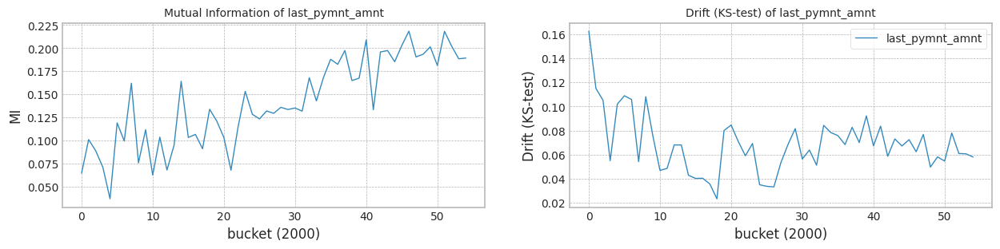

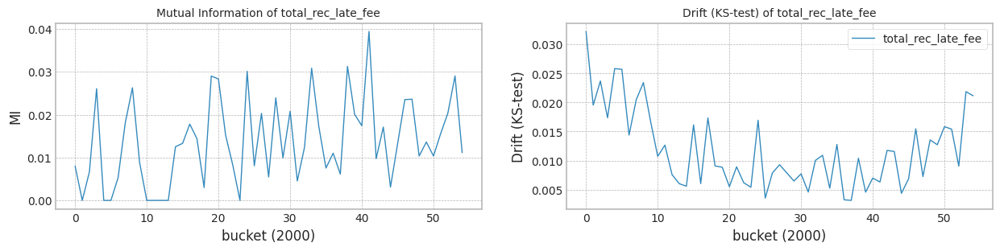

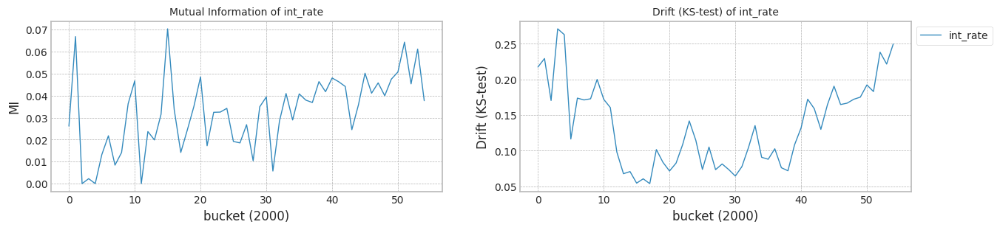

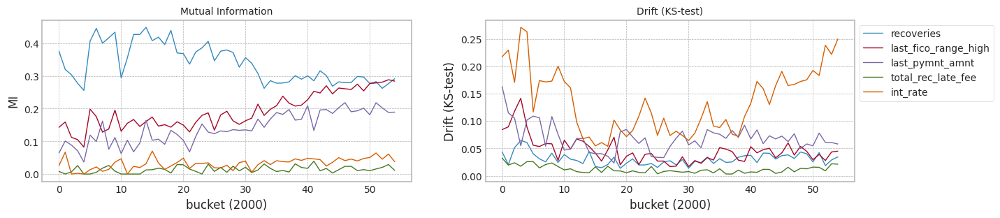

In [ ]:
top_columns = list(mi_scores[0:5].index)
#top_columns = ['last_pymnt_amnt', 'total_rec_late_fee', 'inq_last_6mths', 'total_rec_int', 'Y']
#top_columns = ['int_rate', 'last_pymnt_amnt', 'fico_range_high', 'inq_last_6mths', 'total_rec_int']

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
#train_size = X3[X3['b'] < 36].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 2000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

In [ ]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant2(m_epochs,experiment_title,X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20,lr_g=0.001,retrain_count=1, weight_init = False,isTest = False):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=m_epochs, k=5, lr_g=lr_g, lr_f=0.001, lr_r=0.001,weight_init=weight_init)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('Lambda : ',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()

    #G-CDTL+SEA
    gea_result_data,gea_train_data,gea_result_table = prepare_result_data()
    #SEA
    sea_result_data,sea_train_data,sea_result_table = prepare_result_data()
    #AUE
    aue_result_data,aue_train_data,aue_result_table = prepare_result_data()
    #DTEL
    dte_result_data,dte_train_data,dte_result_table = prepare_result_data()

    org_g_cdtls = []
    org_discriminators = []

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Retrain {retrain_count} Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Retrain {retrain_count} Trial {idx} for G-CDTL ###########################')


        f1,model, df_loss, train_flops = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns,ShowChart=False)# 0.00057)

        start = time.time()
        tad,df_mis,df_drf, inference_flops = test_all_data(model,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        inference_time = time.time() - start
        print('inference_flops:',inference_flops)
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,inference_time,nor_result_data,nor_train_data,nor_result_table,[train_flops],inference_flops)
            org_discriminators.append((model,df_loss['Predictor loss'][-1:].values[0]))
            org_flops = train_flops
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,inference_time,gcd_result_data,gcd_train_data,gcd_result_table,[train_flops],inference_flops)
            org_g_cdtls.append((model,df_loss['Predictor loss'][-1:].values[0]))
            gdc_flops = train_flops

            print('Normal model median        :',np.median(nor_result_table['Mean F1']))
            print('Drift tolerant model median:',np.median(gcd_result_table['Mean F1']))



    if isTest:
        original_statistics_df = pd.DataFrame(nor_result_table)
        drift_statistics_df = pd.DataFrame(gcd_result_table)
        return original_statistics_df,drift_statistics_df

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(sea_result_table['Testset F1'])
            print(f'######################### Retrain {retrain_count} Trial {idx} for Normal model ###########################')
            retrain_interval = int(len(tad)/(retrain_count+1)) + 1
            # 중간에 1회 retrain 하도록 함.
            print('retrain_interval:',retrain_interval)

            ensemble_gcdtl = G_CDTL_AUE2(10,retrain_interval,avaible_range,lambda_f2,do_early_stop=True)
            ensemble_gcdtl.add_model(org_g_cdtls[idx][0],None,None)

            ensemble_sea = Ensemble_SEA(10,retrain_interval)
            ensemble_sea.add_model(org_discriminators[idx][0],None,None)

            ensemble_aue = Ensemble_AUE2(10,retrain_interval)
            ensemble_aue.add_model(org_discriminators[idx][0],None,None)

            ensemble_dte = Ensemble_DTEL(10,retrain_interval)
            ensemble_dte.add_model(org_discriminators[idx][0],None,None)

        else:

            # f1 은 normal model과 같다.

            idx = len(sea_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)

            print(f'######################### Retrain {retrain_count} Trial {idx} for G_CDTL+AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(retrain_count,train_opt,ensemble_gcdtl,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gea_result_data,gea_train_data,gea_result_table,train_flops+[gdc_flops],inference_flops)
            print('G_CDTL+AUE median:',np.median(gea_result_table['Mean F1']))

            print(f'######################### Retrain {retrain_count} Trial {idx} for SEA ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(retrain_count,train_opt,ensemble_sea,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,sea_result_data,sea_train_data,sea_result_table,train_flops+[org_flops],inference_flops)
            print('SEA median:',np.median(sea_result_table['Mean F1']))

            print(f'######################### Retrain {retrain_count} Trial {idx} for AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(retrain_count,train_opt,ensemble_aue,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,aue_result_data,aue_train_data,aue_result_table,train_flops+[org_flops],inference_flops)
            print('AUE median:',np.median(aue_result_table['Mean F1']))

            print(f'######################### Retrain {retrain_count} Trial {idx} for DTEL ###########################')
            start = time.time()
            tad,df_mis,df_drf,train_flops,inference_flops = compare_algorithm(retrain_count,train_opt,ensemble_dte,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,dte_result_data,dte_train_data,dte_result_table,train_flops+[org_flops],inference_flops)
            print('DTEL median:',np.median(dte_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)

    GEA_df = pd.DataFrame(gea_result_data)
    SEA_df = pd.DataFrame(sea_result_data)
    AUE_df = pd.DataFrame(aue_result_data)
    DTEL_df = pd.DataFrame(dte_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)

    gea_statistics_df = pd.DataFrame(gea_result_table)
    sea_statistics_df = pd.DataFrame(sea_result_table)
    aue_statistics_df = pd.DataFrame(aue_result_table)
    dte_statistics_df = pd.DataFrame(dte_result_table)

    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)

    set_mean_sem(gea_statistics_df)
    set_mean_sem(sea_statistics_df)
    set_mean_sem(aue_statistics_df)
    set_mean_sem(dte_statistics_df)

    if retrain_count == 1:

        #G-CDTL 과 Normal model 의 plot
        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
        set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL')
        plt.tight_layout()
        plt.show()
        #G-CDTL 과 Normal model 의 plot, outlier 제거
        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
        set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL without outlier')
        plt.tight_layout()
        plt.show()
        # Best case를 찾는다.
        max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
        print('max_mean_trial=',max_mean_trial)

        # Best case에 대한 G-CDTL
        fig, ax = plt.subplots(figsize=main_figsize)
        Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
        Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        ax.set_title('Max F1 score of G-CDTL with normal model median',fontdict={'fontsize':10})
        plt.tight_layout()
        plt.show()

        # Best case에 대한 G-CDTL의 loss
        og_loss,og_mis,og_drf = nor_train_data['T0']
        df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

        ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
        ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()

        # Best case에서 Generator 이전, 이후의 MI
        fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
        og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
        ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
        df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
        ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()
        # Best case에서 Generator 이전, 이후의 Drift
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
        ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
        df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
        ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
        lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=True)
        lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=True)
        lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray',showfliers=True)
        #lg = draw_chart(ax,lg,'G-CDTL+Retrain',GEA_df,'green',showfliers=True)
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
        set_legend(ax,lg,'F1 score trend for each retrain based algorithm')
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=main_figsize)
        lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
        lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=False)
        lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=False)
        lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray',showfliers=False)
        #lg = draw_chart(ax,lg,'G-CDTL+Retrain',GEA_df,'green',showfliers=False)
        lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
        set_legend(ax,lg,'F1 score trend without outlier for each retrain based algorithm')
        plt.tight_layout()
        plt.show()


    if retrain_count == 1:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=3)
        # mean f1
        box = ax[0].boxplot(
                    [original_statistics_df['Mean F1'][0:trial_count].values,
                    sea_statistics_df['Mean F1'][0:trial_count].values,
                    aue_statistics_df['Mean F1'][0:trial_count].values,
                    dte_statistics_df['Mean F1'][0:trial_count].values,
                    [i for i in drift_statistics_df['Mean F1'][0:trial_count].values if i != 0]] ,
                    showmeans=True,showfliers=False,
                    labels= ['Normal model','SEA','AUE2','DTEL','G-CDTL'], patch_artist=True)

        #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
        for patch, color in zip(box['boxes'], [c for t,c in lg]):
            patch.set_color(color)

        # specifying horizontal line type
        ax[0].axhline(y = np.median(drift_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
        ax[0].set_title('Boxplot of f1 score for each algorithm',fontdict={'fontsize':10})

        # Elapsed time
        median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
        print('Base elapsed time (inference elapsed time of normal model, median (ms)):',median_time)
        box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                    drift_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                    showmeans=True,showfliers=False,
                    labels= ['Normal model','SEA','AUE2','DTEL','G-CDTL'], patch_artist=True)

        #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
        for patch, color in zip(box['boxes'], [c for t,c in lg]):
            patch.set_color(color)

        # specifying horizontal line type
        ax[1].axhline(y = np.median(drift_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
        ax[1].set_title('Boxplot of elapsed time for each algorithm',fontdict={'fontsize':10})

        # flops
        median_time = np.median(original_statistics_df['Inference flops'][0:trial_count].values)
        print('Base flops (inference flops of normal model, median):',median_time)
        box = ax[2].boxplot([original_statistics_df['Inference flops'][0:trial_count].values/median_time,
                    sea_statistics_df['flops'][0:trial_count].values/median_time,
                    aue_statistics_df['flops'][0:trial_count].values/median_time,
                    dte_statistics_df['flops'][0:trial_count].values/median_time,
                    drift_statistics_df['Inference flops'][0:trial_count].values/median_time] ,
                    showmeans=True,showfliers=False,
                    labels= ['Normal model','SEA','AUE2','DTEL','G-CDTL'], patch_artist=True)

        #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
        for patch, color in zip(box['boxes'], [c for t,c in lg]):
            patch.set_color(color)

        # specifying horizontal line type
        ax[2].axhline(y = np.median(drift_statistics_df['Inference flops'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
        ax[2].set_title('Boxplot of flops for each algorithm',fontdict={'fontsize':10})

        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=True)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=True)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL(Retrain)',GEA_df,'green',showfliers=True)
    #lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend for each retrain based algorithm')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=False)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=False)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'gray',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL(Retrain)',GEA_df,'green',showfliers=False)
    #lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier for each retrain based algorithm')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=3)
    # mean f1
    box = ax[0].boxplot(
                [original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 gea_statistics_df['Mean F1'][0:trial_count].values],
                 #[i for i in drift_statistics_df['Mean F1'][0:trial_count].values if i != 0]] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(gea_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 score for each algorithm',fontdict={'fontsize':10})

    # Elapsed time
    median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
    print('Base elapsed time (inference elapsed time of normal model, median (ms)):',median_time)
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 gea_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(gea_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm',fontdict={'fontsize':10})

    # flops
    median_time = np.median(original_statistics_df['flops'][0:trial_count].values)
    print('Base flops (train + inference flops of normal model, median):',median_time)
    box = ax[2].boxplot([original_statistics_df['flops'][0:trial_count].values/median_time,
                 sea_statistics_df['flops'][0:trial_count].values/median_time,
                 aue_statistics_df['flops'][0:trial_count].values/median_time,
                 dte_statistics_df['flops'][0:trial_count].values/median_time,
                 gea_statistics_df['flops'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[2].axhline(y = np.median(gea_statistics_df['flops'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[2].set_title('Boxplot of flops for each algorithm',fontdict={'fontsize':10})

    plt.show()

    ############################################################################
    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    # mean f1
    box = ax[0].boxplot(
                [original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 gea_statistics_df['Mean F1'][0:trial_count].values],
                 #[i for i in drift_statistics_df['Mean F1'][0:trial_count].values if i != 0]] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(gea_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 score for each algorithm',fontdict={'fontsize':10})

    # Elapsed time
    median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
    print('Base elapsed time (inference elapsed time of normal model, median (ms)):',median_time)
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 gea_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(gea_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm',fontdict={'fontsize':10})
    plt.show()
    ############################################################################

    print('@ Normal model')
    display(original_statistics_df)
    original_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_NM.csv",index=False)
    print('@ G-CDTL')
    display(drift_statistics_df)
    drift_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_G-CDTL.csv",index=False)
    print('@ SEA')
    display(sea_statistics_df)
    sea_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_SEA.csv",index=False)
    print('@ AUE2')
    display(aue_statistics_df)
    aue_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_AUE2.csv",index=False)
    print('@ DTEL')
    display(dte_statistics_df)
    dte_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_DTEL.csv",index=False)
    print('@ G-CDTL+Retrain')
    display(gea_statistics_df)
    gea_statistics_df.to_csv(f"/content/drive/MyDrive/Drift/{experiment_title}_GEA.csv",index=False)


    del X_train
    del Y_train
    del X_test
    del Y_test
    del X_live
    del Y_live
    del train_tensors
    del test_tensors
    del train_opt

    del nor_result_data
    del nor_train_data
    del nor_result_table

    del gcd_result_data
    del gcd_train_data
    del gcd_result_table

    del gea_result_data
    del gea_train_data
    del gea_result_table

    del sea_result_data
    del sea_train_data
    del sea_result_table

    del aue_result_data
    del aue_train_data
    del aue_result_table

    del dte_result_data
    del dte_train_data
    del dte_result_table

    del ensemble_gcdtl
    del ensemble_sea
    del ensemble_aue
    del ensemble_dte

    del Orginal_df
    del Driftto_df
    del GEA_df
    del SEA_df
    del AUE_df
    del DTEL_df

    return original_statistics_df, drift_statistics_df, sea_statistics_df, aue_statistics_df, dte_statistics_df, gea_statistics_df

In [ ]:

def compare_algorithm(retrain_count,train_opt,ensemble,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    '''
    for i in range(int(X_live[(train_size-test_size):].shape[0]/test_size)):
        xl = X_live[train_size+i*test_size - test_size:train_size+i*test_size]
        yl = Y_live[train_size+i*test_size - test_size:train_size+i*test_size]
        if len(xl) ==  test_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break
    '''
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        #X_live_unit = X_live_unit[:,0:b_dim]
        predicted_y = (ensemble.predict(X_live_unit) > 0.5).astype(float)
        #predicted_y = (predicted_y.cpu().data.numpy()

        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        X_live_unit2 = X_live_unit[:,0:b_dim]
        cpu_xs = X_live_unit2.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

        # 여기서 새로운 liveset으로 새로운 모델 하나를 학습한다.
        Y_live_unit = torch.tensor(np.asarray(Y_live_unit),dtype=torch.float32).to(device)
        #new_model = ensemble.train_new_model(b_dim,train_opt.n_epochs,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit,train_opt)

        if isinstance(ensemble,G_CDTL_AUE2) and retrain_count == 4 and ensemble.tc == 0:
            print('retrain:',type(ensemble).__name__, retrain_count,ensemble.tc)
            new_model = ensemble.train_new_model(b_dim,train_opt.n_epochs,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit,train_opt)
            ensemble.add_model(copy.deepcopy(ensemble.models),X_live_unit[-test_size:],Y_live_unit[-test_size:])
        elif isinstance(ensemble,G_CDTL_AUE2) and retrain_count == 5 and ensemble.tc == 0:
            print('retrain:',type(ensemble).__name__, retrain_count,ensemble.tc)
            new_model = ensemble.train_new_model(b_dim,train_opt.n_epochs,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit,train_opt)
            ensemble.add_model(copy.deepcopy(ensemble.models),X_live_unit[-test_size:],Y_live_unit[-test_size:])
        elif isinstance(ensemble,Ensemble_AUE2) and retrain_count == 5 and ensemble.tc == 0:
            print('retrain:',type(ensemble).__name__, retrain_count,ensemble.tc)
            new_model = ensemble.train_new_model(b_dim,train_opt.n_epochs,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit,train_opt)
            if new_model is not None:
                new_model = copy.deepcopy(ensemble.models[-1])
            ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])
        else:
            new_model = ensemble.train_new_model(b_dim,train_opt.n_epochs,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit,train_opt)
            ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])

    print('Early stop at ',ensemble.early_stop_at)
    print('Train flops ',ensemble.train_flops)

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'Mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf, ensemble.train_flops, ensemble.get_inference_flops()

trial_count: 2
Lambda :  0.8
######################### Retrain 1 Trial 0 for Normal model ###########################
cuda:0
[2023-12-04 06:42:45,924] [INFO] [profiler.py:80:start_profile] Flops profiler started


 34%|███▍      | 686/2000 [00:02<00:05, 240.94it/s]

Early stop: 686
[2023-12-04 06:42:48,779] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5724973665
precision_recall_fscore: (array([0.9141252 , 0.95493549]), array([0.75206339, 0.98673115]), array([0.82521282, 0.97057299]), array([ 3029, 16128]))
Test f1 score: 0.9705729881377123
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9689477522000828
inference_flops: 258332145
######################### Retrain 1 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:43:02,238] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:43:02,242] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 14%|█▍        | 282/2000 [00:03<00:24, 70.78it/s]

[2023-12-04 06:43:06,401] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:43:06,402] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 569920750 9487504250 2358322485 12415747485
precision_recall_fscore: (array([0.95940803, 0.95474035]), array([0.74909211, 0.99404762]), array([0.84130515, 0.97399757]), array([ 3029, 16128]))
Test f1 score: 0.9739975698663427
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]

mean of drift:
recoveries              0.791889
last_fico_range_high    0.231788
last_pymnt_amnt         0.510207
total_rec_late_fee      0.885026
int_rate                0.126363
dtype: float64
Mean F1 for all data: 0.9701435360233125
inference_flops: 1297599395
Normal model median        : 0.9689477522000828
Drift tolerant model median: 0.9701435360233125
######################### Retrain 1 Trial 1 for Normal model ###########################
cuda:0
[2023-12-04 06:43:19,734] [INFO] [profiler.py:80:start_profile] Flops profiler started



 32%|███▏      | 640/2000 [00:02<00:05, 253.22it/s]

Early stop: 640
[2023-12-04 06:43:22,269] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5341642095
precision_recall_fscore: (array([0.92195714, 0.95510669]), array([0.75272367, 0.98803323]), array([0.82878953, 0.97129099]), array([ 3029, 16128]))
Test f1 score: 0.9712909911008168
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.32it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9695089781604371
inference_flops: 258332145
######################### Retrain 1 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:43:35,681] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:43:35,684] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 13%|█▎        | 254/2000 [00:03<00:24, 71.71it/s]

[2023-12-04 06:43:39,565] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:43:39,566] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 1106316750 8548811250 2124990225 11780118225
precision_recall_fscore: (array([0.9684529 , 0.95321499]), array([0.73984813, 0.99547371]), array([0.83885458, 0.97388614]), array([ 3029, 16128]))
Test f1 score: 0.9738861423675351
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]


mean of drift:
recoveries              0.904265
last_fico_range_high    0.297267
last_pymnt_amnt         0.504243
total_rec_late_fee      0.887199
int_rate                0.127513
dtype: float64
Mean F1 for all data: 0.9702782886982642
inference_flops: 1297599395
Normal model median        : 0.96922836518026
Drift tolerant model median: 0.9702109123607883
######################### Retrain 1 Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Retrain 1 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 48%|████▊     | 15/31 [00:06<00:07,  2.27it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:43:59,857] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:43:59,860] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:44:04,081] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:44:04,082] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 52%|█████▏    | 16/31 [00:11<00:25,  1.72s/it]

G-CDTL train flops: 94500000 1039500000 258390000 1392390000


100%|██████████| 31/31 [00:17<00:00,  1.74it/s]


Early stop at  [296]
Train flops  [1392390000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9715923630336183
G_CDTL+AUE median: 0.9715923630336183
######################### Retrain 1 Trial 0 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 52%|█████▏    | 16/31 [00:09<00:18,  1.24s/it]

Ensemble_SEA train flops: 848250000


100%|██████████| 31/31 [00:16<00:00,  1.91it/s]


Early stop at  [974]
Train flops  [848250000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9704310510892388
SEA median: 0.9704310510892388
######################### Retrain 1 Trial 0 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 52%|█████▏    | 16/31 [00:08<00:15,  1.06s/it]

Ensemble_SEA train flops: 670770000


100%|██████████| 31/31 [00:15<00:00,  1.99it/s]


Early stop at  [770]
Train flops  [670770000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9708867134498106
AUE median: 0.9708867134498106
######################### Retrain 1 Trial 0 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 52%|█████▏    | 16/31 [00:09<00:19,  1.28s/it]

Ensemble_DTEL train flops: 888270000
Ensemble_DTEL train flops: 2610000


100%|██████████| 31/31 [00:16<00:00,  1.92it/s]


Early stop at  [1020, 2]
Train flops  [888270000, 2610000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9707083296140623
DTEL median: 0.9707083296140623
######################### Retrain 1 Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Retrain 1 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 48%|████▊     | 15/31 [00:06<00:06,  2.35it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:45:05,643] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:45:05,647] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:45:09,392] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:45:09,393] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 52%|█████▏    | 16/31 [00:10<00:23,  1.56s/it]

G-CDTL train flops: 77000000 920500000 228810000 1226310000


100%|██████████| 31/31 [00:17<00:00,  1.80it/s]


Early stop at  [262]
Train flops  [1226310000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.972398053161831
G_CDTL+AUE median: 0.9719952080977247
######################### Retrain 1 Trial 1 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 52%|█████▏    | 16/31 [00:09<00:17,  1.17s/it]

Ensemble_SEA train flops: 782130000


100%|██████████| 31/31 [00:16<00:00,  1.92it/s]


Early stop at  [898]
Train flops  [782130000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9712076238970014
SEA median: 0.9708193374931201
######################### Retrain 1 Trial 1 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 52%|█████▏    | 16/31 [00:10<00:23,  1.55s/it]

Ensemble_SEA train flops: 1212780000


100%|██████████| 31/31 [00:17<00:00,  1.79it/s]


Early stop at  [1393]
Train flops  [1212780000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.971388370026293
AUE median: 0.9711375417380518
######################### Retrain 1 Trial 1 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 52%|█████▏    | 16/31 [00:09<00:18,  1.23s/it]

Ensemble_DTEL train flops: 864780000
Ensemble_DTEL train flops: 2610000


100%|██████████| 31/31 [00:16<00:00,  1.93it/s]


Early stop at  [993, 2]
Train flops  [864780000, 2610000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9713309061802787
DTEL median: 0.9710196178971705


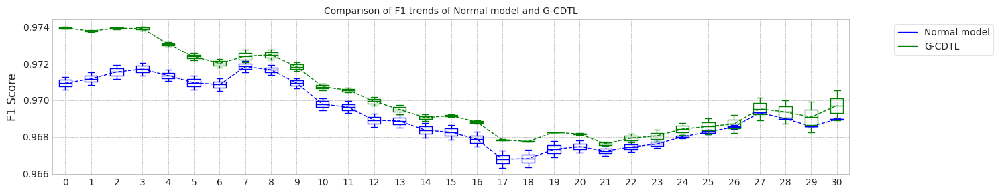

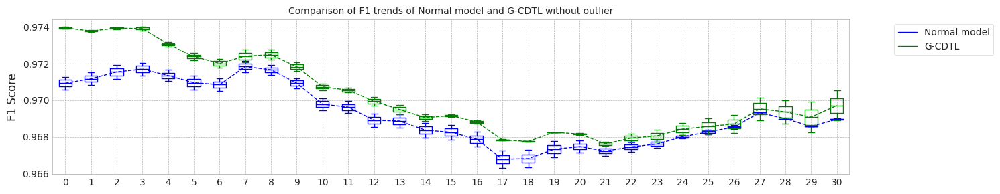

max_mean_trial= 1


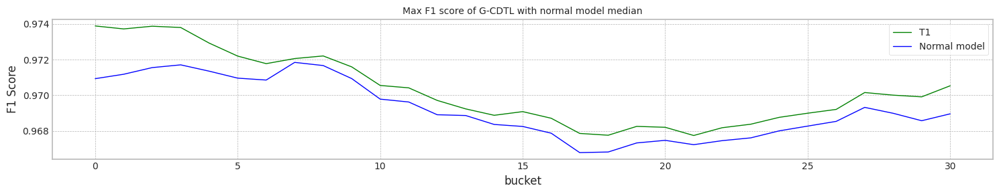

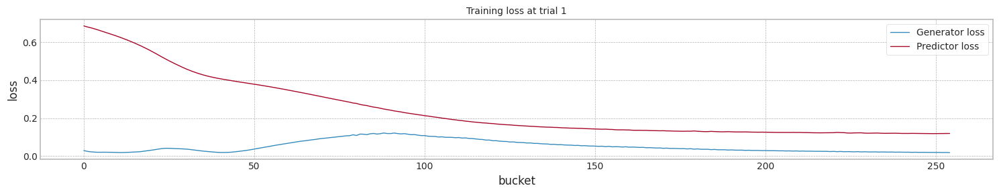

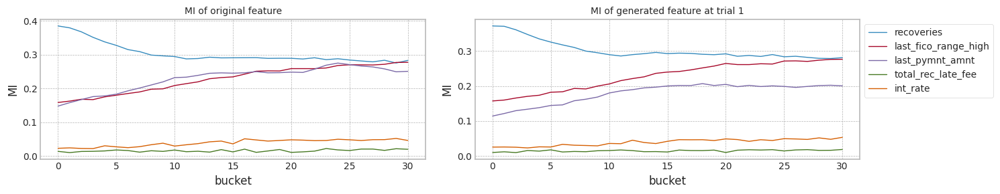

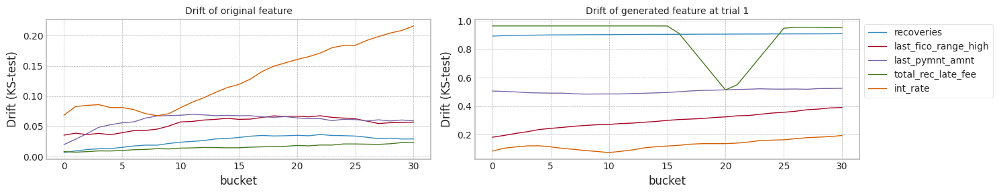

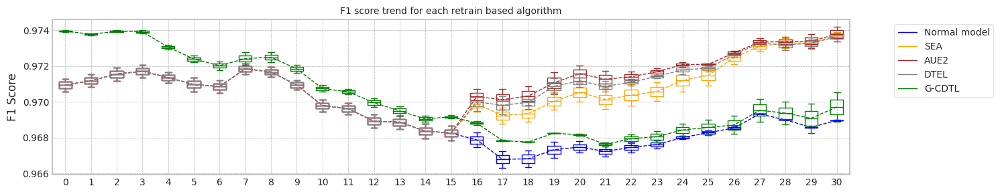

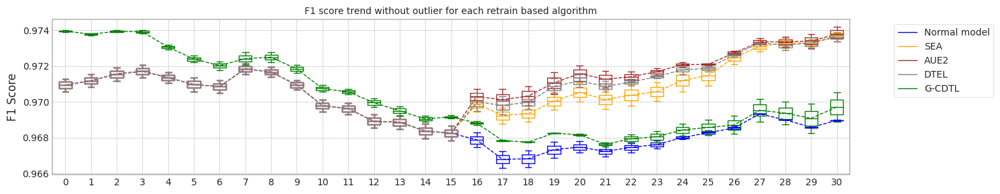

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.415425777435303
Base flops (inference flops of normal model, median): 258332145.0


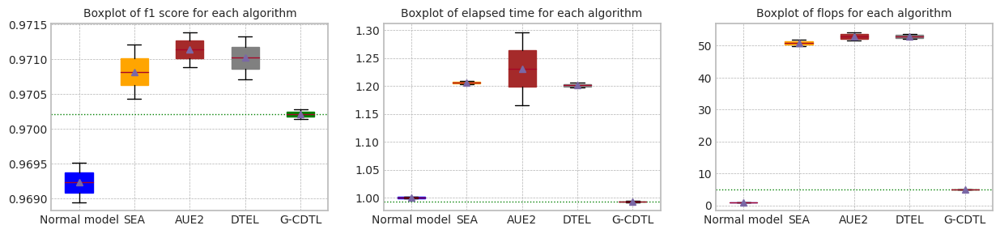

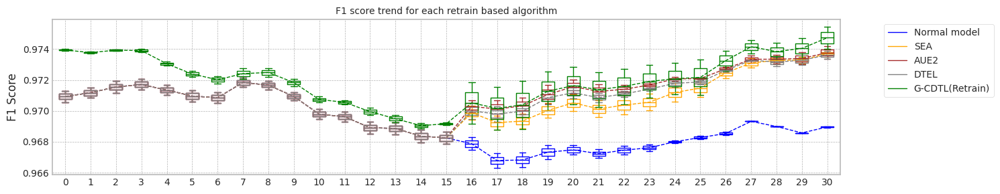

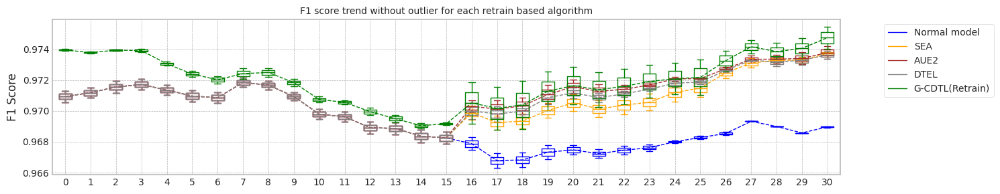

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.415425777435303
Base flops (train + inference flops of normal model, median): 5791640025.0


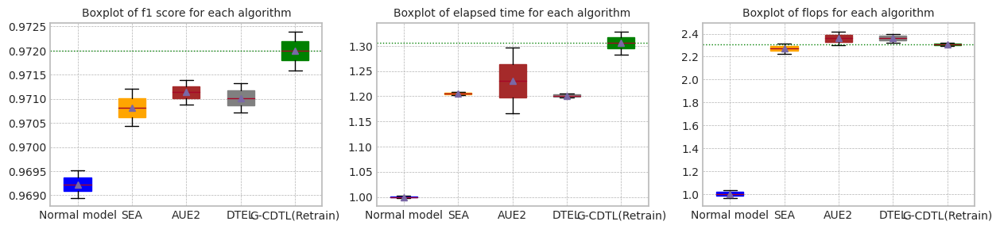

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.415425777435303


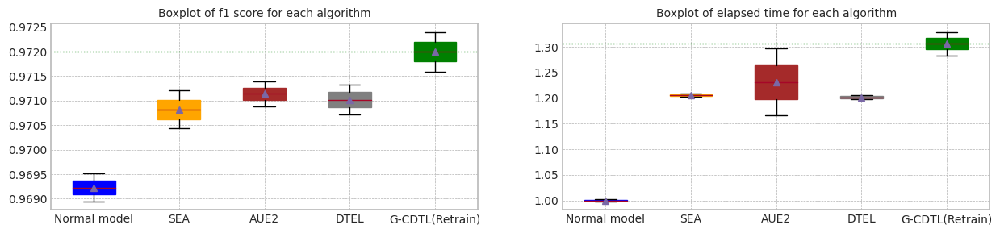

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.968948,0.968927,13.439265,5.724974e+09,258332145.0,5.983306e+09
1,1.0,0.971291,0.971524,0.969509,0.968998,13.391587,5.341642e+09,258332145.0,5.599974e+09
2,median,0.970932,0.971180,0.969228,0.968963,13.415426,5.533308e+09,258332145.0,5.791640e+09
3,std,0.000508,0.000487,0.000397,0.000050,0.033713,2.710564e+08,0.0,2.710564e+08


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.970144,0.968894,13.306082,1.241575e+10,1.297599e+09,1.371335e+10
1,1.0,0.973886,0.973720,0.970278,0.970535,13.331666,1.178012e+10,1.297599e+09,1.307772e+10
2,median,0.973942,0.973776,0.970211,0.969714,13.318874,1.209793e+10,1.297599e+09,1.339553e+10
3,std,0.000079,0.000079,0.000095,0.001160,0.018091,4.494578e+08,0.000000e+00,4.494578e+08


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.970431,0.973518,16.222469,6.189892e+09,7.223221e+09,1.341311e+10
1,1.0,0.971291,0.971524,0.971208,0.973904,16.140239,6.123772e+09,6.773769e+09,1.289754e+10
2,median,0.970932,0.971180,0.970819,0.973711,16.181354,6.156832e+09,6.998495e+09,1.315533e+10
3,std,0.000508,0.000487,0.000549,0.000273,0.058145,4.675390e+07,3.178103e+08,3.645642e+08


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.970887,0.974193,15.637599,6.012412e+09,7.304073e+09,1.331648e+10
1,1.0,0.971291,0.971524,0.971388,0.973356,17.390530,6.554422e+09,7.462751e+09,1.401717e+10
2,median,0.970932,0.971180,0.971138,0.973774,16.514065,6.283417e+09,7.383412e+09,1.366683e+10
3,std,0.000508,0.000487,0.000355,0.000591,1.239509,3.832589e+08,1.122026e+08,4.954615e+08


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.970708,0.973385,16.168681,6.232522e+09,7.657516e+09,1.389004e+10
1,1.0,0.971291,0.971524,0.971331,0.973867,16.056490,6.209032e+09,7.250694e+09,1.345973e+10
2,median,0.970932,0.971180,0.971020,0.973626,16.112585,6.220777e+09,7.454105e+09,1.367488e+10
3,std,0.000508,0.000487,0.000440,0.000341,0.079331,1.660994e+07,2.876663e+08,3.042762e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.971592,0.974023,17.827312,1.317251e+10,285918225.0,1.345843e+10
1,1.0,0.973886,0.973720,0.972398,0.975452,17.217590,1.300643e+10,285918225.0,1.329235e+10
2,median,0.973942,0.973776,0.971995,0.974738,17.522451,1.308947e+10,285918225.0,1.337539e+10
3,std,0.000079,0.000079,0.000570,0.001010,0.431138,1.174363e+08,0.0,1.174363e+08


trial_count: 2
Lambda :  0.8
######################### Retrain 2 Trial 0 for Normal model ###########################
cuda:0
[2023-12-04 06:46:18,760] [INFO] [profiler.py:80:start_profile] Flops profiler started


 34%|███▍      | 686/2000 [00:02<00:05, 233.72it/s]

Early stop: 686
[2023-12-04 06:46:21,704] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5724973665
precision_recall_fscore: (array([0.9141252 , 0.95493549]), array([0.75206339, 0.98673115]), array([0.82521282, 0.97057299]), array([ 3029, 16128]))
Test f1 score: 0.9705729881377123
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9689477522000828
inference_flops: 258332145
######################### Retrain 2 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:46:35,209] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:46:35,211] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 14%|█▍        | 282/2000 [00:04<00:24, 70.47it/s]

[2023-12-04 06:46:39,389] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:46:39,390] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 569920750 9487504250 2358322485 12415747485
precision_recall_fscore: (array([0.95940803, 0.95474035]), array([0.74909211, 0.99404762]), array([0.84130515, 0.97399757]), array([ 3029, 16128]))
Test f1 score: 0.9739975698663427
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.791889
last_fico_range_high    0.231788
last_pymnt_amnt         0.510207
total_rec_late_fee      0.885026
int_rate                0.126363
dtype: float64
Mean F1 for all data: 0.9701435360233125
inference_flops: 1297599395
Normal model median        : 0.9689477522000828
Drift tolerant model median: 0.9701435360233125
######################### Retrain 2 Trial 1 for Normal model ###########################
cuda:0
[2023-12-04 06:46:52,884] [INFO] [profiler.py:80:start_profile] Flops profiler started



 32%|███▏      | 640/2000 [00:02<00:05, 239.21it/s]

Early stop: 640
[2023-12-04 06:46:55,568] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5341642095
precision_recall_fscore: (array([0.92195714, 0.95510669]), array([0.75272367, 0.98803323]), array([0.82878953, 0.97129099]), array([ 3029, 16128]))
Test f1 score: 0.9712909911008168
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9695089781604371
inference_flops: 258332145
######################### Retrain 2 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:47:09,044] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:47:09,047] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 13%|█▎        | 254/2000 [00:03<00:24, 70.16it/s]

[2023-12-04 06:47:13,009] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:47:13,010] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 1106316750 8548811250 2124990225 11780118225
precision_recall_fscore: (array([0.9684529 , 0.95321499]), array([0.73984813, 0.99547371]), array([0.83885458, 0.97388614]), array([ 3029, 16128]))
Test f1 score: 0.9738861423675351
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.36it/s]


mean of drift:
recoveries              0.904265
last_fico_range_high    0.297267
last_pymnt_amnt         0.504243
total_rec_late_fee      0.887199
int_rate                0.127513
dtype: float64
Mean F1 for all data: 0.9702782886982642
inference_flops: 1297599395
Normal model median        : 0.96922836518026
Drift tolerant model median: 0.9702109123607883
######################### Retrain 2 Trial 0 for Normal model ###########################
retrain_interval: 11
######################### Retrain 2 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 32%|███▏      | 10/31 [00:04<00:08,  2.35it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:47:30,964] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:47:30,966] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:47:34,660] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:47:34,661] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 35%|███▌      | 11/31 [00:08<00:31,  1.56s/it]

G-CDTL train flops: 94500000 913500000 227070000 1235070000


 68%|██████▊   | 21/31 [00:12<00:04,  2.08it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:47:39,605] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:47:39,609] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:47:43,103] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:47:43,104] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 71%|███████   | 22/31 [00:16<00:13,  1.52s/it]

G-CDTL train flops: 112000000 836500000 207930000 1156430000


100%|██████████| 31/31 [00:20<00:00,  1.49it/s]


Early stop at  [260, 238]
Train flops  [1235070000, 1156430000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9724889949066705
G_CDTL+AUE median: 0.9724889949066705
######################### Retrain 2 Trial 0 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 35%|███▌      | 11/31 [00:06<00:20,  1.01s/it]

Ensemble_SEA train flops: 585510000


 71%|███████   | 22/31 [00:13<00:10,  1.21s/it]

Ensemble_SEA train flops: 799530000


100%|██████████| 31/31 [00:18<00:00,  1.72it/s]


Early stop at  [672, 918]
Train flops  [585510000, 799530000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9705658267182677
SEA median: 0.9705658267182677
######################### Retrain 2 Trial 0 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 35%|███▌      | 11/31 [00:06<00:17,  1.14it/s]

Ensemble_SEA train flops: 470670000


 71%|███████   | 22/31 [00:13<00:12,  1.36s/it]

Ensemble_SEA train flops: 969180000


100%|██████████| 31/31 [00:17<00:00,  1.72it/s]


Early stop at  [540, 1113]
Train flops  [470670000, 969180000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9708640720037569
AUE median: 0.9708640720037569
######################### Retrain 2 Trial 0 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 35%|███▌      | 11/31 [00:08<00:30,  1.54s/it]

Ensemble_DTEL train flops: 1137960000
Ensemble_DTEL train flops: 1740000


 71%|███████   | 22/31 [00:15<00:10,  1.22s/it]

Ensemble_DTEL train flops: 809970000
Ensemble_DTEL train flops: 1740000


100%|██████████| 31/31 [00:19<00:00,  1.58it/s]


Early stop at  [1307, 1, 930, 1]
Train flops  [1137960000, 1740000, 809970000, 1740000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9698597378586643
DTEL median: 0.9698597378586643
######################### Retrain 2 Trial 1 for Normal model ###########################
retrain_interval: 11
######################### Retrain 2 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 32%|███▏      | 10/31 [00:04<00:08,  2.34it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:48:47,507] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:48:47,510] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:48:51,507] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:48:51,508] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 35%|███▌      | 11/31 [00:08<00:33,  1.65s/it]

G-CDTL train flops: 84000000 973000000 241860000 1298860000


 68%|██████▊   | 21/31 [00:13<00:04,  2.11it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:48:56,367] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:48:56,370] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:48:59,964] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:48:59,966] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 71%|███████   | 22/31 [00:17<00:13,  1.55s/it]

G-CDTL train flops: 73500000 875000000 217500000 1166000000


100%|██████████| 31/31 [00:21<00:00,  1.46it/s]


Early stop at  [277, 249]
Train flops  [1298860000, 1166000000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9728779708126022
G_CDTL+AUE median: 0.9726834828596364
######################### Retrain 2 Trial 1 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 35%|███▌      | 11/31 [00:06<00:19,  1.05it/s]

Ensemble_SEA train flops: 558540000


 71%|███████   | 22/31 [00:13<00:09,  1.04s/it]

Ensemble_SEA train flops: 628140000


100%|██████████| 31/31 [00:17<00:00,  1.81it/s]


Early stop at  [641, 721]
Train flops  [558540000, 628140000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.970911245086851
SEA median: 0.9707385359025593
######################### Retrain 2 Trial 1 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 35%|███▌      | 11/31 [00:08<00:29,  1.49s/it]

Ensemble_SEA train flops: 1104900000


 71%|███████   | 22/31 [00:18<00:18,  2.10s/it]

Ensemble_SEA train flops: 1740000000


100%|██████████| 31/31 [00:22<00:00,  1.38it/s]


Early stop at  [1269, 1999]
Train flops  [1104900000, 1740000000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9712023197923523
AUE median: 0.9710331958980546
######################### Retrain 2 Trial 1 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 35%|███▌      | 11/31 [00:06<00:22,  1.15s/it]

Ensemble_DTEL train flops: 750810000
Ensemble_DTEL train flops: 1740000


 71%|███████   | 22/31 [00:14<00:10,  1.21s/it]

Ensemble_DTEL train flops: 782130000
Ensemble_DTEL train flops: 1740000


100%|██████████| 31/31 [00:18<00:00,  1.70it/s]


Early stop at  [862, 1, 898, 1]
Train flops  [750810000, 1740000, 782130000, 1740000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9704735127799214
DTEL median: 0.9701666253192929


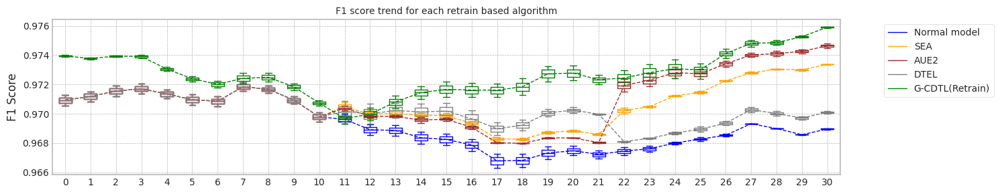

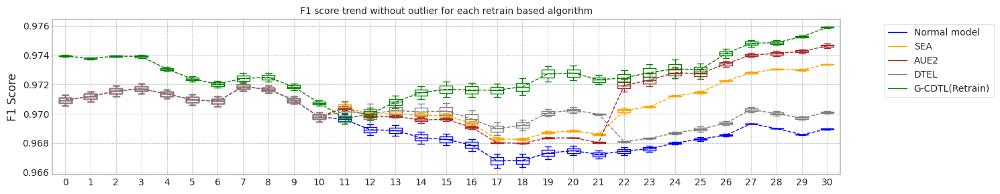

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.465621829032898
Base flops (train + inference flops of normal model, median): 5791640025.0


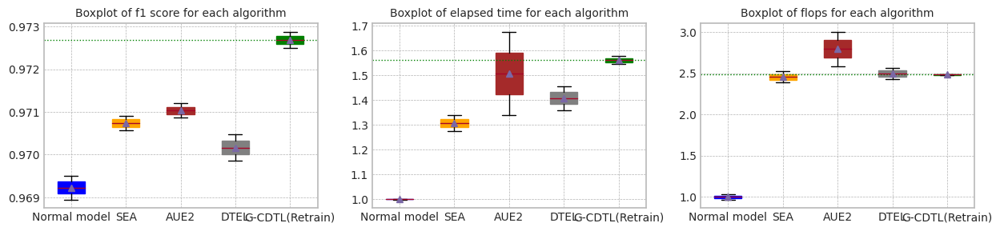

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.465621829032898


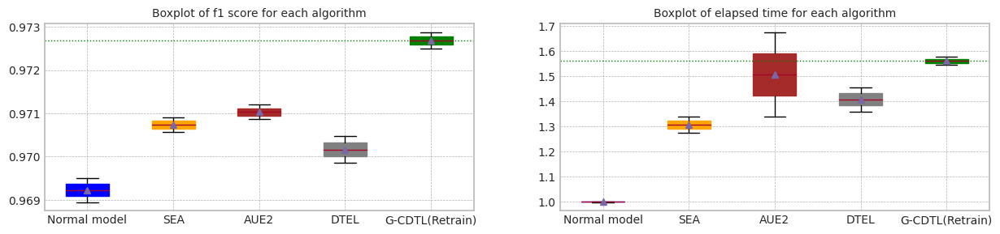

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.968948,0.968927,13.479367,5.724974e+09,258332145.0,5.983306e+09
1,1.0,0.971291,0.971524,0.969509,0.968998,13.451877,5.341642e+09,258332145.0,5.599974e+09
2,median,0.970932,0.971180,0.969228,0.968963,13.465622,5.533308e+09,258332145.0,5.791640e+09
3,std,0.000508,0.000487,0.000397,0.000050,0.019439,2.710564e+08,0.0,2.710564e+08


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.970144,0.968894,13.462800,1.241575e+10,1.297599e+09,1.371335e+10
1,1.0,0.973886,0.973720,0.970278,0.970535,13.191095,1.178012e+10,1.297599e+09,1.307772e+10
2,median,0.973942,0.973776,0.970211,0.969714,13.326947,1.209793e+10,1.297599e+09,1.339553e+10
3,std,0.000079,0.000079,0.000095,0.001160,0.192124,4.494578e+08,0.000000e+00,4.494578e+08


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.970566,0.973395,18.042574,6.726682e+09,7.876677e+09,1.460336e+10
1,1.0,0.971291,0.971524,0.970911,0.973351,17.171937,6.528322e+09,7.294985e+09,1.382331e+10
2,median,0.970932,0.971180,0.970739,0.973373,17.607256,6.627502e+09,7.585831e+09,1.421333e+10
3,std,0.000508,0.000487,0.000244,0.000031,0.615633,1.402617e+08,4.113181e+08,5.515798e+08


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.970864,0.974473,18.023015,6.781492e+09,8.189819e+09,1.497131e+10
1,1.0,0.971291,0.971524,0.971202,0.974798,22.570404,8.186542e+09,9.211537e+09,1.739808e+10
2,median,0.970932,0.971180,0.971033,0.974636,20.296710,7.484017e+09,8.700678e+09,1.618470e+10
3,std,0.000508,0.000487,0.000239,0.000230,3.215489,9.935204e+08,7.224640e+08,1.715984e+09


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.969860,0.970019,19.606059,7.293052e+09,7.580086e+09,1.487314e+10
1,1.0,0.971291,0.971524,0.970474,0.970208,18.299562,6.878062e+09,7.168914e+09,1.404698e+10
2,median,0.970932,0.971180,0.970167,0.970113,18.952811,7.085557e+09,7.374500e+09,1.446006e+10
3,std,0.000508,0.000487,0.000434,0.000134,0.923833,2.934422e+08,2.907422e+08,5.841844e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.972489,0.975940,20.819287,1.417162e+10,171550935.0,1.434317e+10
1,1.0,0.973886,0.973720,0.972878,0.975864,21.231819,1.424498e+10,171550935.0,1.441653e+10
2,median,0.973942,0.973776,0.972683,0.975902,21.025553,1.420830e+10,171550935.0,1.437985e+10
3,std,0.000079,0.000079,0.000275,0.000053,0.291704,5.187335e+07,0.0,5.187335e+07


trial_count: 2
Lambda :  0.8
######################### Retrain 3 Trial 0 for Normal model ###########################
cuda:0
[2023-12-04 06:50:07,435] [INFO] [profiler.py:80:start_profile] Flops profiler started


 34%|███▍      | 686/2000 [00:02<00:05, 243.18it/s]

Early stop: 686
[2023-12-04 06:50:10,263] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5724973665
precision_recall_fscore: (array([0.9141252 , 0.95493549]), array([0.75206339, 0.98673115]), array([0.82521282, 0.97057299]), array([ 3029, 16128]))
Test f1 score: 0.9705729881377123
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9689477522000828
inference_flops: 258332145
######################### Retrain 3 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:50:23,720] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:50:23,723] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 14%|█▍        | 282/2000 [00:04<00:25, 68.46it/s]

[2023-12-04 06:50:28,029] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:50:28,030] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 569920750 9487504250 2358322485 12415747485
precision_recall_fscore: (array([0.95940803, 0.95474035]), array([0.74909211, 0.99404762]), array([0.84130515, 0.97399757]), array([ 3029, 16128]))
Test f1 score: 0.9739975698663427
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]

mean of drift:
recoveries              0.791889
last_fico_range_high    0.231788
last_pymnt_amnt         0.510207
total_rec_late_fee      0.885026
int_rate                0.126363
dtype: float64
Mean F1 for all data: 0.9701435360233125
inference_flops: 1297599395
Normal model median        : 0.9689477522000828
Drift tolerant model median: 0.9701435360233125
######################### Retrain 3 Trial 1 for Normal model ###########################
cuda:0
[2023-12-04 06:50:41,417] [INFO] [profiler.py:80:start_profile] Flops profiler started



 32%|███▏      | 640/2000 [00:02<00:05, 241.80it/s]

Early stop: 640
[2023-12-04 06:50:44,070] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5341642095
precision_recall_fscore: (array([0.92195714, 0.95510669]), array([0.75272367, 0.98803323]), array([0.82878953, 0.97129099]), array([ 3029, 16128]))
Test f1 score: 0.9712909911008168
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.29it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9695089781604371
inference_flops: 258332145
######################### Retrain 3 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:50:57,647] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:50:57,650] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 13%|█▎        | 254/2000 [00:03<00:25, 67.64it/s]

[2023-12-04 06:51:01,759] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:51:01,760] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 1106316750 8548811250 2124990225 11780118225
precision_recall_fscore: (array([0.9684529 , 0.95321499]), array([0.73984813, 0.99547371]), array([0.83885458, 0.97388614]), array([ 3029, 16128]))
Test f1 score: 0.9738861423675351
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


mean of drift:
recoveries              0.904265
last_fico_range_high    0.297267
last_pymnt_amnt         0.504243
total_rec_late_fee      0.887199
int_rate                0.127513
dtype: float64
Mean F1 for all data: 0.9702782886982642
inference_flops: 1297599395
Normal model median        : 0.96922836518026
Drift tolerant model median: 0.9702109123607883
######################### Retrain 3 Trial 0 for Normal model ###########################
retrain_interval: 8
######################### Retrain 3 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:03<00:10,  2.34it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:51:18,529] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:51:18,532] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:51:22,489] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:51:22,491] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 26%|██▌       | 8/31 [00:07<00:38,  1.69s/it]

G-CDTL train flops: 94500000 969500000 240990000 1304990000


 48%|████▊     | 15/31 [00:10<00:08,  1.91it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:51:25,926] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:51:25,929] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:51:29,691] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:51:29,693] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 52%|█████▏    | 16/31 [00:14<00:24,  1.64s/it]

G-CDTL train flops: 112000000 861000000 214020000 1187020000


 74%|███████▍  | 23/31 [00:17<00:04,  1.85it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:51:33,230] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:51:33,233] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:51:36,788] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:51:36,789] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 24/31 [00:21<00:11,  1.58s/it]

G-CDTL train flops: 91000000 871500000 216630000 1179130000


100%|██████████| 31/31 [00:24<00:00,  1.25it/s]


Early stop at  [276, 245, 248]
Train flops  [1304990000, 1187020000, 1179130000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9724521371059482
G_CDTL+AUE median: 0.9724521371059482
######################### Retrain 3 Trial 0 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 26%|██▌       | 8/31 [00:07<00:37,  1.65s/it]

Ensemble_SEA train flops: 1204950000


 52%|█████▏    | 16/31 [00:13<00:19,  1.27s/it]

Ensemble_SEA train flops: 829980000


 77%|███████▋  | 24/31 [00:19<00:09,  1.29s/it]

Ensemble_SEA train flops: 834330000


100%|██████████| 31/31 [00:22<00:00,  1.37it/s]


Early stop at  [1384, 953, 958]
Train flops  [1204950000, 829980000, 834330000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9713691910242813
SEA median: 0.9713691910242813
######################### Retrain 3 Trial 0 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 26%|██▌       | 8/31 [00:05<00:26,  1.16s/it]

Ensemble_SEA train flops: 728190000


 52%|█████▏    | 16/31 [00:10<00:14,  1.01it/s]

Ensemble_SEA train flops: 534180000


 77%|███████▋  | 24/31 [00:16<00:07,  1.13s/it]

Ensemble_SEA train flops: 696870000


100%|██████████| 31/31 [00:19<00:00,  1.57it/s]


Early stop at  [836, 613, 800]
Train flops  [728190000, 534180000, 696870000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9711426732523949
AUE median: 0.9711426732523949
######################### Retrain 3 Trial 0 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 26%|██▌       | 8/31 [00:06<00:31,  1.37s/it]

Ensemble_DTEL train flops: 932640000
Ensemble_DTEL train flops: 2610000


 48%|████▊     | 15/31 [00:09<00:07,  2.02it/s]

Ensemble_DTEL train flops: 783870000


 52%|█████▏    | 16/31 [00:13<00:22,  1.51s/it]

Ensemble_DTEL train flops: 284490000


 77%|███████▋  | 24/31 [00:18<00:07,  1.09s/it]

Ensemble_DTEL train flops: 632490000
Ensemble_DTEL train flops: 2610000


100%|██████████| 31/31 [00:21<00:00,  1.42it/s]


Early stop at  [1071, 2, 900, 326, 726, 2]
Train flops  [932640000, 2610000, 783870000, 284490000, 632490000, 2610000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9709881639156753
DTEL median: 0.9709881639156753
######################### Retrain 3 Trial 1 for Normal model ###########################
retrain_interval: 8
######################### Retrain 3 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:03<00:10,  2.31it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:52:47,726] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:52:47,729] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:52:52,550] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:52:52,551] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 26%|██▌       | 8/31 [00:08<00:45,  1.98s/it]

G-CDTL train flops: 63000000 1179500000 293190000 1535690000


 48%|████▊     | 15/31 [00:11<00:08,  1.81it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:52:55,998] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:52:56,001] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:52:59,901] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:52:59,902] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 52%|█████▏    | 16/31 [00:15<00:25,  1.70s/it]

G-CDTL train flops: 80500000 920500000 228810000 1229810000


 74%|███████▍  | 23/31 [00:18<00:04,  1.80it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:53:03,569] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:53:03,573] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:53:07,786] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:53:07,788] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 24/31 [00:23<00:12,  1.79s/it]

G-CDTL train flops: 49000000 1039500000 258390000 1346890000


100%|██████████| 31/31 [00:26<00:00,  1.16it/s]


Early stop at  [336, 262, 296]
Train flops  [1535690000, 1229810000, 1346890000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9727256904098626
G_CDTL+AUE median: 0.9725889137579053
######################### Retrain 3 Trial 1 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 26%|██▌       | 8/31 [00:06<00:35,  1.53s/it]

Ensemble_SEA train flops: 1044870000


 52%|█████▏    | 16/31 [00:12<00:15,  1.05s/it]

Ensemble_SEA train flops: 581160000


 77%|███████▋  | 24/31 [00:19<00:11,  1.67s/it]

Ensemble_SEA train flops: 1217130000


100%|██████████| 31/31 [00:22<00:00,  1.35it/s]


Early stop at  [1200, 667, 1398]
Train flops  [1044870000, 581160000, 1217130000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9715993679389141
SEA median: 0.9714842794815977
######################### Retrain 3 Trial 1 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 26%|██▌       | 8/31 [00:05<00:23,  1.00s/it]

Ensemble_SEA train flops: 509820000


 52%|█████▏    | 16/31 [00:11<00:18,  1.24s/it]

Ensemble_SEA train flops: 764730000


 77%|███████▋  | 24/31 [00:17<00:08,  1.27s/it]

Ensemble_SEA train flops: 816060000


100%|██████████| 31/31 [00:20<00:00,  1.49it/s]


Early stop at  [585, 878, 937]
Train flops  [509820000, 764730000, 816060000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9712542407310201
AUE median: 0.9711984569917075
######################### Retrain 3 Trial 1 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 26%|██▌       | 8/31 [00:05<00:21,  1.05it/s]

Ensemble_DTEL train flops: 503730000
Ensemble_DTEL train flops: 1740000


 52%|█████▏    | 16/31 [00:11<00:21,  1.43s/it]

Ensemble_DTEL train flops: 1026600000
Ensemble_DTEL train flops: 1740000


 77%|███████▋  | 24/31 [00:19<00:12,  1.74s/it]

Ensemble_DTEL train flops: 1273680000
Ensemble_DTEL train flops: 1740000


100%|██████████| 31/31 [00:22<00:00,  1.38it/s]


Early stop at  [578, 1, 1179, 1, 1463, 1]
Train flops  [503730000, 1740000, 1026600000, 1740000, 1273680000, 1740000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9697548341943903
DTEL median: 0.9703714990550328


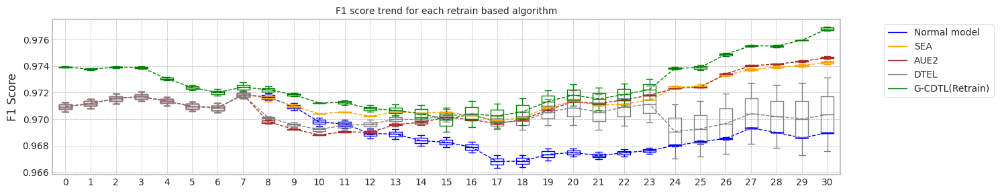

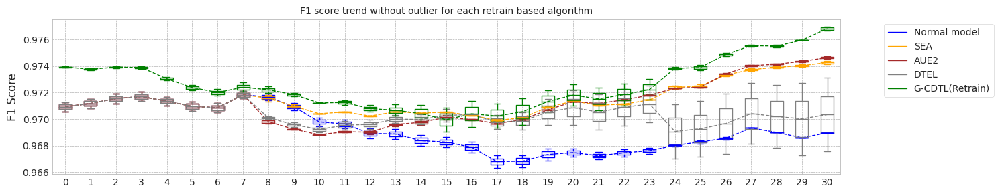

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.495792627334595
Base flops (train + inference flops of normal model, median): 5791640025.0


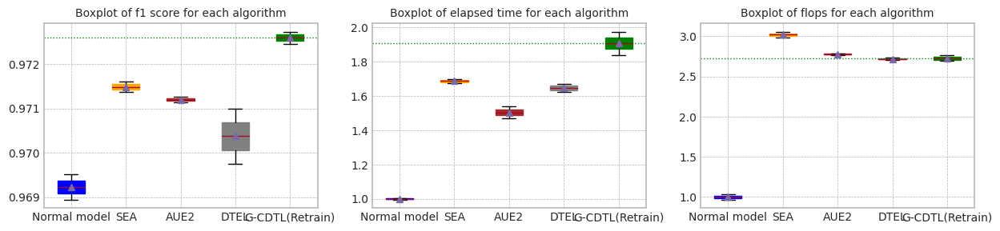

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.495792627334595


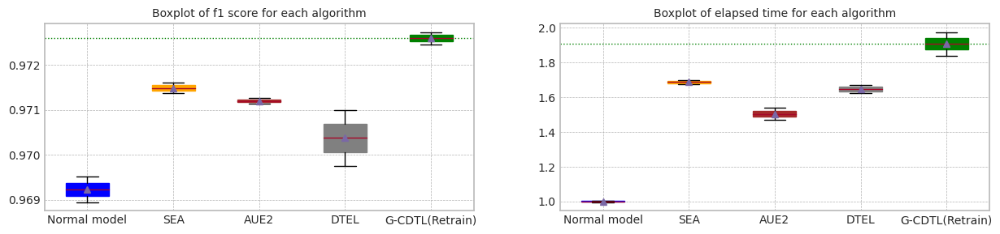

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.968948,0.968927,13.436829,5.724974e+09,258332145.0,5.983306e+09
1,1.0,0.971291,0.971524,0.969509,0.968998,13.554756,5.341642e+09,258332145.0,5.599974e+09
2,median,0.970932,0.971180,0.969228,0.968963,13.495793,5.533308e+09,258332145.0,5.791640e+09
3,std,0.000508,0.000487,0.000397,0.000050,0.083387,2.710564e+08,0.0,2.710564e+08


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.970144,0.968894,13.359325,1.241575e+10,1.297599e+09,1.371335e+10
1,1.0,0.973886,0.973720,0.970278,0.970535,13.263369,1.178012e+10,1.297599e+09,1.307772e+10
2,median,0.973942,0.973776,0.970211,0.969714,13.311347,1.209793e+10,1.297599e+09,1.339553e+10
3,std,0.000079,0.000079,0.000095,0.001160,0.067852,4.494578e+08,0.000000e+00,4.494578e+08


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.971369,0.974142,22.604276,8.210902e+09,9.494230e+09,1.770513e+10
1,1.0,0.971291,0.971524,0.971599,0.974424,22.932833,8.184802e+09,9.084798e+09,1.726960e+10
2,median,0.970932,0.971180,0.971484,0.974283,22.768555,8.197852e+09,9.289514e+09,1.748737e+10
3,std,0.000508,0.000487,0.000163,0.000199,0.232325,1.845549e+07,2.895118e+08,3.079673e+08


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.971143,0.974745,19.824853,7.300882e+09,8.842542e+09,1.614342e+10
1,1.0,0.971291,0.971524,0.971254,0.974540,20.790479,7.432252e+09,8.590580e+09,1.602283e+10
2,median,0.970932,0.971180,0.971198,0.974642,20.307666,7.366567e+09,8.716561e+09,1.608313e+10
3,std,0.000508,0.000487,0.000079,0.000145,0.682801,9.289262e+07,1.781637e+08,8.527112e+07


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.970988,0.973120,21.900144,7.980352e+09,7.688836e+09,1.566919e+10
1,1.0,0.971291,0.971524,0.969755,0.967562,22.574365,8.150872e+09,7.662204e+09,1.581308e+10
2,median,0.970932,0.971180,0.970371,0.970341,22.237255,8.065612e+09,7.675520e+09,1.574113e+10
3,std,0.000508,0.000487,0.000872,0.003931,0.476746,1.205758e+08,1.883136e+07,1.017445e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.972452,0.976991,24.841809,1.545126e+10,133428505.0,1.558469e+10
1,1.0,0.973886,0.973720,0.972726,0.976673,26.661248,1.589251e+10,133428505.0,1.602594e+10
2,median,0.973942,0.973776,0.972589,0.976832,25.751528,1.567188e+10,133428505.0,1.580531e+10
3,std,0.000079,0.000079,0.000193,0.000224,1.286538,3.120109e+08,0.0,3.120109e+08


trial_count: 2
Lambda :  0.8
######################### Retrain 4 Trial 0 for Normal model ###########################
cuda:0
[2023-12-04 06:54:21,827] [INFO] [profiler.py:80:start_profile] Flops profiler started


 34%|███▍      | 686/2000 [00:03<00:05, 222.23it/s]

Early stop: 686
[2023-12-04 06:54:24,921] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5724973665
precision_recall_fscore: (array([0.9141252 , 0.95493549]), array([0.75206339, 0.98673115]), array([0.82521282, 0.97057299]), array([ 3029, 16128]))
Test f1 score: 0.9705729881377123
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9689477522000828
inference_flops: 258332145
######################### Retrain 4 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:54:38,430] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:54:38,433] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 14%|█▍        | 282/2000 [00:04<00:25, 67.10it/s]

[2023-12-04 06:54:42,841] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:54:42,842] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 569920750 9487504250 2358322485 12415747485
precision_recall_fscore: (array([0.95940803, 0.95474035]), array([0.74909211, 0.99404762]), array([0.84130515, 0.97399757]), array([ 3029, 16128]))
Test f1 score: 0.9739975698663427
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.791889
last_fico_range_high    0.231788
last_pymnt_amnt         0.510207
total_rec_late_fee      0.885026
int_rate                0.126363
dtype: float64
Mean F1 for all data: 0.9701435360233125
inference_flops: 1297599395
Normal model median        : 0.9689477522000828
Drift tolerant model median: 0.9701435360233125
######################### Retrain 4 Trial 1 for Normal model ###########################
cuda:0
[2023-12-04 06:54:56,300] [INFO] [profiler.py:80:start_profile] Flops profiler started



 32%|███▏      | 640/2000 [00:02<00:05, 239.78it/s]

Early stop: 640
[2023-12-04 06:54:58,975] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5341642095
precision_recall_fscore: (array([0.92195714, 0.95510669]), array([0.75272367, 0.98803323]), array([0.82878953, 0.97129099]), array([ 3029, 16128]))
Test f1 score: 0.9712909911008168
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.30it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9695089781604371
inference_flops: 258332145
######################### Retrain 4 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:55:12,493] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:55:12,497] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 13%|█▎        | 254/2000 [00:03<00:25, 67.30it/s]

[2023-12-04 06:55:16,620] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:55:16,622] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 1106316750 8548811250 2124990225 11780118225
precision_recall_fscore: (array([0.9684529 , 0.95321499]), array([0.73984813, 0.99547371]), array([0.83885458, 0.97388614]), array([ 3029, 16128]))
Test f1 score: 0.9738861423675351
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


mean of drift:
recoveries              0.904265
last_fico_range_high    0.297267
last_pymnt_amnt         0.504243
total_rec_late_fee      0.887199
int_rate                0.127513
dtype: float64
Mean F1 for all data: 0.9702782886982642
inference_flops: 1297599395
Normal model median        : 0.96922836518026
Drift tolerant model median: 0.9702109123607883
######################### Retrain 4 Trial 0 for Normal model ###########################
retrain_interval: 7
######################### Retrain 4 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


  3%|▎         | 1/31 [00:00<00:12,  2.32it/s]

retrain: G_CDTL_AUE2 4 0


  6%|▋         | 2/31 [00:00<00:12,  2.35it/s]

retrain: G_CDTL_AUE2 4 0


 10%|▉         | 3/31 [00:01<00:12,  2.30it/s]

retrain: G_CDTL_AUE2 4 0


 13%|█▎        | 4/31 [00:01<00:11,  2.31it/s]

retrain: G_CDTL_AUE2 4 0


 16%|█▌        | 5/31 [00:02<00:11,  2.30it/s]

retrain: G_CDTL_AUE2 4 0


 19%|█▉        | 6/31 [00:02<00:10,  2.30it/s]

retrain: G_CDTL_AUE2 4 0
retrain: G_CDTL_AUE2 4 0
G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:55:33,043] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:55:33,046] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:55:36,845] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:55:36,847] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 23%|██▎       | 7/31 [00:06<00:40,  1.69s/it]

G-CDTL train flops: 94500000 899500000 223590000 1217590000


 42%|████▏     | 13/31 [00:09<00:10,  1.78it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:55:39,808] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:55:39,811] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:55:43,642] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:55:43,643] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 45%|████▌     | 14/31 [00:13<00:28,  1.68s/it]

G-CDTL train flops: 112000000 896000000 222720000 1230720000


 65%|██████▍   | 20/31 [00:16<00:06,  1.67it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:55:46,837] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:55:46,839] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:55:50,821] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:55:50,822] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 68%|██████▊   | 21/31 [00:20<00:17,  1.76s/it]

G-CDTL train flops: 91000000 945000000 234900000 1270900000


 87%|████████▋ | 27/31 [00:23<00:02,  1.68it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:55:53,939] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:55:53,942] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:55:58,240] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:55:58,242] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 90%|█████████ | 28/31 [00:28<00:05,  1.84s/it]

G-CDTL train flops: 101500000 1001000000 248820000 1351320000


100%|██████████| 31/31 [00:29<00:00,  1.05it/s]


Early stop at  [256, 255, 269, 285]
Train flops  [1217590000, 1230720000, 1270900000, 1351320000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9725106979022895
G_CDTL+AUE median: 0.9725106979022895
######################### Retrain 4 Trial 0 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:05<00:33,  1.38s/it]

Ensemble_SEA train flops: 879570000


 45%|████▌     | 14/31 [00:10<00:14,  1.17it/s]

Ensemble_SEA train flops: 372360000


 68%|██████▊   | 21/31 [00:15<00:11,  1.12s/it]

Ensemble_SEA train flops: 643800000


 90%|█████████ | 28/31 [00:21<00:04,  1.44s/it]

Ensemble_SEA train flops: 963090000


100%|██████████| 31/31 [00:22<00:00,  1.35it/s]


Early stop at  [1010, 427, 739, 1106]
Train flops  [879570000, 372360000, 643800000, 963090000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9710255193220678
SEA median: 0.9710255193220678
######################### Retrain 4 Trial 0 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:05<00:33,  1.39s/it]

Ensemble_SEA train flops: 878700000


 45%|████▌     | 14/31 [00:11<00:19,  1.16s/it]

Ensemble_SEA train flops: 672510000


 68%|██████▊   | 21/31 [00:17<00:16,  1.64s/it]

Ensemble_SEA train flops: 1145790000


 90%|█████████ | 28/31 [00:24<00:04,  1.52s/it]

Ensemble_SEA train flops: 994410000


100%|██████████| 31/31 [00:25<00:00,  1.21it/s]


Early stop at  [1009, 772, 1316, 1142]
Train flops  [878700000, 672510000, 1145790000, 994410000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9716229351529815
AUE median: 0.9716229351529815
######################### Retrain 4 Trial 0 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:07<00:42,  1.79s/it]

Ensemble_DTEL train flops: 1271070000
Ensemble_DTEL train flops: 1740000


 45%|████▌     | 14/31 [00:14<00:29,  1.75s/it]

Ensemble_DTEL train flops: 1236270000
Ensemble_DTEL train flops: 1740000


 68%|██████▊   | 21/31 [00:18<00:10,  1.02s/it]

Ensemble_DTEL train flops: 474150000
Ensemble_DTEL train flops: 1740000


 90%|█████████ | 28/31 [00:26<00:05,  1.78s/it]

Ensemble_DTEL train flops: 1330230000
Ensemble_DTEL train flops: 1740000


100%|██████████| 31/31 [00:27<00:00,  1.13it/s]


Early stop at  [1460, 1, 1420, 1, 544, 1, 1528, 1]
Train flops  [1271070000, 1740000, 1236270000, 1740000, 474150000, 1740000, 1330230000, 1740000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9701765674663698
DTEL median: 0.9701765674663698
######################### Retrain 4 Trial 1 for Normal model ###########################
retrain_interval: 7
######################### Retrain 4 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


  3%|▎         | 1/31 [00:00<00:12,  2.31it/s]

retrain: G_CDTL_AUE2 4 0


  6%|▋         | 2/31 [00:00<00:12,  2.31it/s]

retrain: G_CDTL_AUE2 4 0


 10%|▉         | 3/31 [00:01<00:12,  2.30it/s]

retrain: G_CDTL_AUE2 4 0


 13%|█▎        | 4/31 [00:01<00:11,  2.33it/s]

retrain: G_CDTL_AUE2 4 0


 16%|█▌        | 5/31 [00:02<00:11,  2.33it/s]

retrain: G_CDTL_AUE2 4 0


 19%|█▉        | 6/31 [00:02<00:10,  2.31it/s]

retrain: G_CDTL_AUE2 4 0
retrain: G_CDTL_AUE2 4 0
G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:57:18,865] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:57:18,867] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:57:26,260] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:57:26,262] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 23%|██▎       | 7/31 [00:10<01:08,  2.86s/it]

G-CDTL train flops: 108500000 1802500000 448050000 2359050000


 42%|████▏     | 13/31 [00:12<00:12,  1.45it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:57:29,236] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:57:29,238] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:57:37,714] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:57:37,716] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 45%|████▌     | 14/31 [00:21<00:53,  3.17s/it]

G-CDTL train flops: 56000000 2054500000 510690000 2621190000


 65%|██████▍   | 20/31 [00:24<00:08,  1.33it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:57:40,764] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:57:40,768] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:57:44,953] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:57:44,955] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 68%|██████▊   | 21/31 [00:29<00:19,  1.92s/it]

G-CDTL train flops: 143500000 941500000 234030000 1319030000


 87%|████████▋ | 27/31 [00:31<00:02,  1.59it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 06:57:48,157] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:57:48,160] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 06:57:58,292] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:57:58,294] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 90%|█████████ | 28/31 [00:42<00:10,  3.62s/it]

G-CDTL train flops: 80500000 2443000000 607260000 3130760000


100%|██████████| 31/31 [00:43<00:00,  1.41s/it]


Early stop at  [514, 586, 268, 697]
Train flops  [2359050000, 2621190000, 1319030000, 3130760000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9729326311638657
G_CDTL+AUE median: 0.9727216645330776
######################### Retrain 4 Trial 1 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:05<00:32,  1.37s/it]

Ensemble_SEA train flops: 870000000


 45%|████▌     | 14/31 [00:11<00:21,  1.28s/it]

Ensemble_SEA train flops: 771690000


 68%|██████▊   | 21/31 [00:17<00:13,  1.39s/it]

Ensemble_SEA train flops: 893490000


 90%|█████████ | 28/31 [00:23<00:03,  1.32s/it]

Ensemble_SEA train flops: 822150000


100%|██████████| 31/31 [00:24<00:00,  1.26it/s]


Early stop at  [999, 886, 1026, 944]
Train flops  [870000000, 771690000, 893490000, 822150000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9715103974730905
SEA median: 0.9712679583975792
######################### Retrain 4 Trial 1 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:05<00:31,  1.33s/it]

Ensemble_SEA train flops: 823890000


 45%|████▌     | 14/31 [00:11<00:20,  1.23s/it]

Ensemble_SEA train flops: 736890000


 68%|██████▊   | 21/31 [00:15<00:09,  1.05it/s]

Ensemble_SEA train flops: 452400000


 90%|█████████ | 28/31 [00:22<00:04,  1.49s/it]

Ensemble_SEA train flops: 998760000


100%|██████████| 31/31 [00:23<00:00,  1.32it/s]


Early stop at  [946, 846, 519, 1147]
Train flops  [823890000, 736890000, 452400000, 998760000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9721987849135504
AUE median: 0.971910860033266
######################### Retrain 4 Trial 1 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 23%|██▎       | 7/31 [00:05<00:30,  1.28s/it]

Ensemble_DTEL train flops: 796920000
Ensemble_DTEL train flops: 1740000


 45%|████▌     | 14/31 [00:11<00:21,  1.28s/it]

Ensemble_DTEL train flops: 773430000
Ensemble_DTEL train flops: 1740000


 68%|██████▊   | 21/31 [00:16<00:12,  1.29s/it]

Ensemble_DTEL train flops: 792570000
Ensemble_DTEL train flops: 1740000


 90%|█████████ | 28/31 [00:24<00:05,  1.94s/it]

Ensemble_DTEL train flops: 1412880000
Ensemble_DTEL train flops: 1740000


100%|██████████| 31/31 [00:25<00:00,  1.19it/s]


Early stop at  [915, 1, 888, 1, 910, 1, 1623, 1]
Train flops  [796920000, 1740000, 773430000, 1740000, 792570000, 1740000, 1412880000, 1740000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9706180120334442
DTEL median: 0.970397289749907


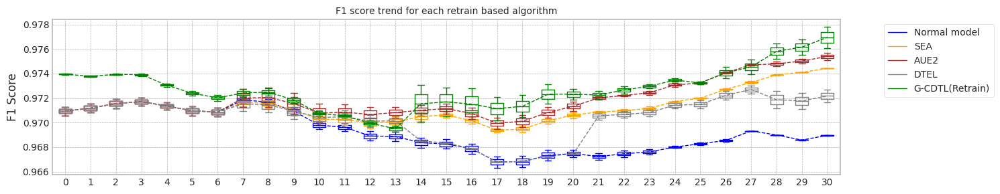

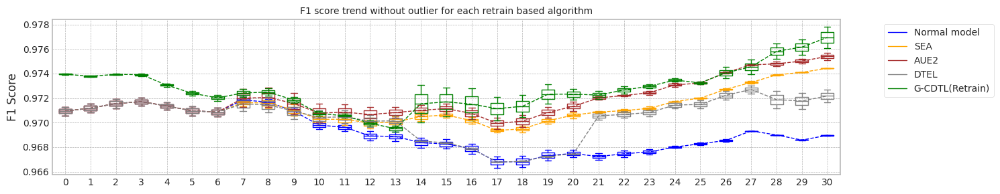

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.490026116371155
Base flops (train + inference flops of normal model, median): 5791640025.0


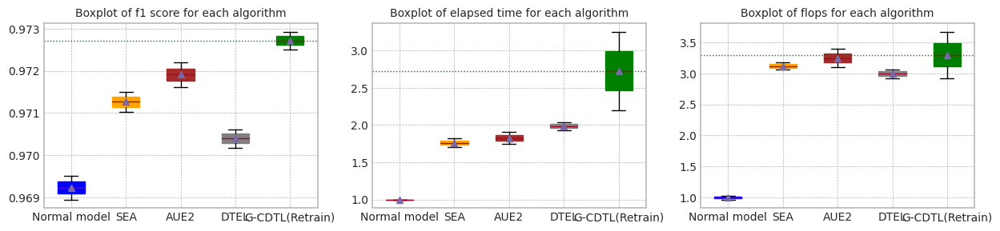

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.490026116371155


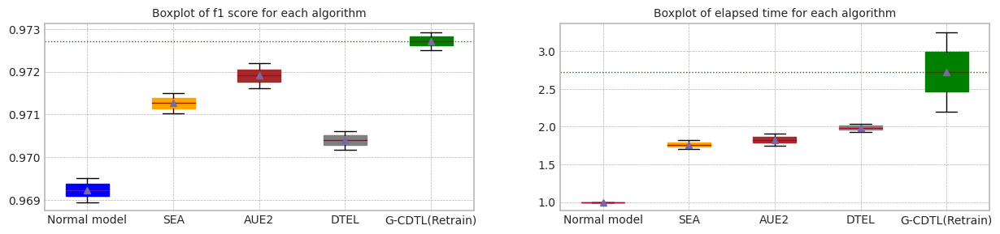

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.968948,0.968927,13.482557,5.724974e+09,258332145.0,5.983306e+09
1,1.0,0.971291,0.971524,0.969509,0.968998,13.497496,5.341642e+09,258332145.0,5.599974e+09
2,median,0.970932,0.971180,0.969228,0.968963,13.490026,5.533308e+09,258332145.0,5.791640e+09
3,std,0.000508,0.000487,0.000397,0.000050,0.010564,2.710564e+08,0.0,2.710564e+08


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.970144,0.968894,13.431492,1.241575e+10,1.297599e+09,1.371335e+10
1,1.0,0.973886,0.973720,0.970278,0.970535,13.299577,1.178012e+10,1.297599e+09,1.307772e+10
2,median,0.973942,0.973776,0.970211,0.969714,13.365534,1.209793e+10,1.297599e+09,1.339553e+10
3,std,0.000079,0.000079,0.000095,0.001160,0.093279,4.494578e+08,0.000000e+00,4.494578e+08


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.971026,0.974405,22.961556,8.200462e+09,9.558789e+09,1.775925e+10
1,1.0,0.971291,0.971524,0.971510,0.974443,24.552717,8.698972e+09,9.673968e+09,1.837294e+10
2,median,0.970932,0.971180,0.971268,0.974424,23.757136,8.449717e+09,9.616378e+09,1.806610e+10
3,std,0.000508,0.000487,0.000343,0.000027,1.125121,3.524998e+08,8.144345e+07,4.339433e+08


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.971623,0.975692,25.719959,9.033052e+09,1.064971e+10,1.968276e+10
1,1.0,0.971291,0.971524,0.972199,0.975094,23.575053,8.353582e+09,9.586910e+09,1.794049e+10
2,median,0.970932,0.971180,0.971911,0.975393,24.647506,8.693317e+09,1.011831e+10,1.881163e+10
3,std,0.000508,0.000487,0.000407,0.000423,1.516677,4.804578e+08,7.515142e+08,1.231972e+09


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.970177,0.972674,27.500662,9.660322e+09,8.103826e+09,1.776415e+10
1,1.0,0.971291,0.971524,0.970618,0.971668,26.023160,9.124402e+09,7.803144e+09,1.692755e+10
2,median,0.970932,0.971180,0.970397,0.972171,26.761911,9.392362e+09,7.953485e+09,1.734585e+10
3,std,0.000508,0.000487,0.000312,0.000711,1.044752,3.789527e+08,2.126140e+08,5.915666e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.972511,0.976071,29.662403,1.685065e+10,57183645.0,1.690783e+10
1,1.0,0.973886,0.973720,0.972933,0.977817,43.890662,2.121015e+10,57183645.0,2.126733e+10
2,median,0.973942,0.973776,0.972722,0.976944,36.776533,1.903040e+10,57183645.0,1.908758e+10
3,std,0.000079,0.000079,0.000298,0.001235,10.060898,3.082632e+09,0.0,3.082632e+09


trial_count: 2
Lambda :  0.8
######################### Retrain 5 Trial 0 for Normal model ###########################
cuda:0
[2023-12-04 06:59:18,935] [INFO] [profiler.py:80:start_profile] Flops profiler started


 34%|███▍      | 686/2000 [00:03<00:05, 226.57it/s]

Early stop: 686
[2023-12-04 06:59:21,970] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5724973665
precision_recall_fscore: (array([0.9141252 , 0.95493549]), array([0.75206339, 0.98673115]), array([0.82521282, 0.97057299]), array([ 3029, 16128]))
Test f1 score: 0.9705729881377123
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9689477522000828
inference_flops: 258332145
######################### Retrain 5 Trial 0 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 06:59:35,451] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 06:59:35,453] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 14%|█▍        | 282/2000 [00:04<00:26, 64.71it/s]

[2023-12-04 06:59:40,020] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 06:59:40,022] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 569920750 9487504250 2358322485 12415747485
precision_recall_fscore: (array([0.95940803, 0.95474035]), array([0.74909211, 0.99404762]), array([0.84130515, 0.97399757]), array([ 3029, 16128]))
Test f1 score: 0.9739975698663427
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]

mean of drift:
recoveries              0.791889
last_fico_range_high    0.231788
last_pymnt_amnt         0.510207
total_rec_late_fee      0.885026
int_rate                0.126363
dtype: float64
Mean F1 for all data: 0.9701435360233125
inference_flops: 1297599395
Normal model median        : 0.9689477522000828
Drift tolerant model median: 0.9701435360233125
######################### Retrain 5 Trial 1 for Normal model ###########################
cuda:0
[2023-12-04 06:59:53,413] [INFO] [profiler.py:80:start_profile] Flops profiler started



 32%|███▏      | 640/2000 [00:02<00:05, 232.69it/s]

Early stop: 640
[2023-12-04 06:59:56,171] [INFO] [profiler.py:226:end_profile] Flops profiler finished


Normal discriminator train flops : 5341642095
precision_recall_fscore: (array([0.92195714, 0.95510669]), array([0.75272367, 0.98803323]), array([0.82878953, 0.97129099]), array([ 3029, 16128]))
Test f1 score: 0.9712909911008168
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]

mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9695089781604371
inference_flops: 258332145
######################### Retrain 5 Trial 1 for G-CDTL ###########################
cuda:0
G-CDTL Train: torch.Size([19157, 6])
[2023-12-04 07:00:09,557] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:00:09,559] [INFO] [profiler.py:80:start_profile] Flops profiler started


min_bucket_num: 0.0


 13%|█▎        | 254/2000 [00:03<00:26, 65.83it/s]

[2023-12-04 07:00:13,791] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:00:13,792] [INFO] [profiler.py:226:end_profile] Flops profiler finished


G-CDTL train flops: 1106316750 8548811250 2124990225 11780118225
precision_recall_fscore: (array([0.9684529 , 0.95321499]), array([0.73984813, 0.99547371]), array([0.83885458, 0.97388614]), array([ 3029, 16128]))
Test f1 score: 0.9738861423675351
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set (31, 19157, 6)


100%|██████████| 31/31 [00:13<00:00,  2.32it/s]


mean of drift:
recoveries              0.904265
last_fico_range_high    0.297267
last_pymnt_amnt         0.504243
total_rec_late_fee      0.887199
int_rate                0.127513
dtype: float64
Mean F1 for all data: 0.9702782886982642
inference_flops: 1297599395
Normal model median        : 0.96922836518026
Drift tolerant model median: 0.9702109123607883
######################### Retrain 5 Trial 0 for Normal model ###########################
retrain_interval: 6
######################### Retrain 5 Trial 0 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


  3%|▎         | 1/31 [00:00<00:13,  2.27it/s]

retrain: G_CDTL_AUE2 5 0


  6%|▋         | 2/31 [00:00<00:12,  2.26it/s]

retrain: G_CDTL_AUE2 5 0


 10%|▉         | 3/31 [00:01<00:12,  2.26it/s]

retrain: G_CDTL_AUE2 5 0


 13%|█▎        | 4/31 [00:01<00:11,  2.28it/s]

retrain: G_CDTL_AUE2 5 0


 16%|█▌        | 5/31 [00:02<00:11,  2.28it/s]

retrain: G_CDTL_AUE2 5 0
retrain: G_CDTL_AUE2 5 0
G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:00:29,854] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:00:29,857] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:00:33,979] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:00:33,980] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 19%|█▉        | 6/31 [00:06<00:46,  1.84s/it]

G-CDTL train flops: 94500000 945000000 234900000 1274400000


 35%|███▌      | 11/31 [00:08<00:12,  1.56it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:00:36,567] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:00:36,570] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:00:40,475] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:00:40,477] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 39%|███▊      | 12/31 [00:13<00:33,  1.77s/it]

G-CDTL train flops: 112000000 868000000 215760000 1195760000


 55%|█████▍    | 17/31 [00:15<00:09,  1.51it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:00:43,161] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:00:43,164] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:00:47,398] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:00:47,400] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 58%|█████▊    | 18/31 [00:20<00:24,  1.88s/it]

G-CDTL train flops: 91000000 962500000 239250000 1292750000


 74%|███████▍  | 23/31 [00:22<00:05,  1.46it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:00:50,085] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:00:50,087] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:00:58,185] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:00:58,186] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 24/31 [00:30<00:21,  3.05s/it]

G-CDTL train flops: 98000000 1886500000 468930000 2453430000


 94%|█████████▎| 29/31 [00:33<00:01,  1.14it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:01:00,847] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:01:00,850] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:01:05,078] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:01:05,079] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 97%|█████████▋| 30/31 [00:37<00:02,  2.02s/it]

G-CDTL train flops: 70000000 976500000 242730000 1289230000


100%|██████████| 31/31 [00:38<00:00,  1.24s/it]


Early stop at  [269, 247, 274, 538, 278]
Train flops  [1274400000, 1195760000, 1292750000, 2453430000, 1289230000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9729626408558821
G_CDTL+AUE median: 0.9729626408558821
######################### Retrain 5 Trial 0 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 19%|█▉        | 6/31 [00:04<00:28,  1.16s/it]

Ensemble_SEA train flops: 650760000


 39%|███▊      | 12/31 [00:10<00:26,  1.39s/it]

Ensemble_SEA train flops: 857820000


 58%|█████▊    | 18/31 [00:15<00:18,  1.42s/it]

Ensemble_SEA train flops: 876960000


 77%|███████▋  | 24/31 [00:21<00:09,  1.36s/it]

Ensemble_SEA train flops: 796050000


 97%|█████████▋| 30/31 [00:26<00:01,  1.46s/it]

Ensemble_SEA train flops: 903930000


100%|██████████| 31/31 [00:27<00:00,  1.14it/s]


Early stop at  [747, 985, 1007, 914, 1038]
Train flops  [650760000, 857820000, 876960000, 796050000, 903930000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9711175965760679
SEA median: 0.9711175965760679
######################### Retrain 5 Trial 0 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


  3%|▎         | 1/31 [00:00<00:12,  2.38it/s]

retrain: Ensemble_AUE2 5 0


  6%|▋         | 2/31 [00:00<00:12,  2.38it/s]

retrain: Ensemble_AUE2 5 0


 10%|▉         | 3/31 [00:01<00:11,  2.37it/s]

retrain: Ensemble_AUE2 5 0


 13%|█▎        | 4/31 [00:01<00:11,  2.37it/s]

retrain: Ensemble_AUE2 5 0


 16%|█▌        | 5/31 [00:02<00:10,  2.37it/s]

retrain: Ensemble_AUE2 5 0
retrain: Ensemble_AUE2 5 0


 19%|█▉        | 6/31 [00:07<00:55,  2.20s/it]

Ensemble_SEA train flops: 1557300000


 39%|███▊      | 12/31 [00:12<00:22,  1.18s/it]

Ensemble_SEA train flops: 555930000


 58%|█████▊    | 18/31 [00:18<00:20,  1.55s/it]

Ensemble_SEA train flops: 1010070000


 77%|███████▋  | 24/31 [00:23<00:09,  1.29s/it]

Ensemble_SEA train flops: 716010000


 97%|█████████▋| 30/31 [00:29<00:01,  1.53s/it]

Ensemble_SEA train flops: 995280000


100%|██████████| 31/31 [00:29<00:00,  1.04it/s]


Early stop at  [1789, 638, 1160, 822, 1143]
Train flops  [1557300000, 555930000, 1010070000, 716010000, 995280000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9710334109896662
AUE median: 0.9710334109896662
######################### Retrain 5 Trial 0 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 19%|█▉        | 6/31 [00:04<00:29,  1.18s/it]

Ensemble_DTEL train flops: 662940000
Ensemble_DTEL train flops: 1740000


 39%|███▊      | 12/31 [00:10<00:26,  1.41s/it]

Ensemble_DTEL train flops: 910020000
Ensemble_DTEL train flops: 1740000


 58%|█████▊    | 18/31 [00:18<00:28,  2.20s/it]

Ensemble_DTEL train flops: 1636470000
Ensemble_DTEL train flops: 1740000


 77%|███████▋  | 24/31 [00:23<00:10,  1.50s/it]

Ensemble_DTEL train flops: 866520000
Ensemble_DTEL train flops: 2610000


 97%|█████████▋| 30/31 [00:29<00:01,  1.61s/it]

Ensemble_DTEL train flops: 1030950000
Ensemble_DTEL train flops: 2610000


100%|██████████| 31/31 [00:30<00:00,  1.02it/s]


Early stop at  [761, 1, 1045, 1, 1880, 1, 995, 2, 1184, 2]
Train flops  [662940000, 1740000, 910020000, 1740000, 1636470000, 1740000, 866520000, 2610000, 1030950000, 2610000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9696813476817351
DTEL median: 0.9696813476817351
######################### Retrain 5 Trial 1 for Normal model ###########################
retrain_interval: 6
######################### Retrain 5 Trial 1 for G_CDTL+AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


  3%|▎         | 1/31 [00:00<00:13,  2.27it/s]

retrain: G_CDTL_AUE2 5 0


  6%|▋         | 2/31 [00:00<00:12,  2.27it/s]

retrain: G_CDTL_AUE2 5 0


 10%|▉         | 3/31 [00:01<00:12,  2.29it/s]

retrain: G_CDTL_AUE2 5 0


 13%|█▎        | 4/31 [00:01<00:11,  2.30it/s]

retrain: G_CDTL_AUE2 5 0


 16%|█▌        | 5/31 [00:02<00:11,  2.28it/s]

retrain: G_CDTL_AUE2 5 0
retrain: G_CDTL_AUE2 5 0
G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:02:35,649] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:02:35,652] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:02:40,053] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:02:40,055] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 19%|█▉        | 6/31 [00:07<00:48,  1.94s/it]

G-CDTL train flops: 87500000 1008000000 250560000 1346060000


 35%|███▌      | 11/31 [00:09<00:13,  1.53it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:02:42,624] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:02:42,626] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:02:46,849] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:02:46,850] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 39%|███▊      | 12/31 [00:13<00:35,  1.87s/it]

G-CDTL train flops: 80500000 927500000 230550000 1238550000


 55%|█████▍    | 17/31 [00:16<00:09,  1.47it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:02:49,527] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:02:49,529] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:02:54,053] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:02:54,055] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 58%|█████▊    | 18/31 [00:21<00:25,  1.97s/it]

G-CDTL train flops: 80500000 1043000000 259260000 1382760000


 74%|███████▍  | 23/31 [00:23<00:05,  1.42it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:02:56,754] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:02:56,757] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:03:05,574] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:03:05,576] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 77%|███████▋  | 24/31 [00:32<00:22,  3.27s/it]

G-CDTL train flops: 1844500000 805000000 200100000 2849600000


 94%|█████████▎| 29/31 [00:34<00:01,  1.09it/s]

G-CDTL Train: torch.Size([2000, 6])
[2023-12-04 07:03:08,216] [INFO] [profiler.py:80:start_profile] Flops profiler started
[2023-12-04 07:03:08,219] [INFO] [profiler.py:80:start_profile] Flops profiler started
min_bucket_num: 0.0
[2023-12-04 07:03:17,070] [INFO] [profiler.py:226:end_profile] Flops profiler finished
[2023-12-04 07:03:17,072] [INFO] [profiler.py:226:end_profile] Flops profiler finished


 97%|█████████▋| 30/31 [00:44<00:03,  3.43s/it]

G-CDTL train flops: 45500000 2058000000 511560000 2615060000


100%|██████████| 31/31 [00:44<00:00,  1.44s/it]


Early stop at  [287, 264, 297, 229, 587]
Train flops  [1346060000, 1238550000, 1382760000, 2849600000, 2615060000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9730100823773389
G_CDTL+AUE median: 0.9729863616166106
######################### Retrain 5 Trial 1 for SEA ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 19%|█▉        | 6/31 [00:04<00:27,  1.12s/it]

Ensemble_SEA train flops: 590730000


 39%|███▊      | 12/31 [00:10<00:26,  1.42s/it]

Ensemble_SEA train flops: 897840000


 58%|█████▊    | 18/31 [00:16<00:22,  1.70s/it]

Ensemble_SEA train flops: 1156230000


 77%|███████▋  | 24/31 [00:22<00:10,  1.44s/it]

Ensemble_SEA train flops: 856950000


 97%|█████████▋| 30/31 [00:27<00:01,  1.25s/it]

Ensemble_SEA train flops: 683820000


100%|██████████| 31/31 [00:27<00:00,  1.13it/s]


Early stop at  [678, 1031, 1328, 984, 785]
Train flops  [590730000, 897840000, 1156230000, 856950000, 683820000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9715388974373196
SEA median: 0.9713282470066937
######################### Retrain 5 Trial 1 for AUE ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


  3%|▎         | 1/31 [00:00<00:12,  2.41it/s]

retrain: Ensemble_AUE2 5 0


  6%|▋         | 2/31 [00:00<00:12,  2.39it/s]

retrain: Ensemble_AUE2 5 0


 10%|▉         | 3/31 [00:01<00:11,  2.37it/s]

retrain: Ensemble_AUE2 5 0


 13%|█▎        | 4/31 [00:01<00:11,  2.39it/s]

retrain: Ensemble_AUE2 5 0


 16%|█▌        | 5/31 [00:02<00:10,  2.38it/s]

retrain: Ensemble_AUE2 5 0
retrain: Ensemble_AUE2 5 0


 19%|█▉        | 6/31 [00:06<00:40,  1.64s/it]

Ensemble_SEA train flops: 1054440000


 39%|███▊      | 12/31 [00:12<00:33,  1.78s/it]

Ensemble_SEA train flops: 1181460000


 58%|█████▊    | 18/31 [00:18<00:18,  1.40s/it]

Ensemble_SEA train flops: 789090000


 77%|███████▋  | 24/31 [00:23<00:09,  1.40s/it]

Ensemble_SEA train flops: 809970000


 97%|█████████▋| 30/31 [00:28<00:01,  1.19s/it]

Ensemble_SEA train flops: 625530000


100%|██████████| 31/31 [00:28<00:00,  1.08it/s]


Early stop at  [1211, 1357, 906, 930, 718]
Train flops  [1054440000, 1181460000, 789090000, 809970000, 625530000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9716944410304149
AUE median: 0.9713639260100406
######################### Retrain 5 Trial 1 for DTEL ###########################
X_live.shape (79896, 6)
Truncate 17896 rows from live_set (79896, 6)
Search MI & Drift...for X_live_set torch.Size([31, 19157, 6])


 19%|█▉        | 6/31 [00:04<00:30,  1.22s/it]

Ensemble_DTEL train flops: 688170000
Ensemble_DTEL train flops: 1740000


 39%|███▊      | 12/31 [00:11<00:31,  1.64s/it]

Ensemble_DTEL train flops: 1101420000
Ensemble_DTEL train flops: 1740000


 58%|█████▊    | 18/31 [00:16<00:17,  1.38s/it]

Ensemble_DTEL train flops: 787350000
Ensemble_DTEL train flops: 1740000


 77%|███████▋  | 24/31 [00:22<00:10,  1.55s/it]

Ensemble_DTEL train flops: 970050000
Ensemble_DTEL train flops: 2610000


 97%|█████████▋| 30/31 [00:28<00:01,  1.59s/it]

Ensemble_DTEL train flops: 1006590000
Ensemble_DTEL train flops: 2610000


100%|██████████| 31/31 [00:28<00:00,  1.07it/s]


Early stop at  [790, 1, 1265, 1, 904, 1, 1114, 2, 1156, 2]
Train flops  [688170000, 1740000, 1101420000, 1740000, 787350000, 1740000, 970050000, 2610000, 1006590000, 2610000]
Mean of drift:
recoveries              0.026107
last_fico_range_high    0.054955
last_pymnt_amnt         0.059522
total_rec_late_fee      0.015453
int_rate                0.129595
dtype: float64
Mean F1 for all data: 0.9704439393300356
DTEL median: 0.9700626435058853


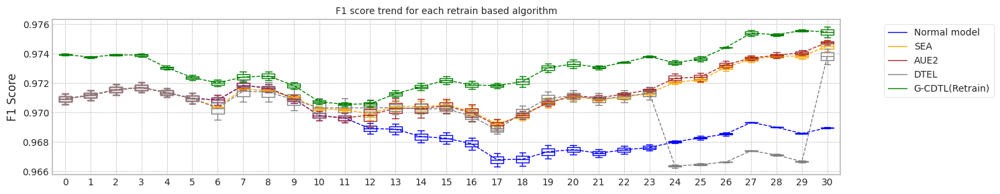

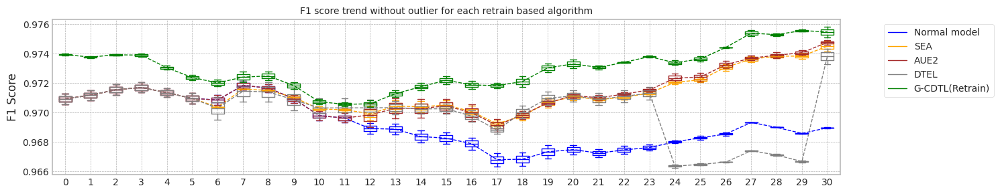

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.412983775138855
Base flops (train + inference flops of normal model, median): 5791640025.0


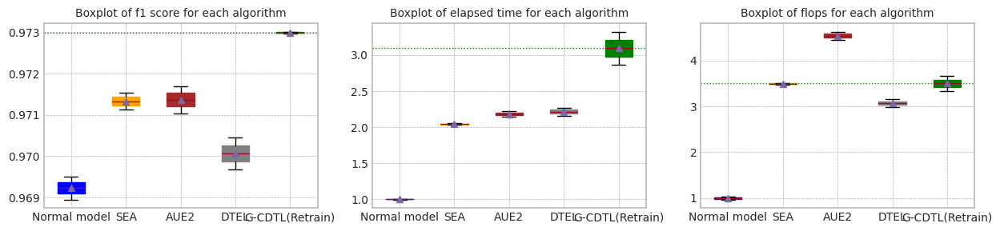

Base elapsed time (inference elapsed time of normal model, median (ms)): 13.412983775138855


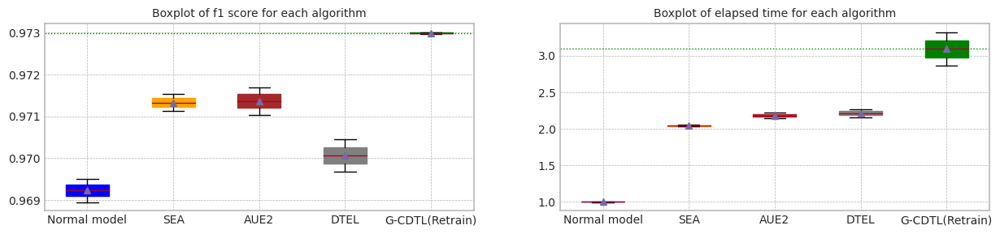

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.968948,0.968927,13.461018,5.724974e+09,258332145.0,5.983306e+09
1,1.0,0.971291,0.971524,0.969509,0.968998,13.364949,5.341642e+09,258332145.0,5.599974e+09
2,median,0.970932,0.971180,0.969228,0.968963,13.412984,5.533308e+09,258332145.0,5.791640e+09
3,std,0.000508,0.000487,0.000397,0.000050,0.067931,2.710564e+08,0.0,2.710564e+08


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.970144,0.968894,13.359775,1.241575e+10,1.297599e+09,1.371335e+10
1,1.0,0.973886,0.973720,0.970278,0.970535,13.375181,1.178012e+10,1.297599e+09,1.307772e+10
2,median,0.973942,0.973776,0.970211,0.969714,13.367478,1.209793e+10,1.297599e+09,1.339553e+10
3,std,0.000079,0.000079,0.000095,0.001160,0.010894,4.494578e+08,0.000000e+00,4.494578e+08


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.971118,0.974161,27.264235,9.427162e+09,1.087716e+10,2.030432e+10
1,1.0,0.971291,0.971524,0.971539,0.974868,27.563771,9.527212e+09,1.059387e+10,2.012109e+10
2,median,0.970932,0.971180,0.971328,0.974515,27.414003,9.477187e+09,1.073551e+10,2.021270e+10
3,std,0.000508,0.000487,0.000298,0.000500,0.211804,7.074603e+07,2.003103e+08,1.295643e+08


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.971033,0.974612,29.757462,1.017623e+10,1.662723e+10,2.680346e+10
1,1.0,0.971291,0.971524,0.971694,0.974939,28.753025,9.802132e+09,1.598933e+10,2.579146e+10
2,median,0.970932,0.971180,0.971364,0.974775,29.255243,9.989182e+09,1.630828e+10,2.629746e+10
3,std,0.000508,0.000487,0.000467,0.000232,0.710244,2.645286e+08,4.510656e+08,7.155943e+08


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.970573,0.970835,0.969681,0.973311,30.407494,1.045898e+10,7.808026e+09,1.826701e+10
1,1.0,0.971291,0.971524,0.970444,0.974352,28.976732,9.905662e+09,7.400334e+09,1.730600e+10
2,median,0.970932,0.971180,0.970063,0.973832,29.692113,1.018232e+10,7.604180e+09,1.778650e+10
3,std,0.000508,0.000487,0.000539,0.000736,1.011701,3.912563e+08,2.882815e+08,6.795378e+08


@ G-CDTL+Retrain


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time,Train flops,Inference flops,flops
0,0.0,0.973998,0.973832,0.972963,0.975131,38.362497,1.928569e+10,19061215.0,1.930475e+10
1,1.0,0.973886,0.973720,0.973010,0.975844,44.551751,2.121215e+10,19061215.0,2.123121e+10
2,median,0.973942,0.973776,0.972986,0.975488,41.457124,2.024892e+10,19061215.0,2.026798e+10
3,std,0.000079,0.000079,0.000034,0.000505,4.376463,1.362213e+09,0.0,1.362213e+09


Test F1 Score: 0.9709319896192645
G-CDTL, 1-retrain: 0.9719952080977247


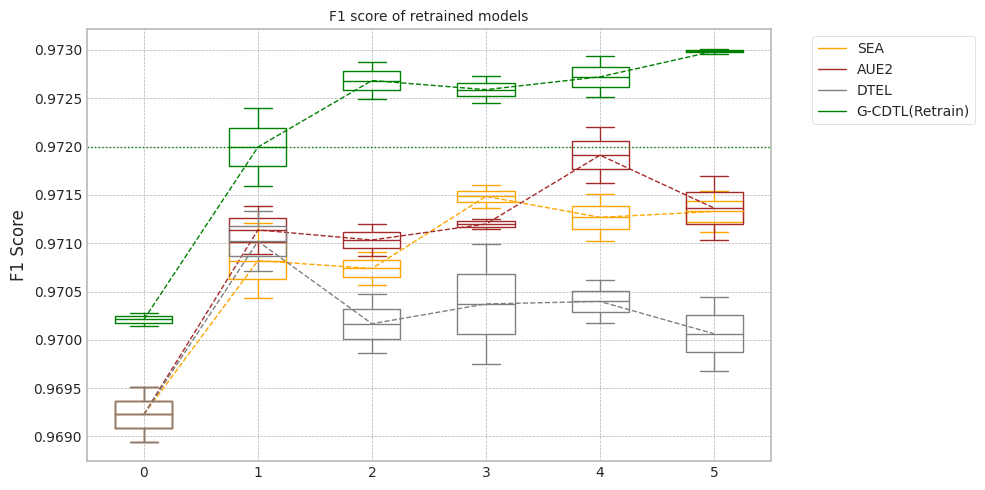

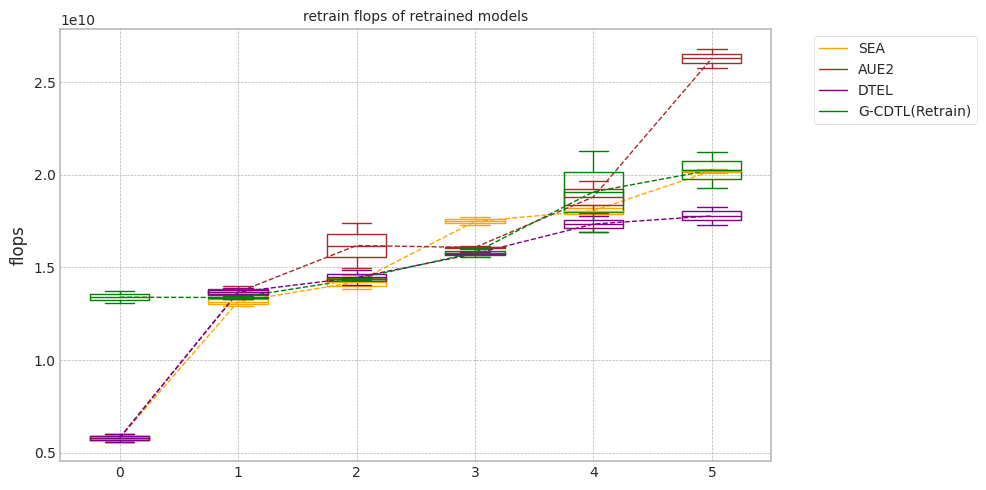

In [ ]:
experiment_all(2000,'LC_B',X1, Y1,train_size, test_size,avaible_range = 400,
               lambda_f2=0.8,trial_count=2,lr_g=0.004,retrain_count=5,weight_init=True)